#**Capstone Project**

#**PROJECT OBJECTIVE:**
Design a ML/DL based chatbot utility which can help the professionals to highlight the safety risk as per the incident
description.

#**Milestone 1:**

**Step 1: Import the data [ 3 points ]**

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# importing the CSV file
data = pd.read_excel("/content/drive/MyDrive/Colab Notebooks/Data+Set+-+industrial_safety_and_health_database_with_accidents_description.xlsx")

In [ ]:
data['Accident Level'][4]

'IV'

In [ ]:
data.head()

,Unnamed: 0,Data,Countries,Local,Industry Sector,Accident Level,Potential Accident Level,Genre,Employee or Third Party,Critical Risk,Description
0,0,2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...
1,1,2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...
2,2,2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...
3,3,2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,4,2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...


In [ ]:
data.shape

(425, 11)

**Step 2: Data cleansing [ 5 points ]**



**Steps followed for Data Cleansing:**
1. Check for missing values in the data set
2. Check for duplicate entries in the data set
3. Perform EDA for all the relevant features present in the data set
4. Drop the columns that represents unique identifiers, such as Unnamed, Data, Countries, Local, Genre, Employee or Third Party, Potential Accident Risk.
5. Encoding the target variable - Accident Level, into numerical variables for ease of representation.
6. Again, check for any duplicates after removing unwanted features.
7. Get final shape of the dataset, before NLP Preprocessing.

In [ ]:
#Creating a back up of original data set, before further processing
df = data

In [ ]:
#Checking for missing values in the data
for i in data.columns:
    df_na = data[i].isnull().sum()
    df_total = data[i].shape[0]
    print("Missing value percentage for column {0} is {1:0.2f}%".format(i,df_na/df_total*100))

Missing value percentage for column Unnamed: 0 is 0.00%
Missing value percentage for column Data is 0.00%
Missing value percentage for column Countries is 0.00%
Missing value percentage for column Local is 0.00%
Missing value percentage for column Industry Sector is 0.00%
Missing value percentage for column Accident Level is 0.00%
Missing value percentage for column Potential Accident Level is 0.00%
Missing value percentage for column Genre is 0.00%
Missing value percentage for column Employee or Third Party is 0.00%
Missing value percentage for column Critical Risk is 0.00%
Missing value percentage for column Description is 0.00%


In [ ]:
#Checking for duplicate rows in the dataset
data.duplicated().sum()

0

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 425 entries, 0 to 424
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Unnamed: 0                425 non-null    int64         
 1   Data                      425 non-null    datetime64[ns]
 2   Countries                 425 non-null    object        
 3   Local                     425 non-null    object        
 4   Industry Sector           425 non-null    object        
 5   Accident Level            425 non-null    object        
 6   Potential Accident Level  425 non-null    object        
 7   Genre                     425 non-null    object        
 8   Employee or Third Party   425 non-null    object        
 9   Critical Risk             425 non-null    object        
 10  Description               425 non-null    object        
dtypes: datetime64[ns](1), int64(1), object(9)
memory usage: 36.6+ KB


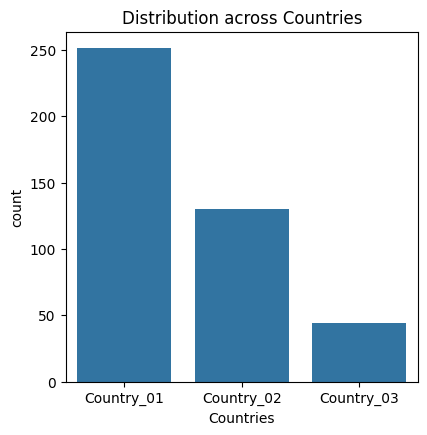

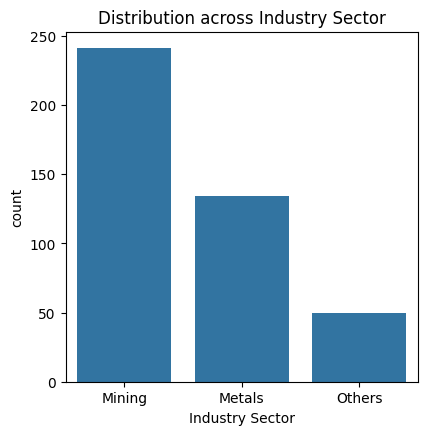

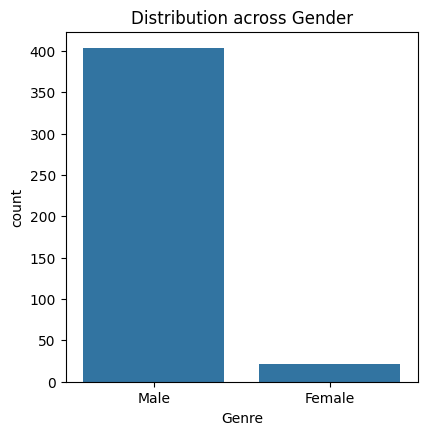

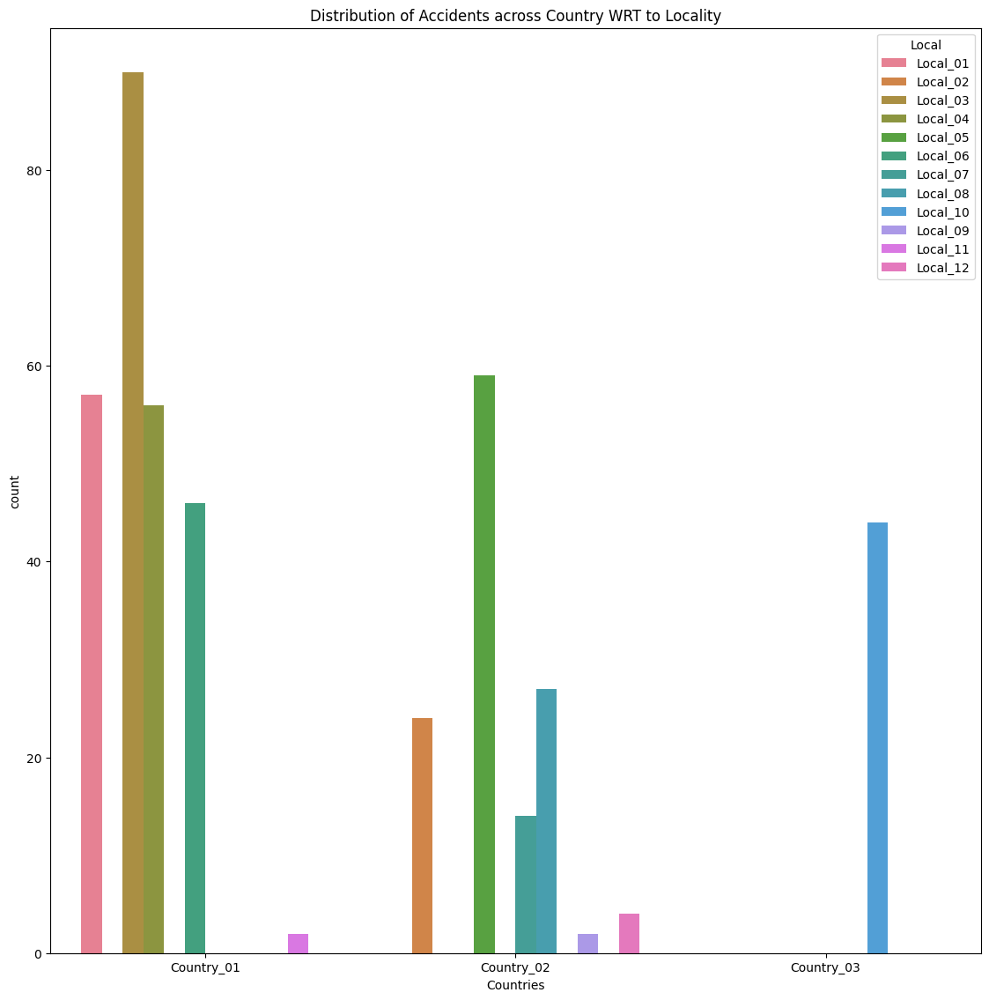

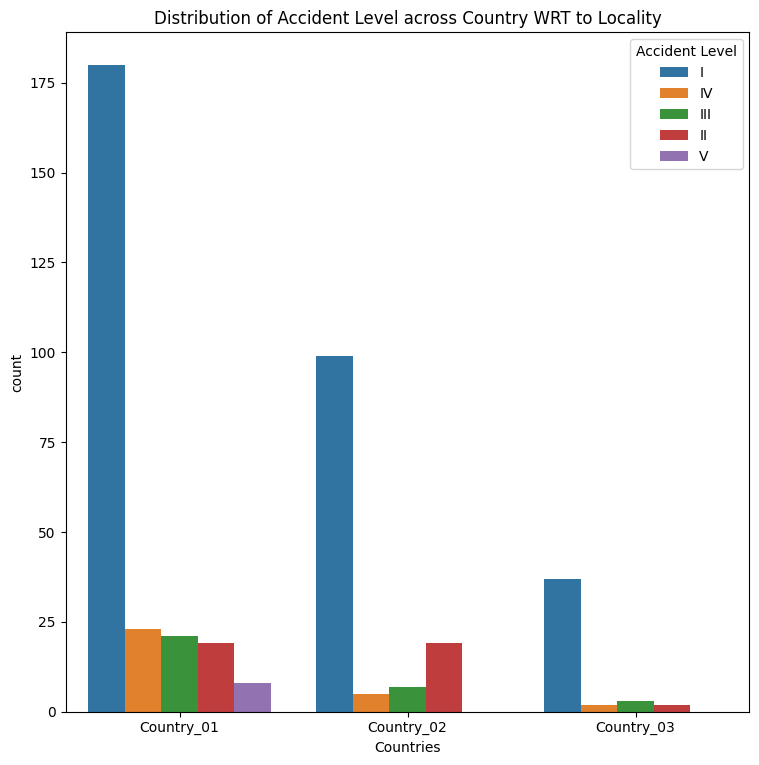

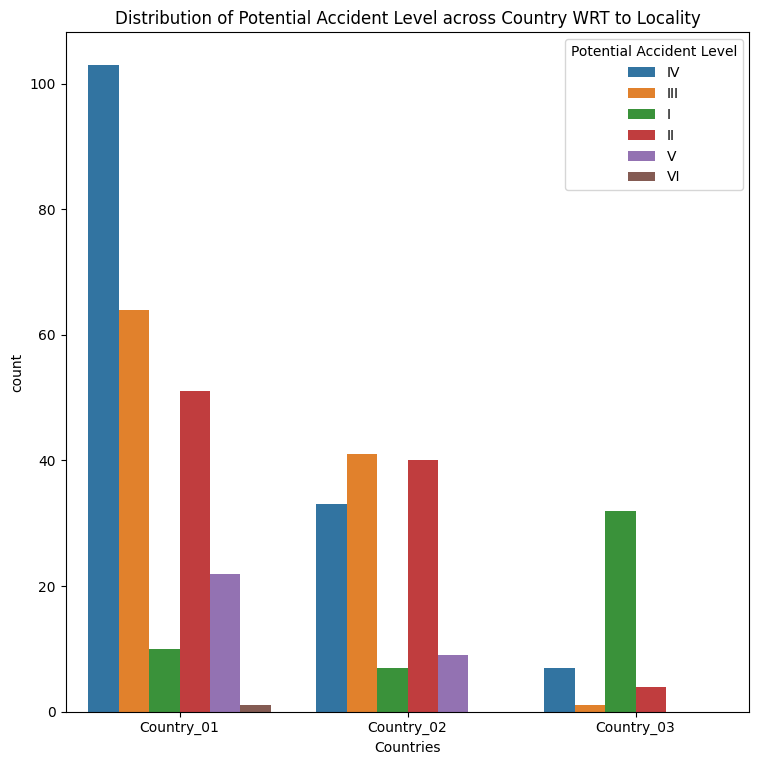

In [ ]:
#Univariate and Bivariate Analysis of given features
plt.figure(figsize = (10,10))
plt.subplot(2,2,1)
sns.countplot(x='Countries',data=data)
plt.title('Distribution across Countries');

plt.figure(figsize = (10,10))
plt.subplot(2,2,2)
sns.countplot(x='Industry Sector',data=data)
plt.title('Distribution across Industry Sector');

plt.figure(figsize = (10,10))
plt.subplot(2,2,3)
sns.countplot(x='Genre',data=data)
plt.title('Distribution across Gender');

plt.figure(figsize = (30,30))
plt.subplot(2,2,4)
sns.countplot(x='Countries',data=data,hue='Local')
plt.title('Distribution of Accidents across Country WRT to Locality');

plt.figure(figsize = (30,30))
plt.subplot(3,3,1)
sns.countplot(x='Countries',data=data,hue='Accident Level')
plt.title('Distribution of Accident Level across Country WRT to Locality');

plt.figure(figsize = (30,30))
plt.subplot(3,3,2)
sns.countplot(x='Countries',data=data,hue='Potential Accident Level')
plt.title('Distribution of Potential Accident Level across Country WRT to Locality');

The dataset provided here is imbalanced.

- Accident Level I has the highest number of records (316), indicating it is the most common accident level in the dataset.
- Accident Level II has the second-highest number of records (40), which is considerably lower than Level I but higher than other levels.
- Accident Level III has the third-highest number of records (31), indicating a lower frequency compared to Levels I and II but higher than Levels IV and V.
- Accident Level IV has the lowest number of records (30) among the accident levels, suggesting it is less common in the dataset.
- Accident Level V has the lowest number of records (8), indicating it is the least frequent accident level in the dataset.

In [ ]:
data['Critical Risk'].value_counts()

Critical Risk
Others                                       232
Pressed                                       24
Manual Tools                                  20
Chemical substances                           17
Venomous Animals                              16
Cut                                           14
Projection                                    13
Bees                                          10
Fall                                           9
Vehicles and Mobile Equipment                  8
Fall prevention (same level)                   7
remains of choco                               7
Pressurized Systems                            7
Fall prevention                                6
Suspended Loads                                6
Blocking and isolation of energies             3
Pressurized Systems / Chemical Substances      3
Power lock                                     3
Liquid Metal                                   3
Projection of fragments                        2
Machin

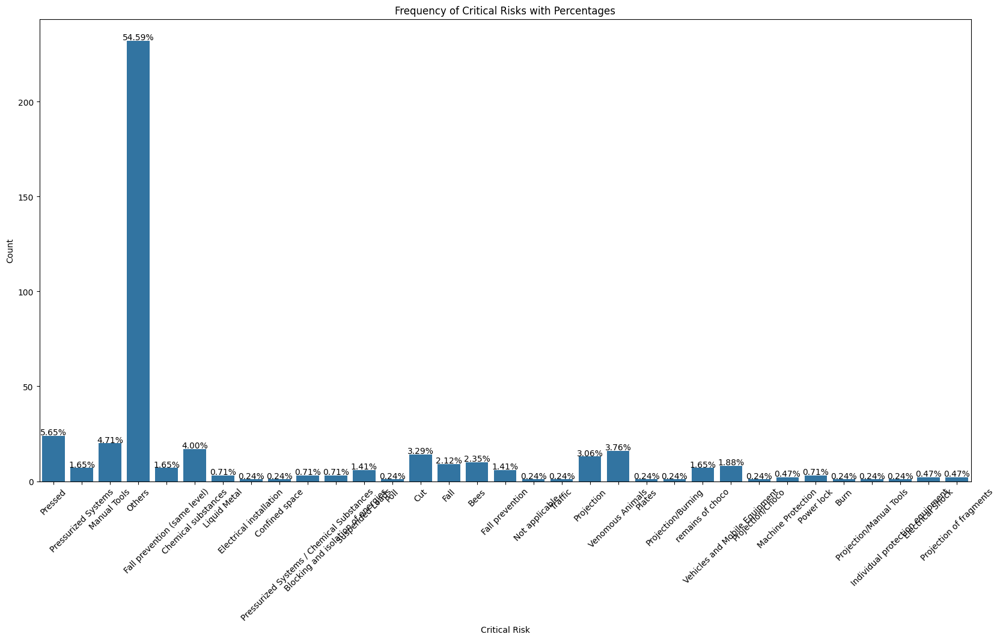

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.countplot(data=data, x='Critical Risk', ax=ax)

# Calculate percentages and annotate the bars
total = float(len(data))  # Total number of data points
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 0.5, '{:.2f}%'.format((height / total) * 100), ha='center')

# Rotate x-axis labels
plt.xticks(rotation=45)

# Set labels and title
ax.set_xlabel('Critical Risk')
ax.set_ylabel('Count')
ax.set_title('Frequency of Critical Risks with Percentages')

# Display the plot
plt.show()

Observation:-
Under Critical Risk column there are 33 categories present in the dataset, out of which:

- Others category is highest - 232 which is 54.59%
- Pressed is second highest - 24 which is 5.65% in that category.
- Manual Tools category is third highest - 20 which is 4.71% in that category.

Now, we can drop the independent variables from the dataset (which will not help in identifying the target variable - Accident Level) like:
1. Column 0 --> Unnamed (Serial No. identifier)
2. Countries --> Unique Identifier
3. Local --> Unique Identifier
4. Genre --> Unique Identifier
5. Employee or Third Party --> Employee Unique Identifier

In [ ]:
data.columns

Index(['Unnamed: 0', 'Data', 'Countries', 'Local', 'Industry Sector',
       'Accident Level', 'Potential Accident Level', 'Genre',
       'Employee or Third Party', 'Critical Risk', 'Description'],
      dtype='object')

In [ ]:
data = data.drop(['Unnamed: 0','Data', 'Countries', 'Local','Genre','Employee or Third Party'], axis=1)
data.head()

,Industry Sector,Accident Level,Potential Accident Level,Critical Risk,Description
0,Mining,I,IV,Pressed,While removing the drill rod of the Jumbo 08 f...
1,Mining,I,IV,Pressurized Systems,During the activation of a sodium sulphide pum...
2,Mining,I,III,Manual Tools,In the sub-station MILPO located at level +170...
3,Mining,I,I,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,Mining,IV,IV,Others,Approximately at 11:45 a.m. in circumstances t...


In [ ]:
#Also we can drop the column 'Potential Accident Level' being dependent variable
data = data.drop(['Potential Accident Level'], axis=1)
data.head()

,Industry Sector,Accident Level,Critical Risk,Description
0,Mining,I,Pressed,While removing the drill rod of the Jumbo 08 f...
1,Mining,I,Pressurized Systems,During the activation of a sodium sulphide pum...
2,Mining,I,Manual Tools,In the sub-station MILPO located at level +170...
3,Mining,I,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,Mining,IV,Others,Approximately at 11:45 a.m. in circumstances t...


In [ ]:
#For clear understanding, lets replace the Accident Level values by numerical values(1 means not severe but 6 means very severe)
data['Accident Level'] = data['Accident Level'].replace({"I": 1, "II": 2, "III": 3, "IV": 4, "V": 5, "VI": 6})
data.head()

,Industry Sector,Accident Level,Critical Risk,Description
0,Mining,1,Pressed,While removing the drill rod of the Jumbo 08 f...
1,Mining,1,Pressurized Systems,During the activation of a sodium sulphide pum...
2,Mining,1,Manual Tools,In the sub-station MILPO located at level +170...
3,Mining,1,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,Mining,4,Others,Approximately at 11:45 a.m. in circumstances t...


In [ ]:
#Again checking for duplicate rows in the dataset
data.duplicated().sum()

10

In [ ]:
#Dropping the duplicate rows in the dataset
data.drop_duplicates(inplace=True)
data.head()

,Industry Sector,Accident Level,Critical Risk,Description
0,Mining,1,Pressed,While removing the drill rod of the Jumbo 08 f...
1,Mining,1,Pressurized Systems,During the activation of a sodium sulphide pum...
2,Mining,1,Manual Tools,In the sub-station MILPO located at level +170...
3,Mining,1,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,Mining,4,Others,Approximately at 11:45 a.m. in circumstances t...


In [ ]:
data.shape

(415, 4)

**Step 3: Data preprocessing (NLP Preprocessing techniques) [ 7 points ]**

**Steps followed for NLP Preprocessing techniques:**
1. Concatenating the independent column variables to get the final description
2. Converting dataset into lower case
3. Removing non-word and non-whitespace characters
4. Removing the digits/numbers
5. Removing the stopwords and tokenize the description
6. Applying stemming/lemmatization technique to get to the root of the word

**Implementing different word embedding techniques - followed by basic machine learning classifiers:**
1. TFIDF
2. CountVectorizer
3. FastText
4. Word2Vec
5. GloVe

In [ ]:
#Concatenating the columns Industry Sector, Critical Risk and Description
data ['Total Description'] = data['Industry Sector'] + " " + data['Critical Risk'] + " " + data['Description'].astype(str)
data.head()

,Industry Sector,Accident Level,Critical Risk,Description,Total Description
0,Mining,1,Pressed,While removing the drill rod of the Jumbo 08 f...,Mining Pressed While removing the drill rod of...
1,Mining,1,Pressurized Systems,During the activation of a sodium sulphide pum...,Mining Pressurized Systems During the activati...
2,Mining,1,Manual Tools,In the sub-station MILPO located at level +170...,Mining Manual Tools In the sub-station MILPO l...
3,Mining,1,Others,Being 9:45 am. approximately in the Nv. 1880 C...,Mining Others Being 9:45 am. approximately in ...
4,Mining,4,Others,Approximately at 11:45 a.m. in circumstances t...,Mining Others Approximately at 11:45 a.m. in c...


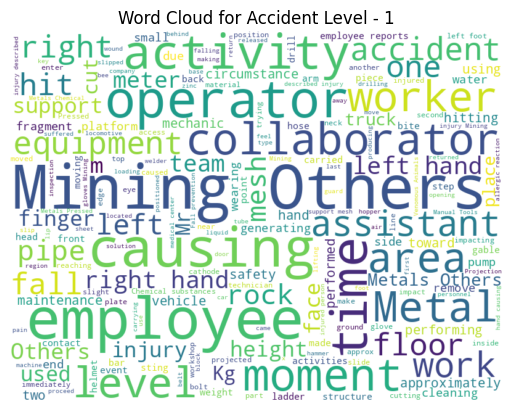

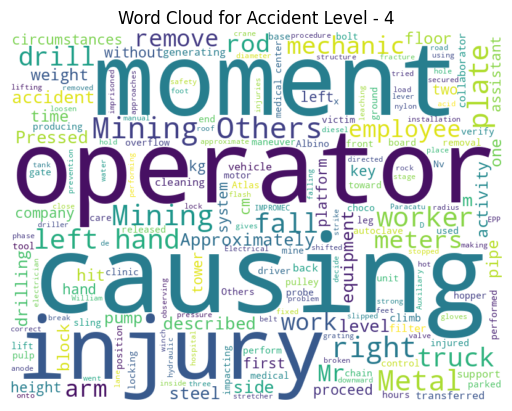

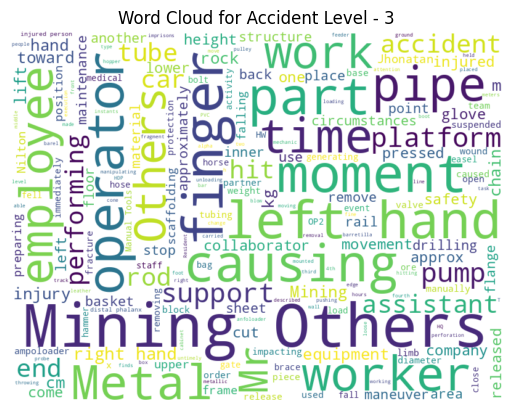

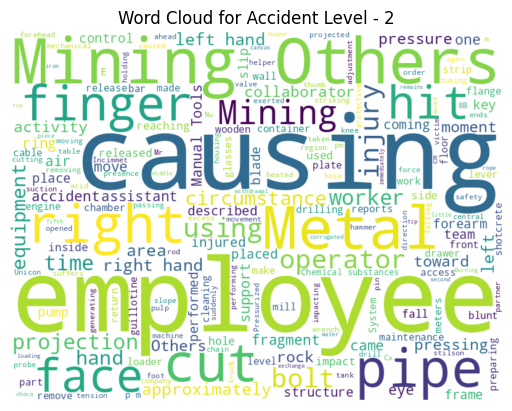

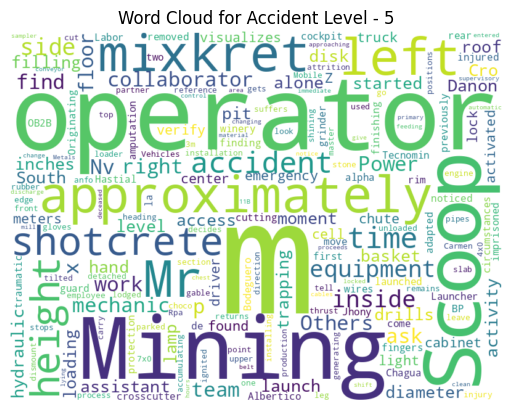

In [ ]:
from wordcloud import WordCloud

for i in data['Accident Level'].unique():
  text = " ".join(data['Total Description'].where(data['Accident Level'] == i).dropna().astype(str))
  wordcloud = WordCloud(width=800, height=600, background_color="white").generate(text)
  plt.title("Word Cloud for Accident Level - "+str(i))
  plt.imshow(wordcloud, interpolation="bilinear")
  plt.axis("off")
  plt.show();

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

# Initialize lemmatizer and stop words
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:
def clean_text(text):
    # Lowercase the text
    text = text.lower()

    # Remove punctuation
    text = re.sub(r'[^\w\s]','', text)

    # Tokenize the text
    words = word_tokenize(text)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word not in stop_words]

    # Remove digits
    words = [word for word in words if not word.isdigit()]

    # Lemmatize the words
    words = [lemmatizer.lemmatize(word, pos='v') for word in words]
    return ' '.join(words)

In [ ]:
# Apply the clean_text function to the 'Description' column
data['Cleaned_Description'] = data['Total Description'].apply(clean_text)

# Display the cleaned DataFrame
data.head()
data['Cleaned_Description'][0]

'mine press remove drill rod jumbo maintenance supervisor proceed loosen support intermediate centralizer facilitate removal see mechanic support one end drill equipment pull hand bar accelerate removal moment bar slide point support tighten finger mechanic drill bar beam jumbo'

In [ ]:
data.to_csv("/content/drive/MyDrive/cleansed_data.csv",columns=['Cleaned_Description'], header=None, index=False)

In [ ]:
#word embeddings
!pip install fasttext
import fasttext
import gensim

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from gensim.scripts.glove2word2vec import glove2word2vec
from gensim.models import KeyedVectors
from gensim.models import Word2Vec

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 2.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached pybind11-2.13.1-py3-none-any.whl (238 kB)
  Created wheel for fasttext: filename=fasttext-0.9.3-cp310-cp310-linux_x86_64.whl size=4246766 sha256=cbb96390daf874cdfd8e133af3e731cf098ade2754bcf1a4d417cdec15db30f9
  Stored in directory: /root/.cache/pip/wheels/0d/a2/00/81db54d3e6a8199b829d58e02cec2ddb20ce3e59fad8d3c92a
Successfully built fasttext


In [ ]:
# Word embeddings using TFIDF
tfidf_model = TfidfVectorizer()
tfidf_matrix = tfidf_model.fit_transform(data['Cleaned_Description'])

feature_names = tfidf_model.get_feature_names_out()
embeddings = tfidf_matrix.toarray()
X_tfidf = pd.DataFrame(embeddings, columns=feature_names)
X_tfidf.head()

,02bp0166,02bp0167,02mx015mx010m,042tc06,06m,07m,080m,080mt,08fi0502,090m,...,z014,z132,z332,zaf,zamac,zero,zinc,zinco,zn,zone
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.204311,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Word embeddings using Count Vectorizer
CVect_model = CountVectorizer(max_features = 1000)
CVect_matrix = CVect_model.fit_transform(data['Cleaned_Description'])

feature_names = CVect_model.get_feature_names_out()
embeddings = CVect_matrix.toarray()
X_Cvect = pd.DataFrame(embeddings, columns=feature_names)
X_Cvect.head()

,1st,2m,2nd,3cm,3m,3rd,4th,5th,able,abruptly,...,worker,workers,workshop,would,wrench,wrist,yield,zinc,zn,zone
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [ ]:
# Word embeddings using Fasttext

fasttext_model = fasttext.train_unsupervised("/content/drive/MyDrive/cleansed_data.csv")
fasttext_matrix = [fasttext_model.get_word_vector(word) for word in data['Cleaned_Description']]

embeddings = np.array(fasttext_matrix)
X_fasttext = pd.DataFrame(embeddings)
X_fasttext.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.064368,0.069211,0.005050,0.008771,-0.040754,-0.023424,-0.040109,0.043785,0.083881,0.006739,...,0.063422,0.056954,0.052901,-0.128229,-0.056265,-0.086530,0.058093,0.014994,-0.075417,-0.016707
1,-0.054020,0.058041,0.004124,0.007352,-0.034167,-0.019667,-0.033644,0.036781,0.070306,0.005622,...,0.053165,0.047739,0.044471,-0.107543,-0.046971,-0.072639,0.048746,0.012625,-0.063403,-0.014039
2,-0.052197,0.056037,0.004174,0.007217,-0.032981,-0.018997,-0.032486,0.035371,0.067982,0.005434,...,0.051413,0.046128,0.042910,-0.103807,-0.045618,-0.070151,0.047019,0.012156,-0.061107,-0.013605
3,-0.058973,0.063405,0.004699,0.007981,-0.037316,-0.021395,-0.036820,0.040121,0.076808,0.006109,...,0.058035,0.052118,0.048516,-0.117440,-0.051450,-0.079344,0.053187,0.013739,-0.069177,-0.015232
4,-0.063070,0.067954,0.004916,0.008567,-0.040012,-0.023023,-0.039493,0.043005,0.082306,0.006625,...,0.062083,0.055920,0.051863,-0.125811,-0.055149,-0.084864,0.056956,0.014657,-0.074016,-0.016407


In [ ]:
# Word embeddings using Word2Vec

words_list = [item.split(" ") for item in data['Cleaned_Description'].values]

# Creating Word2Vec instance
vec_size = 300
W2V_model = Word2Vec(words_list, vector_size = vec_size, min_count = 1, window=5, workers = 6)

# Retrieving the words present in the Word2Vec model's vocabulary
words = list(W2V_model.wv.key_to_index.keys())

# Retrieving word vectors for all the words present in the model's vocabulary
wvs = W2V_model.wv[words].tolist()

# Creating a dictionary of words and their corresponding vectors
word_vector_dict = dict(zip(words, wvs))

def average_vectorizer_Word2Vec(doc):
    # Initializing a feature vector for the sentence
    feature_vector = np.zeros((vec_size,), dtype="float64")

    # Creating a list of words in the sentence that are present in the model vocabulary
    words_in_vocab = [word for word in doc.split() if word in words]

    # adding the vector representations of the words
    for word in words_in_vocab:
        feature_vector += np.array(word_vector_dict[word])

    # Dividing by the number of words to get the average vector
    if len(words_in_vocab) != 0:
        feature_vector /= len(words_in_vocab)

    return feature_vector

# creating a dataframe of the vectorized documents
X_Word2Vec = pd.DataFrame(data['Cleaned_Description'].apply(average_vectorizer_Word2Vec).tolist(), columns=['Feature '+str(i) for i in range(vec_size)])
X_Word2Vec.head()

,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,...,Feature 290,Feature 291,Feature 292,Feature 293,Feature 294,Feature 295,Feature 296,Feature 297,Feature 298,Feature 299
0,0.007018,0.028269,-0.000870,0.009884,0.007132,-0.026760,0.015088,0.049567,0.003971,-0.005308,...,-0.002770,0.032830,0.018728,0.010266,0.026290,0.033480,-0.001081,-0.012852,0.009531,-0.002099
1,0.003395,0.013241,-0.000332,0.004352,0.003161,-0.012744,0.007307,0.023997,0.002463,-0.002834,...,-0.001268,0.016123,0.009346,0.005082,0.013573,0.016570,-0.000639,-0.006524,0.004686,-0.000678
2,0.007600,0.028587,-0.000459,0.009936,0.007277,-0.028304,0.014958,0.051139,0.005073,-0.005000,...,-0.002238,0.033824,0.019638,0.011553,0.027167,0.034696,-0.001046,-0.013888,0.010597,-0.003289
3,0.006153,0.023712,-0.000593,0.008792,0.005758,-0.022887,0.012129,0.042819,0.003783,-0.004920,...,-0.001947,0.028386,0.016883,0.008899,0.023009,0.028395,-0.000259,-0.011381,0.008640,-0.002363
4,0.006622,0.024340,-0.000995,0.009337,0.006113,-0.023905,0.012230,0.042602,0.003581,-0.004364,...,-0.002541,0.028090,0.016482,0.008870,0.022637,0.029727,-0.000634,-0.011223,0.008329,-0.002378


In [ ]:
# Word embeddings using GloVe

glove_input_file = '/content/drive/MyDrive/glove.6B.100d.txt'
word2vec_output_file = 'glove.6B.100d.txt.word2vec'
glove2word2vec(glove_input_file, word2vec_output_file)

# load the Stanford GloVe model
filename = 'glove.6B.100d.txt.word2vec'
glove_model = KeyedVectors.load_word2vec_format(filename, binary=False)

# Retrieving the words present in the GloVe model's vocabulary
glove_words = glove_model.index_to_key

# Creating a dictionary of words and their corresponding vectors
glove_word_vector_dict = dict(zip(glove_model.index_to_key,list(glove_model.vectors)))

vec_size=100
def average_vectorizer_GloVe(doc):
    # Initializing a feature vector for the sentence
    feature_vector = np.zeros((vec_size,), dtype="float64")

    # Creating a list of words in the sentence that are present in the model vocabulary
    words_in_vocab = [word for word in doc.split() if word in glove_words]

    # adding the vector representations of the words
    for word in words_in_vocab:
        feature_vector += np.array(glove_word_vector_dict[word])

    # Dividing by the number of words to get the average vector
    if len(words_in_vocab) != 0:
        feature_vector /= len(words_in_vocab)

    return feature_vector

# creating a dataframe of the vectorized documents
X_Glove = pd.DataFrame(data['Cleaned_Description'].apply(average_vectorizer_GloVe).tolist(), columns=['Feature '+str(i) for i in range(vec_size)])
X_Glove

<ipython-input-32-25eb6cb23122>:5: DeprecationWarning: Call to deprecated `glove2word2vec` (KeyedVectors.load_word2vec_format(.., binary=False, no_header=True) loads GLoVE text vectors.).
  glove2word2vec(glove_input_file, word2vec_output_file)


,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,...,Feature 90,Feature 91,Feature 92,Feature 93,Feature 94,Feature 95,Feature 96,Feature 97,Feature 98,Feature 99
0,-0.172373,0.065704,-0.039608,-0.129613,-0.130764,-0.272443,-0.216612,0.265359,-0.018765,0.203572,...,-0.097841,0.105845,-0.163382,0.079951,-0.010494,-0.073588,0.067683,-0.216707,0.434568,0.034440
1,-0.192902,0.210739,0.031149,0.123416,-0.028808,-0.043429,-0.015848,0.250475,0.119543,0.119677,...,0.101750,0.038847,-0.217051,-0.000363,-0.170738,0.013209,0.150951,-0.192866,0.240392,-0.100552
2,-0.095026,0.133340,-0.022710,-0.186341,-0.009653,-0.188463,-0.040369,0.064648,0.037798,0.155561,...,-0.085468,-0.026004,0.002374,0.138578,-0.083387,0.076847,-0.087360,-0.194387,0.455174,-0.175248
3,-0.092262,0.010874,0.024966,-0.142605,0.050040,0.015568,-0.161251,0.191990,-0.070383,-0.055461,...,-0.130466,0.109574,0.024755,0.025607,-0.108721,-0.057208,-0.023008,-0.115067,0.515892,0.005384
4,-0.104161,0.064691,-0.044076,-0.171247,-0.143761,-0.059758,-0.085601,0.218008,-0.219886,0.130845,...,-0.072972,0.040231,-0.088624,0.007723,-0.144017,0.067201,-0.065695,-0.254917,0.529368,-0.226509
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
410,-0.128156,0.095650,0.020921,-0.134649,-0.068514,0.082221,-0.072931,0.242573,-0.109428,0.128471,...,-0.094343,-0.013359,0.009773,0.040535,-0.095242,-0.076262,0.030339,-0.044551,0.497933,-0.135640
411,0.042812,0.082026,-0.046208,-0.253842,-0.098537,-0.078399,-0.169160,0.089406,0.215187,0.160079,...,0.041423,-0.045375,0.049843,0.103461,-0.148455,0.052160,-0.008667,-0.189308,0.333439,-0.155087
412,-0.202158,0.128085,0.215636,-0.316386,-0.196276,0.211402,-0.201773,0.188544,-0.080946,-0.033106,...,-0.027717,-0.113038,0.016529,-0.072750,-0.135008,0.090552,-0.170843,-0.065888,0.612985,-0.021917
413,-0.376865,0.166134,0.004137,-0.176608,0.096427,-0.051436,-0.151060,0.257696,-0.056028,0.160540,...,-0.105344,0.081687,-0.043474,-0.124095,-0.260924,-0.060095,0.063955,-0.099803,0.520046,-0.087597


**Step 4: Data preparation - Cleansed data in .xlsx or .csv file [ 5 points ]**

In [ ]:
data.to_csv("/content/drive/MyDrive/cleansed_data.csv",columns=['Total Description'], header=None, index=False)

**Step 5: Design train and test basic machine learning classifiers [ 10 Points ]**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score
from sklearn import metrics

In [ ]:
# Create a dictionary with different ML models
models = {
        'LogisticRegression': LogisticRegression(C=1.0, solver='lbfgs', penalty='l2', max_iter=100, tol=0.0001),
        'Naive Bayes': GaussianNB(),
        'KNN': KNeighborsClassifier(n_neighbors=5, metric='minkowski', weights='distance', algorithm='kd_tree'),
        'SVM': SVC( C=10,    kernel="linear",    gamma=0.1,    tol=1e-4,    probability=True,    random_state=42),
        'DecisionTree': DecisionTreeClassifier(criterion='entropy',max_depth=6,random_state=100,min_samples_leaf=5),
        'RandomForest': RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=5, min_samples_split=2, min_samples_leaf=1, max_features='auto', bootstrap=True),
        'Bagging': BaggingClassifier(n_estimators=50, max_samples=.7),
        'AdaBoost': AdaBoostClassifier(n_estimators= 50),
        'Gradient Boost': GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.1),
        'XGBoost': XGBClassifier(n_estimators = 50, learning_rate = 0.1)
}

def fit_models(embed,models, X_features, Y):

    names=[]
    scores=[]
    train_scores=[]

    Y = Y-1
    X_train, X_test, y_train, y_test = train_test_split(X_features, Y, test_size=0.2, random_state=42)
    model_scores = {}
    for name, model in models.items():
        # Fit the model
        model.fit(X_train, y_train)
        # Make predictions on test data
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        # Calculate accuracy score
        score = accuracy_score(y_test, y_pred)
        train_score=accuracy_score(y_train, y_train_pred)
        print("Accuracy Score with testing data - "+name+": {0:0.2f}%".format(score*100))
        print("Accuracy Score with training data - "+name+": {0:0.2f}%".format(train_score*100))
        print("Classification Metrics for "+name+": ")
        print(metrics.classification_report(y_test,y_pred,labels=['0','1','2','3','4']));
        cm_train = confusion_matrix(y_train, y_train_pred)
        #print(cm_train)
        sns.heatmap(cm_train, annot=True, cmap="Blues", fmt="d")
        plt.title('Train Confusion Matrix for : '+name)
        plt.xlabel('Predicted accident_corrected_level')
        plt.ylabel('Actual accident_corrected_level')
        plt.show();
        print("------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------")
        cm = confusion_matrix(y_test, y_pred)
        #print(cm)
        sns.heatmap(cm, annot=True, cmap="crest", fmt="d")
        plt.title('Test Confusion Matrix for : '+name)
        plt.xlabel('Predicted accident_corrected_level')
        plt.ylabel('Actual accident_corrected_level')
        plt.show();

        # Store the fitted model and its test score
        names.append(name)
        scores.append(score)
        train_scores.append(train_score)
        model_scores[name] = {'Embedding':embed, 'model': model,'train_score': train_score, 'test_score': score}
    return model_scores

Fitting ML classifiers using TFIDF embeddings: 
Accuracy Score with testing data - LogisticRegression: 79.52%
Accuracy Score with training data - LogisticRegression: 72.29%
Classification Metrics for LogisticRegression: 
              precision    recall  f1-score   support

           0       0.80      1.00      0.89        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.80      0.80      0.80        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.80      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


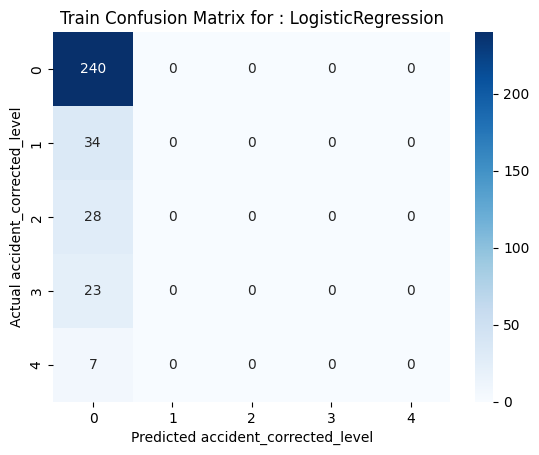

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


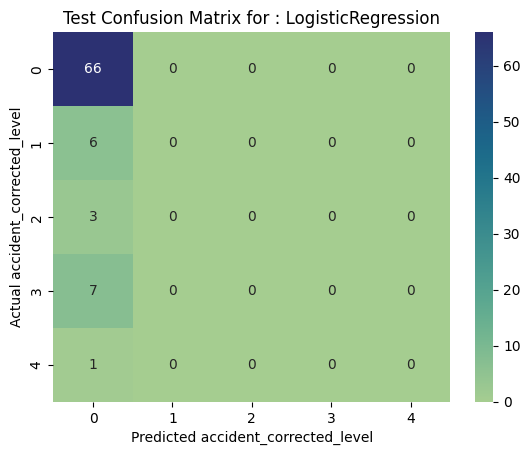

Accuracy Score with testing data - Naive Bayes: 77.11%
Accuracy Score with training data - Naive Bayes: 99.70%
Classification Metrics for Naive Bayes: 
              precision    recall  f1-score   support

           0       0.81      0.97      0.88        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.77      0.77      0.77        83
   macro avg       0.16      0.19      0.18        83
weighted avg       0.64      0.77      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


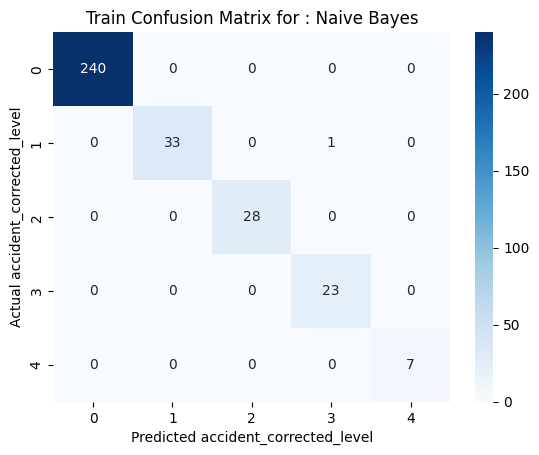

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


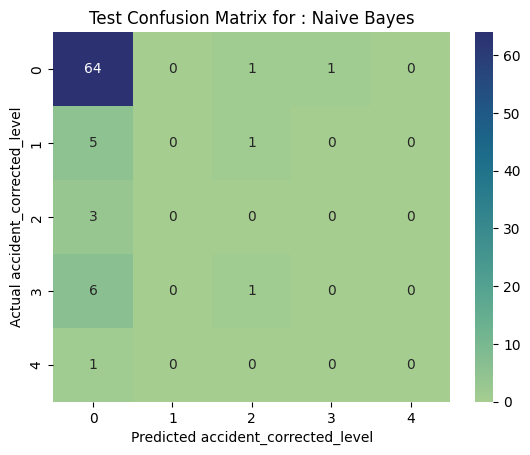

Accuracy Score with testing data - KNN: 72.29%
Accuracy Score with training data - KNN: 99.70%
Classification Metrics for KNN: 
              precision    recall  f1-score   support

           0       0.80      0.91      0.85        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.72      0.72      0.72        83
   macro avg       0.16      0.18      0.17        83
weighted avg       0.64      0.72      0.68        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


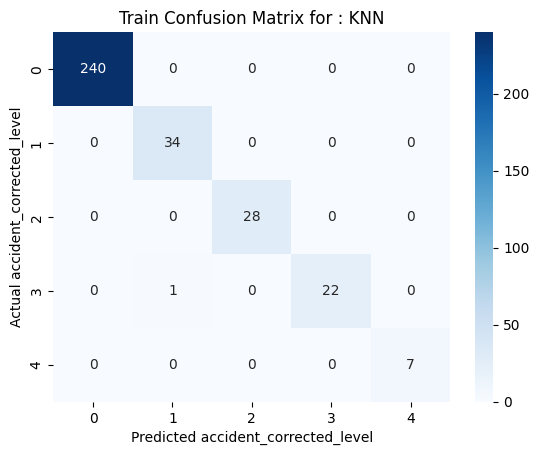

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


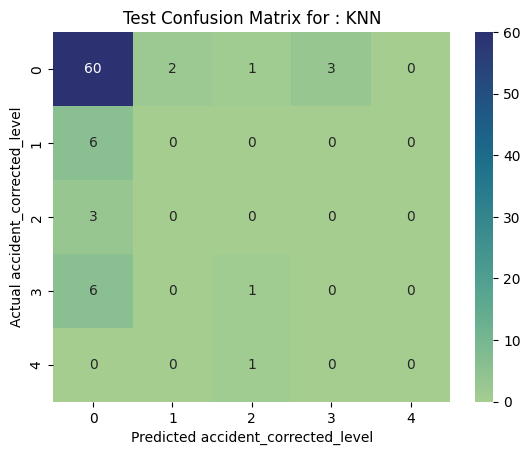

Accuracy Score with testing data - SVM: 74.70%
Accuracy Score with training data - SVM: 99.40%
Classification Metrics for SVM: 
              precision    recall  f1-score   support

           0       0.78      0.94      0.86        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.75      0.75      0.75        83
   macro avg       0.16      0.19      0.17        83
weighted avg       0.62      0.75      0.68        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


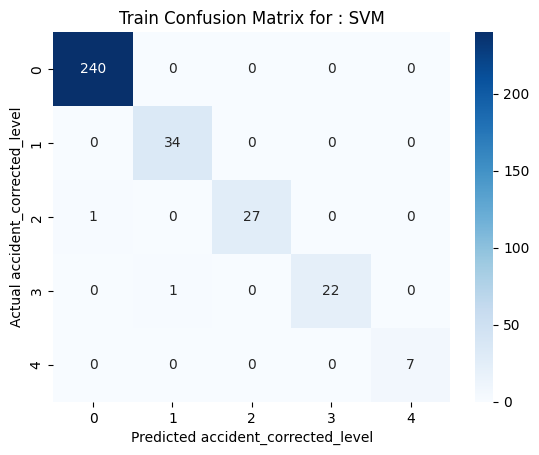

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


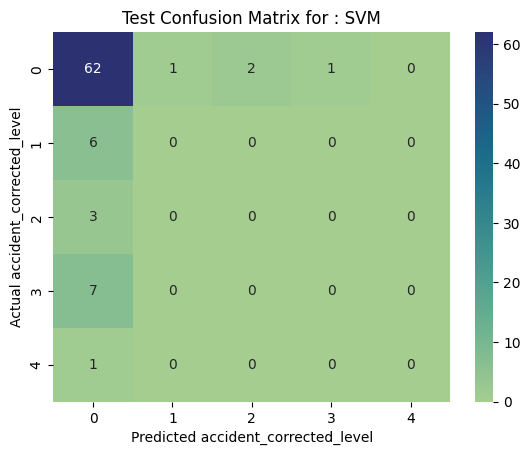

Accuracy Score with testing data - DecisionTree: 60.24%
Accuracy Score with training data - DecisionTree: 78.01%
Classification Metrics for DecisionTree: 
              precision    recall  f1-score   support

           0       0.75      0.74      0.75        66
           1       0.09      0.17      0.12         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.60      0.60      0.60        83
   macro avg       0.17      0.18      0.17        83
weighted avg       0.61      0.60      0.60        83



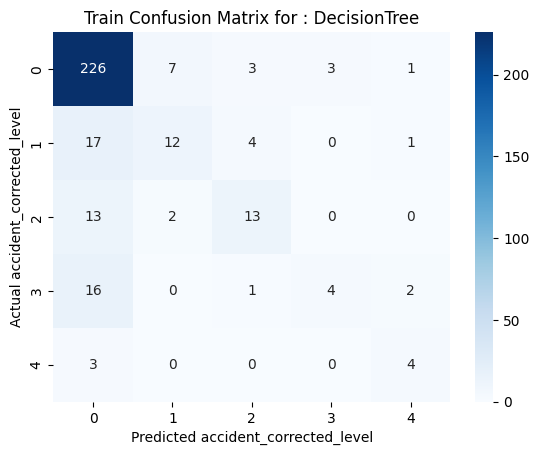

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


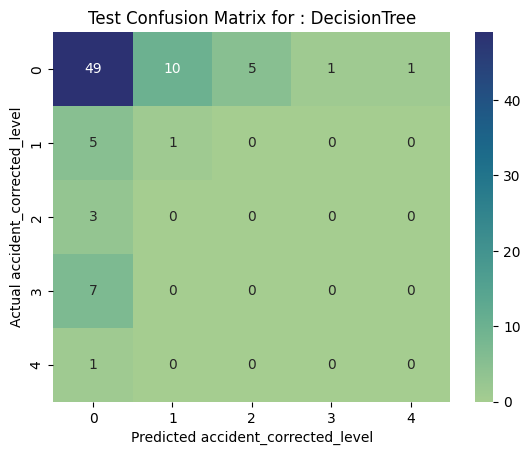

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Accuracy Score with testing data - RandomForest: 79.52%
Accuracy Score with training data - RandomForest: 72.29%
Classification Metrics for RandomForest: 
              precision    recall  f1-score   support

           0       0.80      1.00      0.89        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.80      0.80      0.80        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.80      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


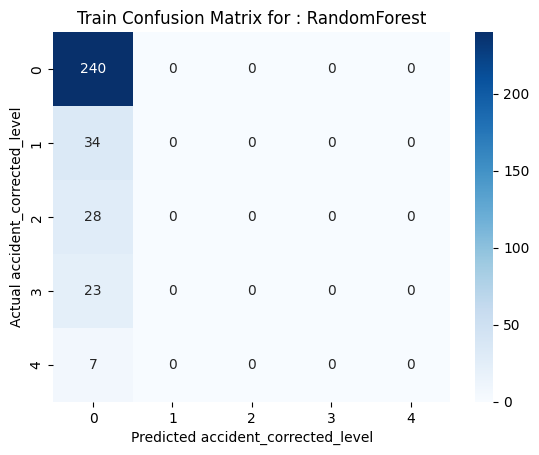

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


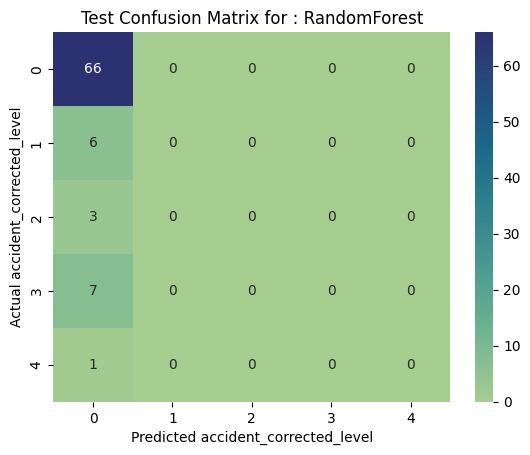

Accuracy Score with testing data - Bagging: 78.31%
Accuracy Score with training data - Bagging: 93.98%
Classification Metrics for Bagging: 
              precision    recall  f1-score   support

           0       0.79      0.98      0.88        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.78      0.78      0.78        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.78      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


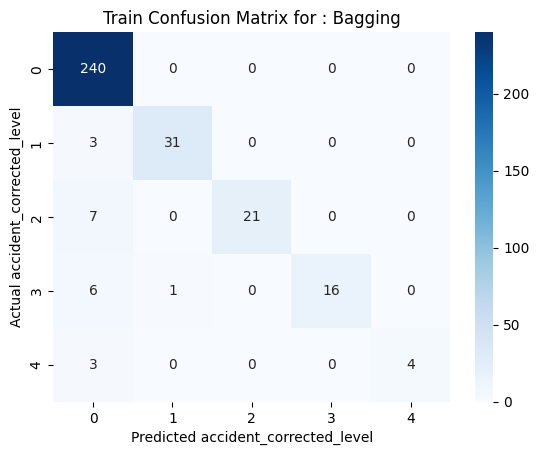

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


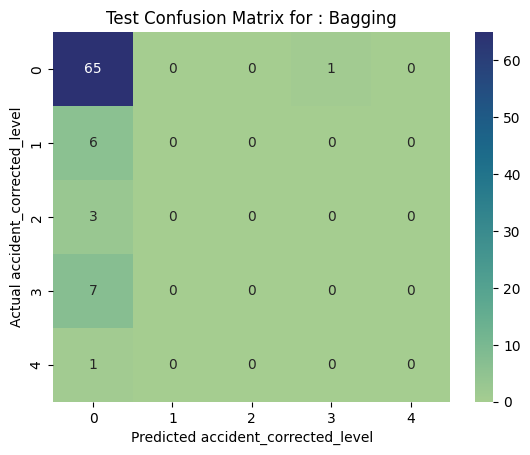

Accuracy Score with testing data - AdaBoost: 75.90%
Accuracy Score with training data - AdaBoost: 73.80%
Classification Metrics for AdaBoost: 
              precision    recall  f1-score   support

           0       0.80      0.95      0.87        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.76      0.76      0.76        83
   macro avg       0.16      0.19      0.17        83
weighted avg       0.63      0.76      0.69        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


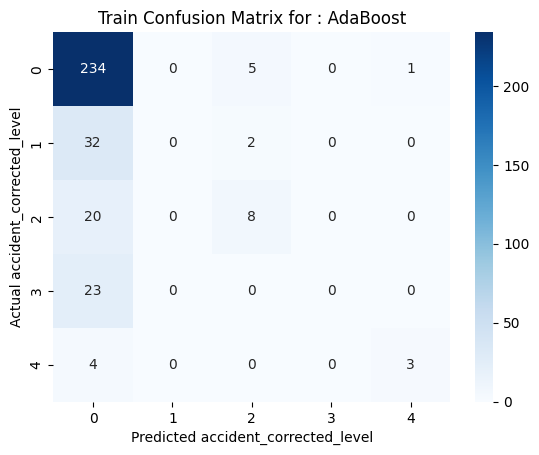

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


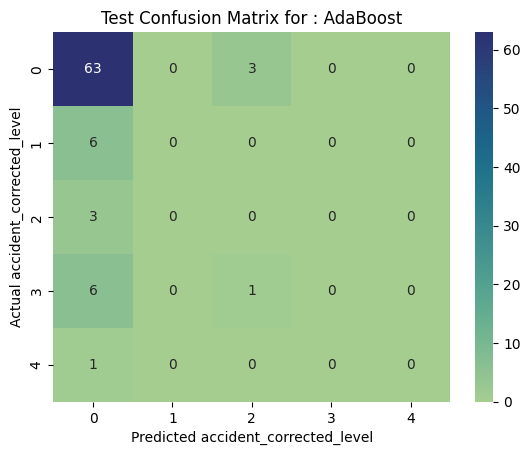

Accuracy Score with testing data - Gradient Boost: 72.29%
Accuracy Score with training data - Gradient Boost: 99.70%
Classification Metrics for Gradient Boost: 
              precision    recall  f1-score   support

           0       0.80      0.91      0.85        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.72      0.72      0.72        83
   macro avg       0.16      0.18      0.17        83
weighted avg       0.64      0.72      0.68        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


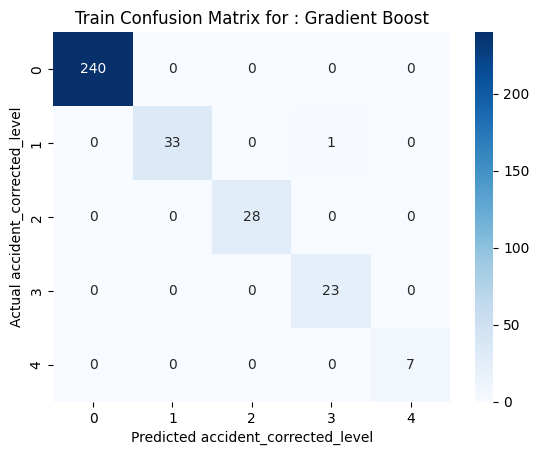

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


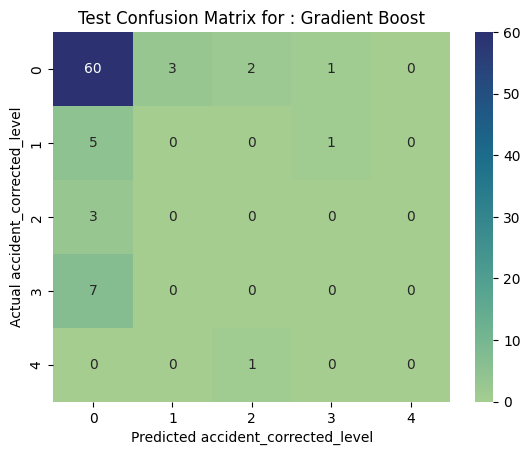

Accuracy Score with testing data - XGBoost: 77.11%
Accuracy Score with training data - XGBoost: 99.70%
Classification Metrics for XGBoost: 
              precision    recall  f1-score   support

           0       0.79      0.97      0.87        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.77      0.77      0.77        83
   macro avg       0.16      0.19      0.17        83
weighted avg       0.63      0.77      0.69        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


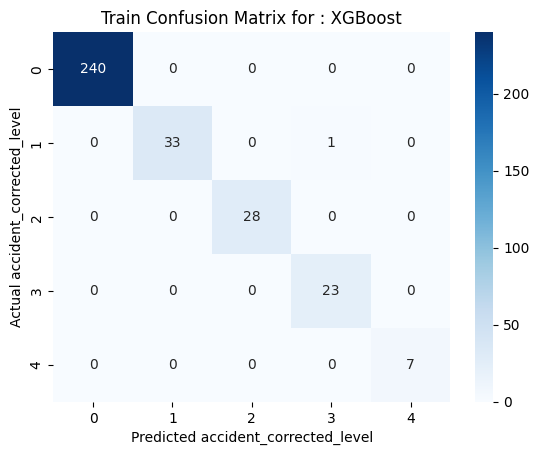

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


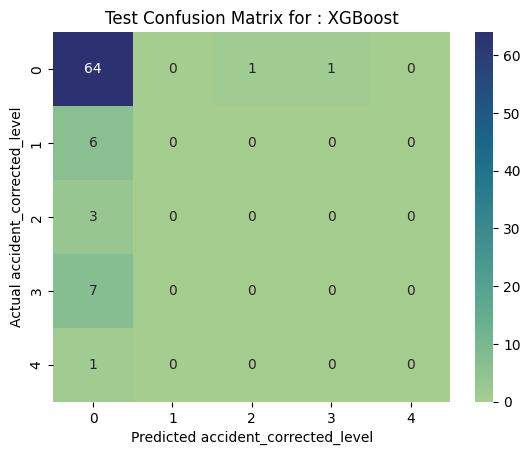

,Embedding,model,train_score,test_score
LogisticRegression,tfidf,LogisticRegression(),0.722892,0.795181
Naive Bayes,tfidf,GaussianNB(),0.996988,0.771084
KNN,tfidf,"KNeighborsClassifier(algorithm='kd_tree', weig...",0.996988,0.722892
SVM,tfidf,"SVC(C=10, gamma=0.1, kernel='linear', probabil...",0.993976,0.746988
DecisionTree,tfidf,"DecisionTreeClassifier(criterion='entropy', ma...",0.78012,0.60241
RandomForest,tfidf,"(DecisionTreeClassifier(max_depth=5, max_featu...",0.722892,0.795181
Bagging,tfidf,(DecisionTreeClassifier(random_state=144955322...,0.939759,0.783133
AdaBoost,tfidf,"(DecisionTreeClassifier(max_depth=1, random_st...",0.737952,0.759036
Gradient Boost,tfidf,([DecisionTreeRegressor(criterion='friedman_ms...,0.996988,0.722892
XGBoost,tfidf,"XGBClassifier(base_score=None, booster=None, c...",0.996988,0.771084


In [ ]:
# Fit the models using TFIDF embeddings
print ("Fitting ML classifiers using TFIDF embeddings: ")
fitted_models_tfidf = fit_models('tfidf',models, X_tfidf, data['Accident Level'])
result_df = {}

result_df = pd.DataFrame(fitted_models_tfidf)
result_tfidf = result_df.transpose()

result_tfidf

In [ ]:
result_tfidf

,Embedding,model,train_score,test_score
LogisticRegression,tfidf,LogisticRegression(),0.722892,0.795181
Naive Bayes,tfidf,GaussianNB(),0.996988,0.771084
KNN,tfidf,"KNeighborsClassifier(algorithm='kd_tree', weig...",0.996988,0.722892
SVM,tfidf,"SVC(C=10, gamma=0.1, kernel='linear', probabil...",0.993976,0.746988
DecisionTree,tfidf,"DecisionTreeClassifier(criterion='entropy', ma...",0.78012,0.60241
RandomForest,tfidf,"(DecisionTreeClassifier(max_depth=5, max_featu...",0.722892,0.795181
Bagging,tfidf,(DecisionTreeClassifier(random_state=144955322...,0.939759,0.783133
AdaBoost,tfidf,"(DecisionTreeClassifier(max_depth=1, random_st...",0.737952,0.759036
Gradient Boost,tfidf,([DecisionTreeRegressor(criterion='friedman_ms...,0.996988,0.722892
XGBoost,tfidf,"XGBClassifier(base_score=None, booster=None, c...",0.996988,0.771084


Fitting ML classifiers using CountVectorizer embeddings:
Accuracy Score with testing data - LogisticRegression: 73.49%
Accuracy Score with training data - LogisticRegression: 99.10%
Classification Metrics for LogisticRegression: 
              precision    recall  f1-score   support

           0       0.80      0.92      0.86        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.73      0.73      0.73        83
   macro avg       0.16      0.18      0.17        83
weighted avg       0.64      0.73      0.68        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


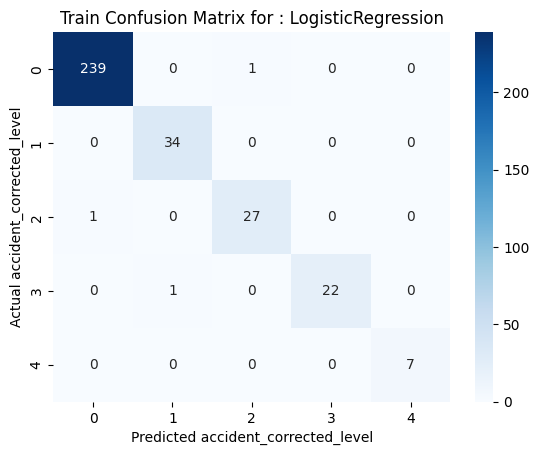

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


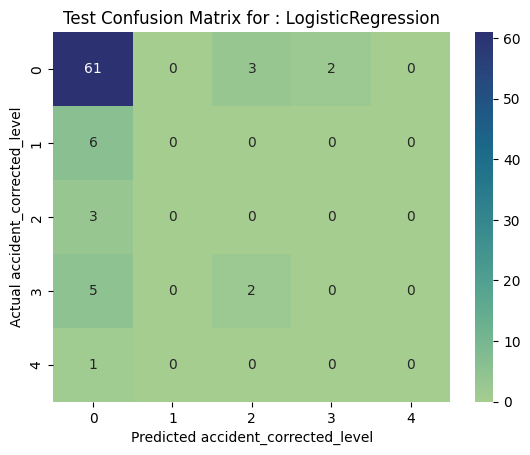

Accuracy Score with testing data - Naive Bayes: 78.31%
Accuracy Score with training data - Naive Bayes: 99.10%
Classification Metrics for Naive Bayes: 
              precision    recall  f1-score   support

           0       0.81      0.98      0.89        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.78      0.78      0.78        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.65      0.78      0.71        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


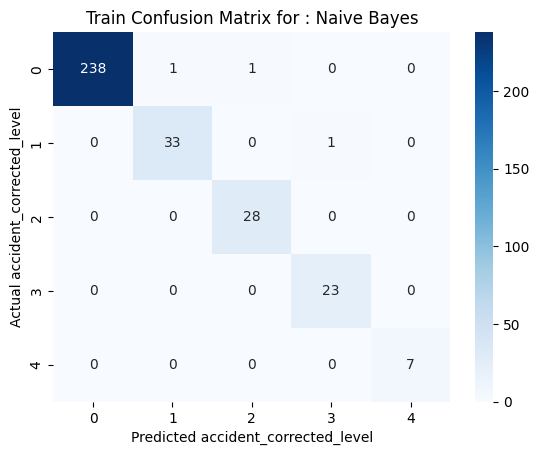

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


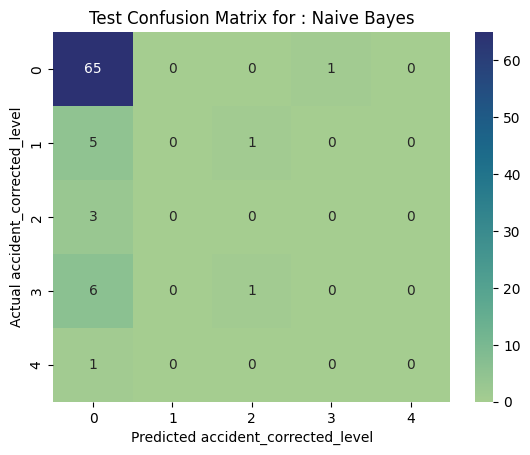

Accuracy Score with testing data - KNN: 77.11%
Accuracy Score with training data - KNN: 99.70%
Classification Metrics for KNN: 
              precision    recall  f1-score   support

           0       0.79      0.97      0.87        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.77      0.77      0.77        83
   macro avg       0.16      0.19      0.17        83
weighted avg       0.63      0.77      0.69        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


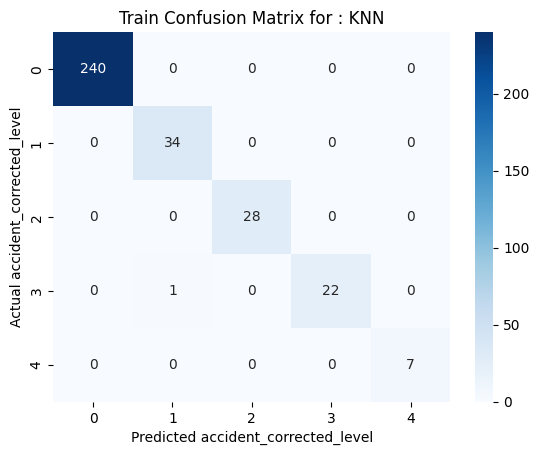

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


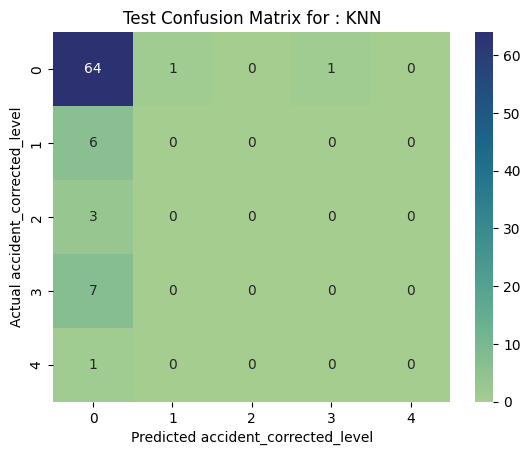

Accuracy Score with testing data - SVM: 66.27%
Accuracy Score with training data - SVM: 99.70%
Classification Metrics for SVM: 
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        66
           1       0.17      0.17      0.17         6
           2       0.12      0.33      0.18         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.66      0.66      0.66        83
   macro avg       0.22      0.26      0.23        83
weighted avg       0.66      0.66      0.66        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


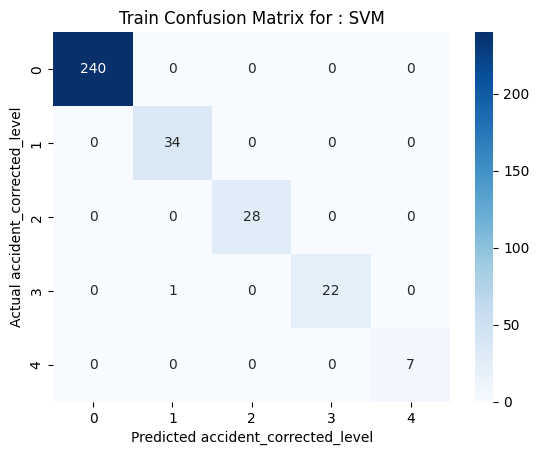

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


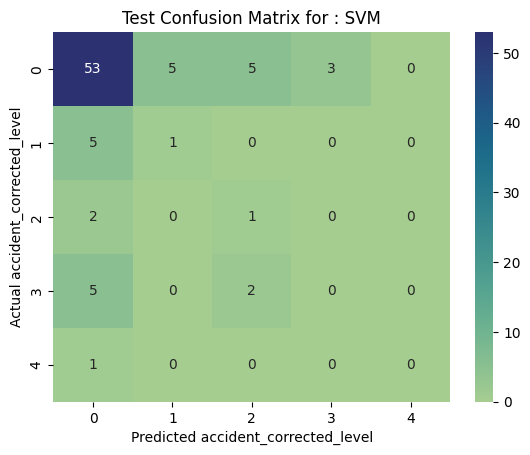

Accuracy Score with testing data - DecisionTree: 68.67%
Accuracy Score with training data - DecisionTree: 76.51%
Classification Metrics for DecisionTree: 
              precision    recall  f1-score   support

           0       0.79      0.85      0.82        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.50      0.14      0.22         7
           4       0.00      0.00      0.00         1

   micro avg       0.69      0.69      0.69        83
   macro avg       0.26      0.20      0.21        83
weighted avg       0.67      0.69      0.67        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


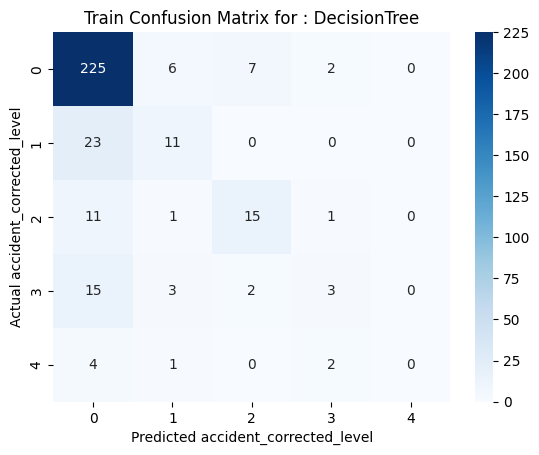

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


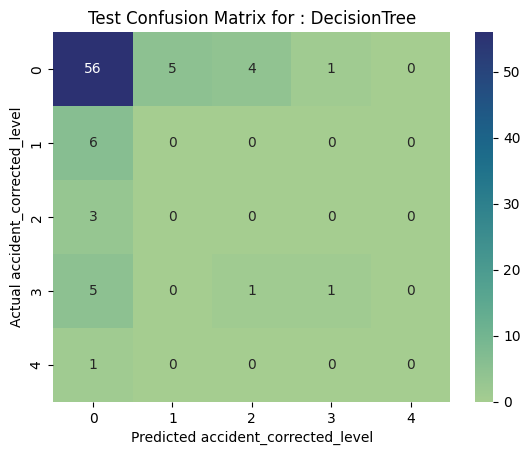

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Accuracy Score with testing data - RandomForest: 79.52%
Accuracy Score with training data - RandomForest: 72.29%
Classification Metrics for RandomForest: 
              precision    recall  f1-score   support

           0       0.80      1.00      0.89        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.80      0.80      0.80        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.80      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


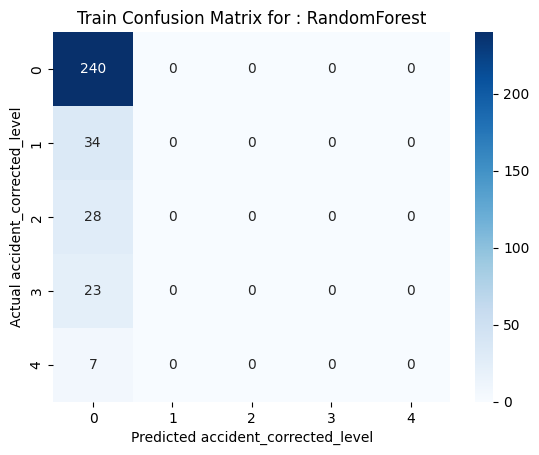

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


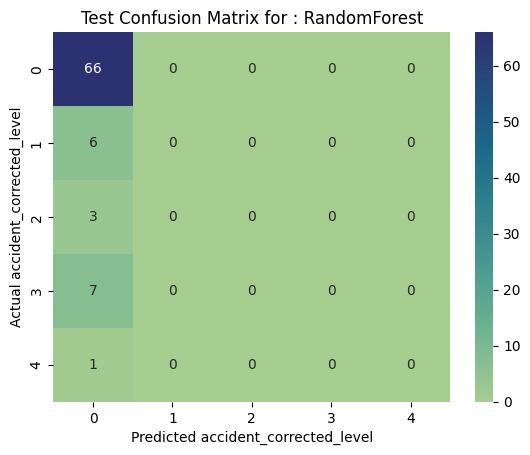

Accuracy Score with testing data - Bagging: 78.31%
Accuracy Score with training data - Bagging: 95.18%
Classification Metrics for Bagging: 
              precision    recall  f1-score   support

           0       0.79      0.98      0.88        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.78      0.78      0.78        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.78      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


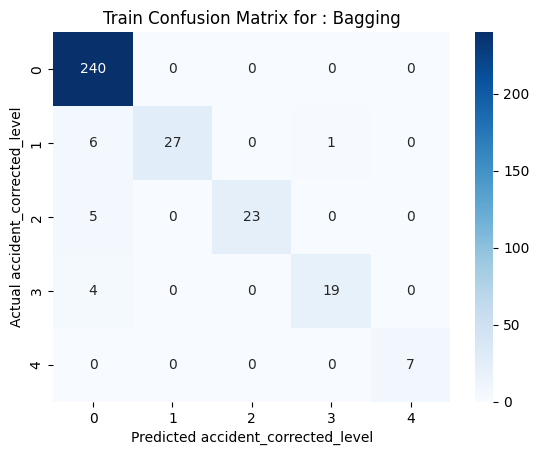

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


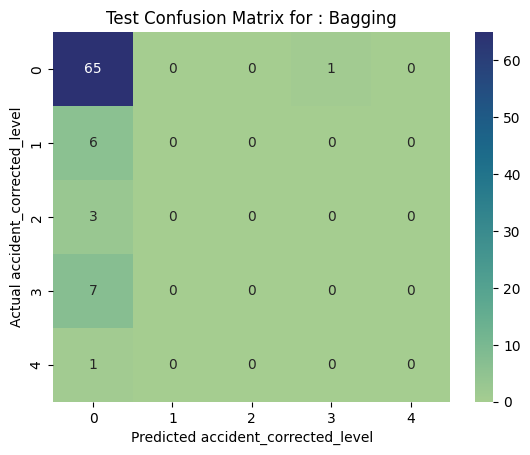

Accuracy Score with testing data - AdaBoost: 69.88%
Accuracy Score with training data - AdaBoost: 69.88%
Classification Metrics for AdaBoost: 
              precision    recall  f1-score   support

           0       0.79      0.86      0.83        66
           1       0.17      0.17      0.17         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.70      0.70      0.70        83
   macro avg       0.19      0.21      0.20        83
weighted avg       0.64      0.70      0.67        83



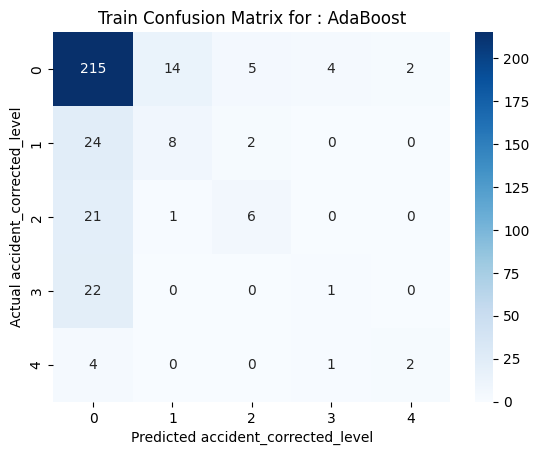

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


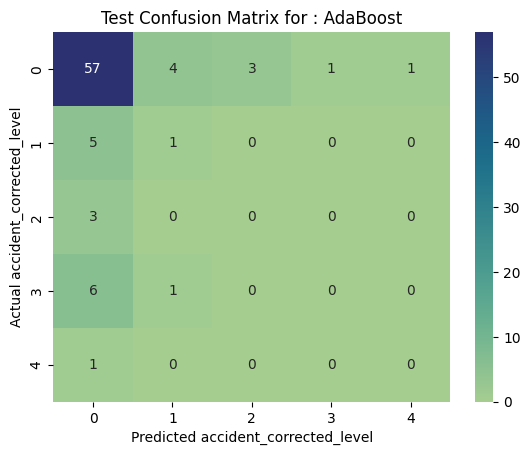

Accuracy Score with testing data - Gradient Boost: 69.88%
Accuracy Score with training data - Gradient Boost: 96.08%
Classification Metrics for Gradient Boost: 
              precision    recall  f1-score   support

           0       0.81      0.86      0.84        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.25      0.14      0.18         7
           4       0.00      0.00      0.00         1

   micro avg       0.70      0.70      0.70        83
   macro avg       0.21      0.20      0.20        83
weighted avg       0.67      0.70      0.68        83



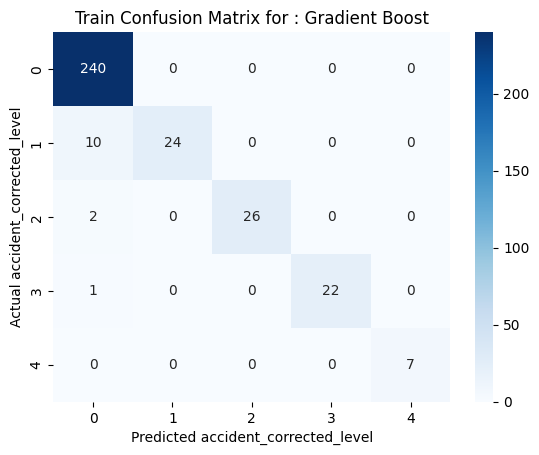

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


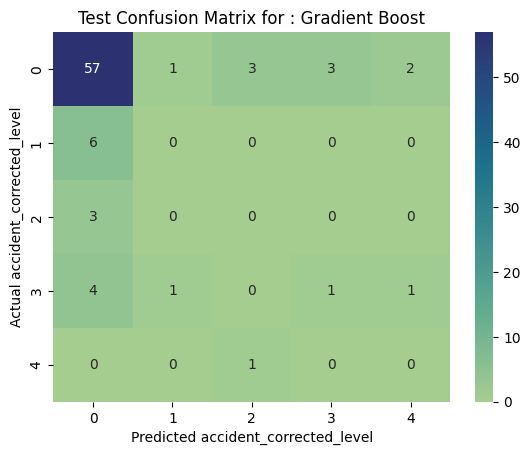

Accuracy Score with testing data - XGBoost: 74.70%
Accuracy Score with training data - XGBoost: 96.08%
Classification Metrics for XGBoost: 
              precision    recall  f1-score   support

           0       0.79      0.94      0.86        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.75      0.75      0.75        83
   macro avg       0.16      0.19      0.17        83
weighted avg       0.63      0.75      0.68        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


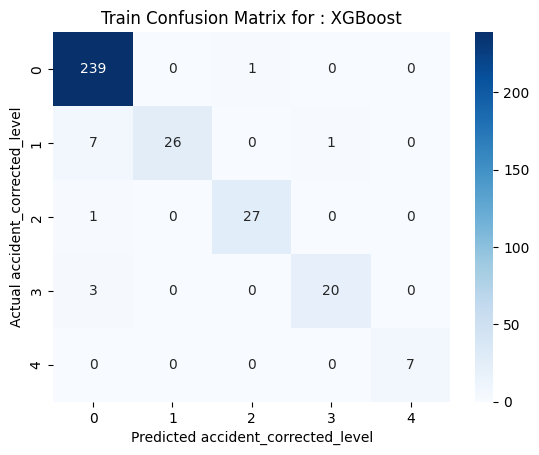

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


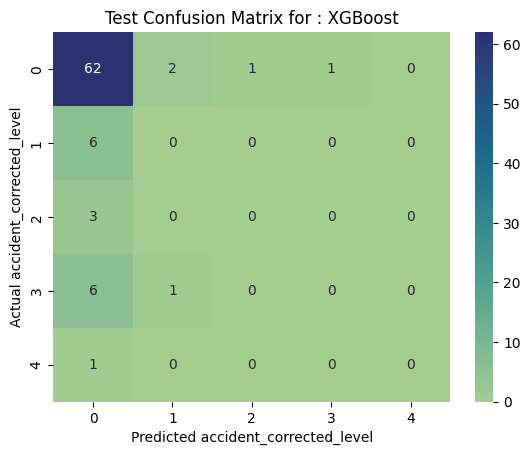

,Embedding,model,train_score,test_score
LogisticRegression,CountVectorizer,LogisticRegression(),0.990964,0.73494
Naive Bayes,CountVectorizer,GaussianNB(),0.990964,0.783133
KNN,CountVectorizer,"KNeighborsClassifier(algorithm='kd_tree', weig...",0.996988,0.771084
SVM,CountVectorizer,"SVC(C=10, gamma=0.1, kernel='linear', probabil...",0.996988,0.662651
DecisionTree,CountVectorizer,"DecisionTreeClassifier(criterion='entropy', ma...",0.76506,0.686747
RandomForest,CountVectorizer,"(DecisionTreeClassifier(max_depth=5, max_featu...",0.722892,0.795181
Bagging,CountVectorizer,(DecisionTreeClassifier(random_state=147540573...,0.951807,0.783133
AdaBoost,CountVectorizer,"(DecisionTreeClassifier(max_depth=1, random_st...",0.698795,0.698795
Gradient Boost,CountVectorizer,([DecisionTreeRegressor(criterion='friedman_ms...,0.960843,0.698795
XGBoost,CountVectorizer,"XGBClassifier(base_score=None, booster=None, c...",0.960843,0.746988


In [ ]:
# Fit the models using CountVectorizer embeddings
print ("Fitting ML classifiers using CountVectorizer embeddings:")
fitted_models_Cvect = fit_models('CountVectorizer', models, X_Cvect, data['Accident Level'])

result_df = {}
result_df = pd.DataFrame(fitted_models_Cvect)
result_Cvect = result_df.transpose()

result_Cvect

Fitting ML classifiers using FastText embeddings:
Accuracy Score with testing data - LogisticRegression: 79.52%
Accuracy Score with training data - LogisticRegression: 72.29%
Classification Metrics for LogisticRegression: 
              precision    recall  f1-score   support

           0       0.80      1.00      0.89        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.80      0.80      0.80        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.80      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


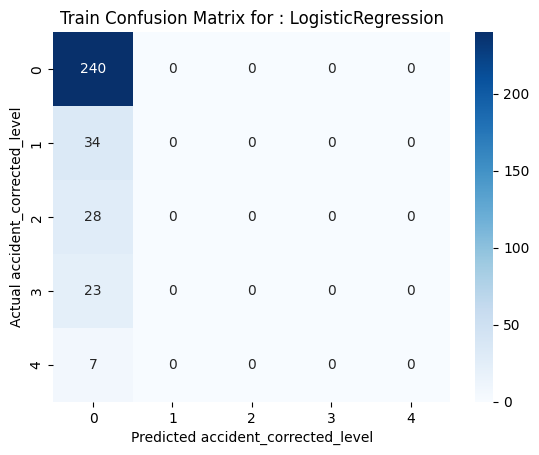

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


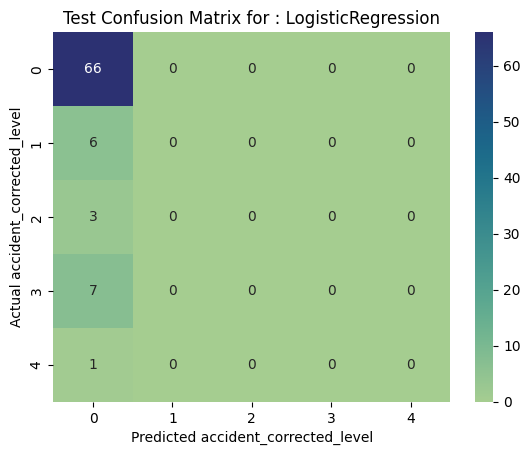

Accuracy Score with testing data - Naive Bayes: 14.46%
Accuracy Score with training data - Naive Bayes: 13.55%
Classification Metrics for Naive Bayes: 
              precision    recall  f1-score   support

           0       0.64      0.14      0.23        66
           1       0.00      0.00      0.00         6
           2       0.20      0.67      0.31         3
           3       0.06      0.14      0.08         7
           4       0.00      0.00      0.00         1

   micro avg       0.14      0.14      0.14        83
   macro avg       0.18      0.19      0.12        83
weighted avg       0.52      0.14      0.20        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


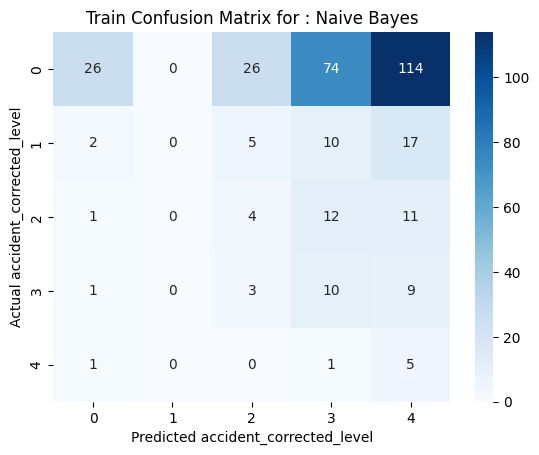

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


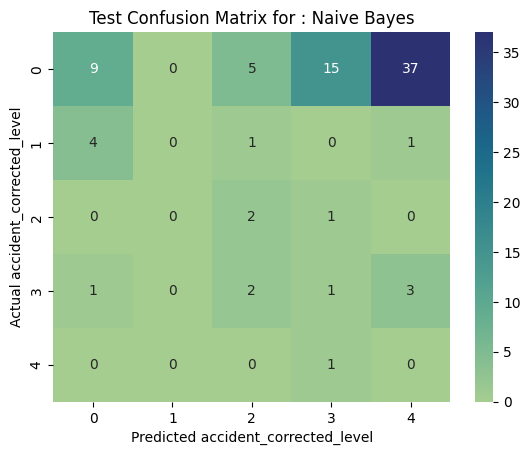

Accuracy Score with testing data - KNN: 71.08%
Accuracy Score with training data - KNN: 99.70%
Classification Metrics for KNN: 
              precision    recall  f1-score   support

           0       0.78      0.89      0.83        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.71      0.71      0.71        83
   macro avg       0.16      0.18      0.17        83
weighted avg       0.62      0.71      0.66        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


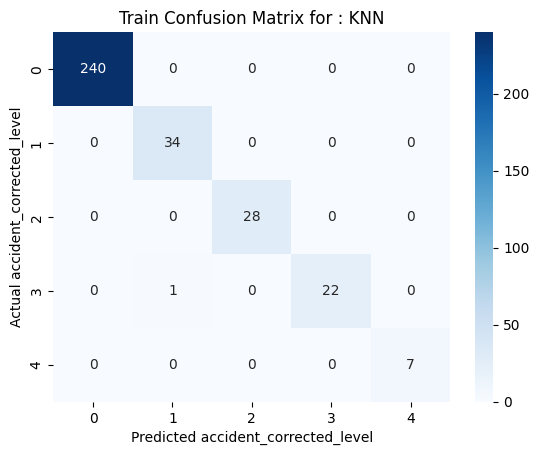

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


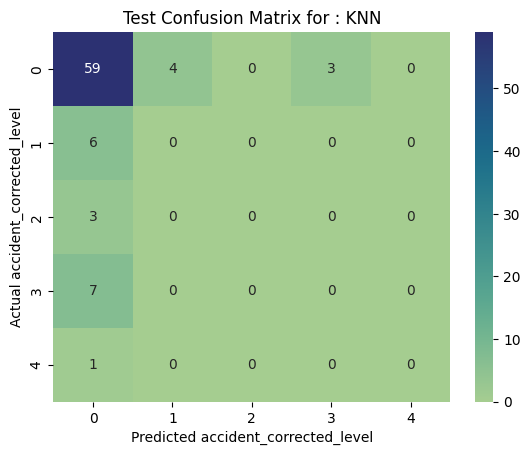

Accuracy Score with testing data - SVM: 79.52%
Accuracy Score with training data - SVM: 72.29%
Classification Metrics for SVM: 
              precision    recall  f1-score   support

           0       0.80      1.00      0.89        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.80      0.80      0.80        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.80      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


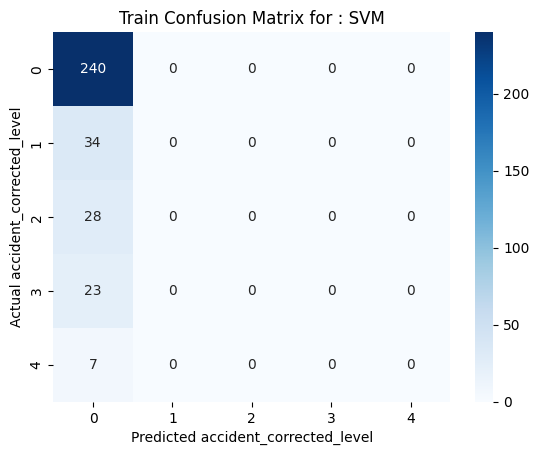

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


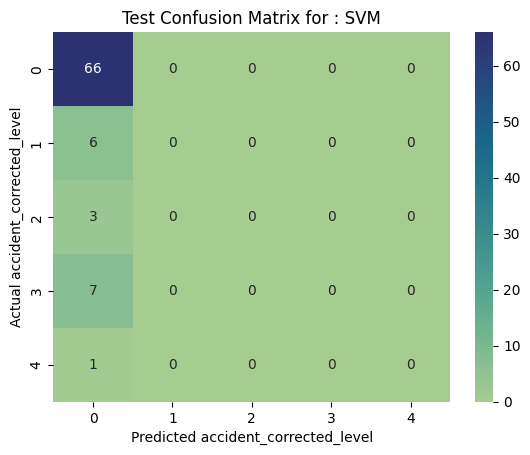

Accuracy Score with testing data - DecisionTree: 73.49%
Accuracy Score with training data - DecisionTree: 76.51%
Classification Metrics for DecisionTree: 
              precision    recall  f1-score   support

           0       0.79      0.92      0.85        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.73      0.73      0.73        83
   macro avg       0.16      0.18      0.17        83
weighted avg       0.63      0.73      0.68        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


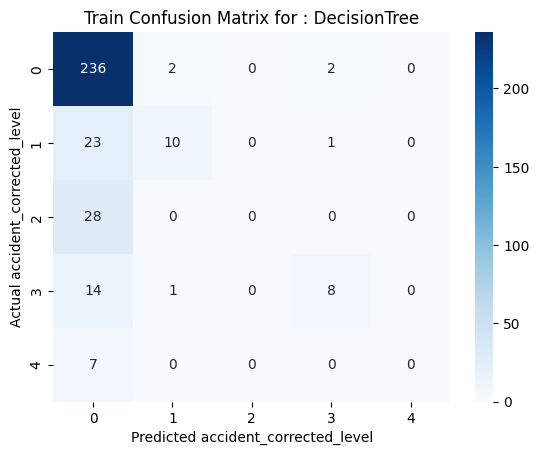

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


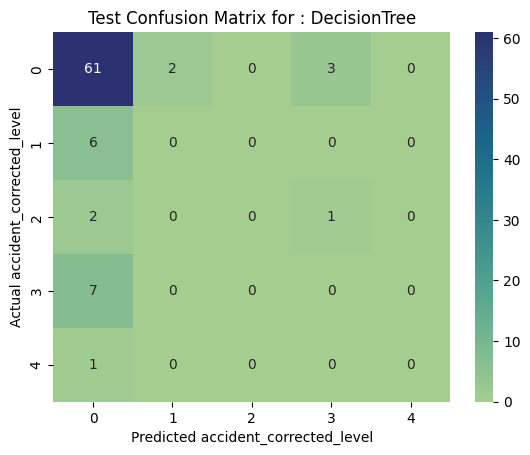

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Accuracy Score with testing data - RandomForest: 79.52%
Accuracy Score with training data - RandomForest: 72.59%
Classification Metrics for RandomForest: 
              precision    recall  f1-score   support

           0       0.80      1.00      0.89        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.80      0.80      0.80        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.80      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


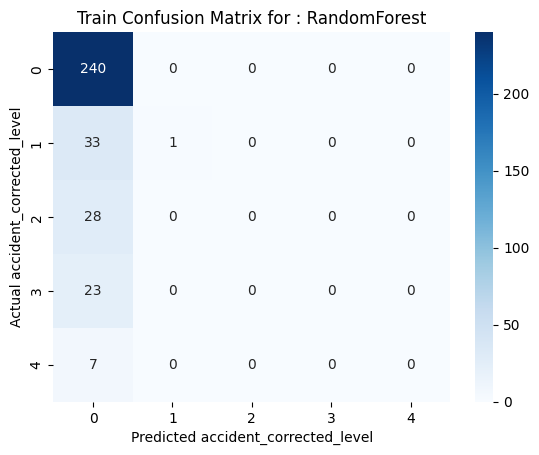

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


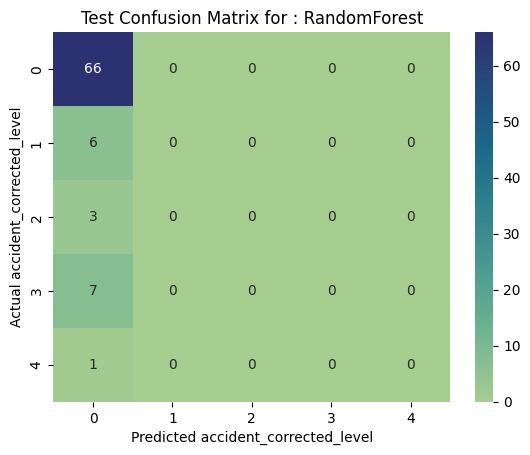

Accuracy Score with testing data - Bagging: 78.31%
Accuracy Score with training data - Bagging: 95.18%
Classification Metrics for Bagging: 
              precision    recall  f1-score   support

           0       0.79      0.98      0.88        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.78      0.78      0.78        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.78      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


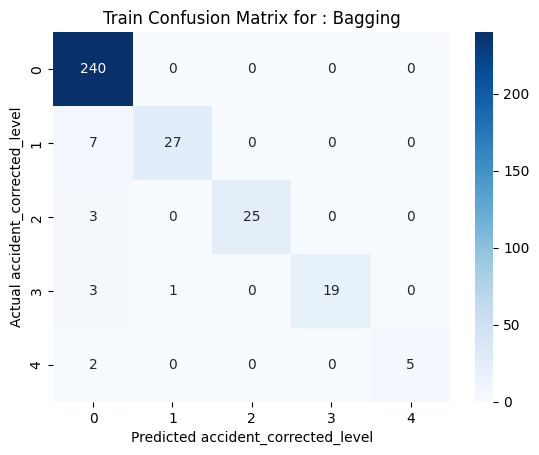

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


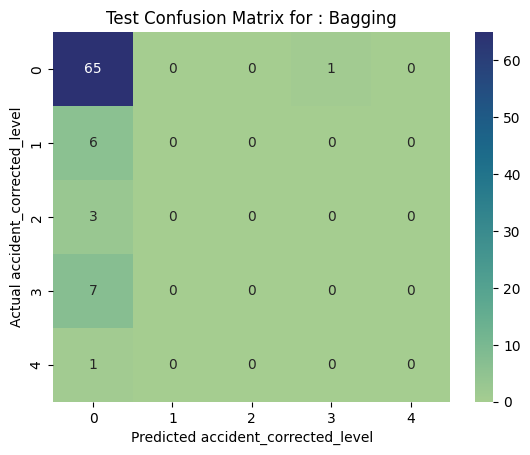

Accuracy Score with testing data - AdaBoost: 68.67%
Accuracy Score with training data - AdaBoost: 64.76%
Classification Metrics for AdaBoost: 
              precision    recall  f1-score   support

           0       0.79      0.86      0.83        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.69      0.69      0.69        83
   macro avg       0.16      0.17      0.17        83
weighted avg       0.63      0.69      0.66        83



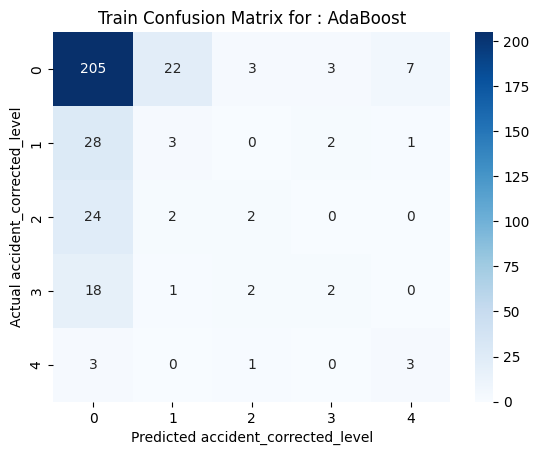

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


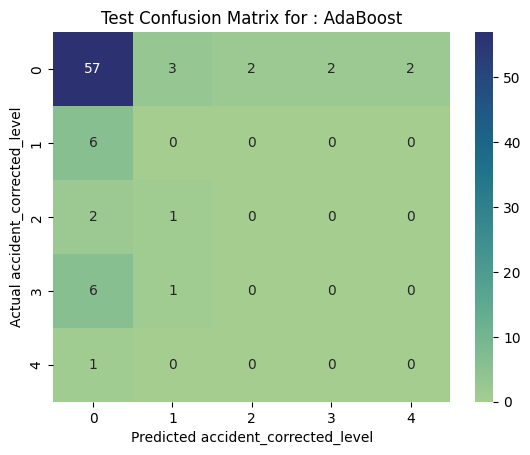

Accuracy Score with testing data - Gradient Boost: 71.08%
Accuracy Score with training data - Gradient Boost: 99.10%
Classification Metrics for Gradient Boost: 
              precision    recall  f1-score   support

           0       0.79      0.89      0.84        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.71      0.71      0.71        83
   macro avg       0.16      0.18      0.17        83
weighted avg       0.63      0.71      0.67        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


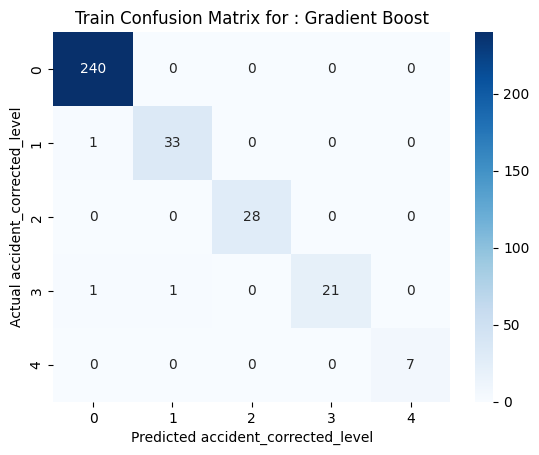

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


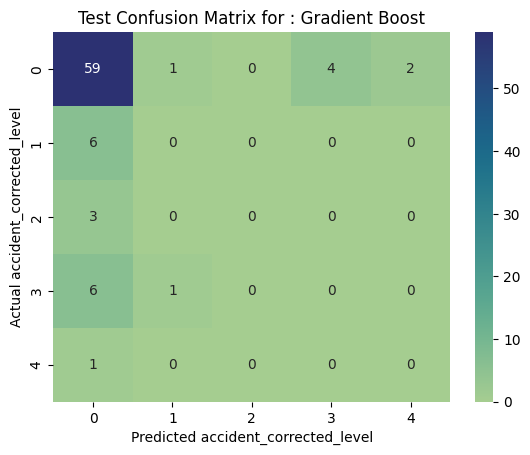

Accuracy Score with testing data - XGBoost: 74.70%
Accuracy Score with training data - XGBoost: 98.80%
Classification Metrics for XGBoost: 
              precision    recall  f1-score   support

           0       0.79      0.94      0.86        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.75      0.75      0.75        83
   macro avg       0.16      0.19      0.17        83
weighted avg       0.63      0.75      0.68        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


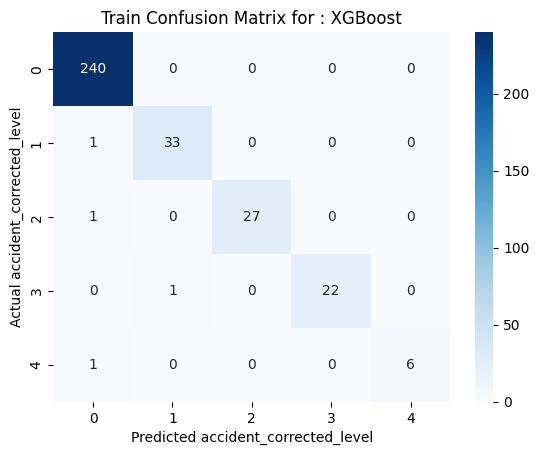

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


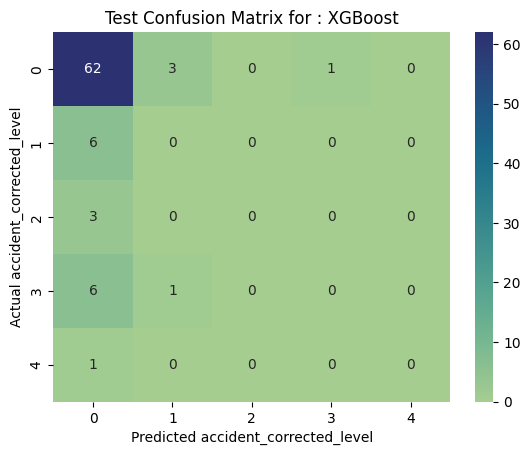

,Embedding,model,train_score,test_score
LogisticRegression,FastText,LogisticRegression(),0.722892,0.795181
Naive Bayes,FastText,GaussianNB(),0.135542,0.144578
KNN,FastText,"KNeighborsClassifier(algorithm='kd_tree', weig...",0.996988,0.710843
SVM,FastText,"SVC(C=10, gamma=0.1, kernel='linear', probabil...",0.722892,0.795181
DecisionTree,FastText,"DecisionTreeClassifier(criterion='entropy', ma...",0.76506,0.73494
RandomForest,FastText,"(DecisionTreeClassifier(max_depth=5, max_featu...",0.725904,0.795181
Bagging,FastText,(DecisionTreeClassifier(random_state=475897716...,0.951807,0.783133
AdaBoost,FastText,"(DecisionTreeClassifier(max_depth=1, random_st...",0.64759,0.686747
Gradient Boost,FastText,([DecisionTreeRegressor(criterion='friedman_ms...,0.990964,0.710843
XGBoost,FastText,"XGBClassifier(base_score=None, booster=None, c...",0.987952,0.746988


In [ ]:
# Fit the models using FastText embeddings
print ("Fitting ML classifiers using FastText embeddings:")
fitted_models_fasttext = fit_models('FastText',models, X_fasttext, data['Accident Level'])

result_df = {}
result_df = pd.DataFrame(fitted_models_fasttext)
result_ft = result_df.transpose()

result_ft

Fitting ML classifiers using Word2Vec embeddings:
Accuracy Score with testing data - LogisticRegression: 79.52%
Accuracy Score with training data - LogisticRegression: 72.29%
Classification Metrics for LogisticRegression: 
              precision    recall  f1-score   support

           0       0.80      1.00      0.89        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.80      0.80      0.80        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.80      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


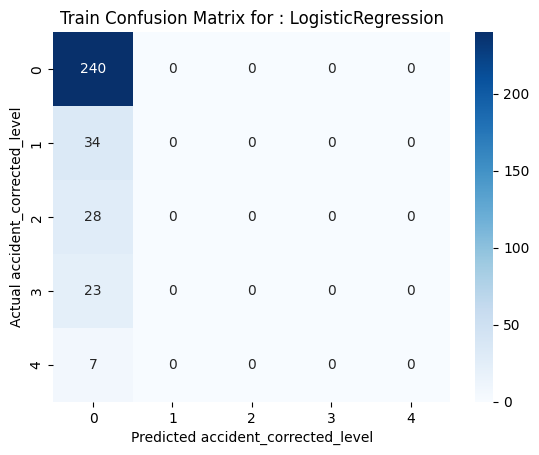

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


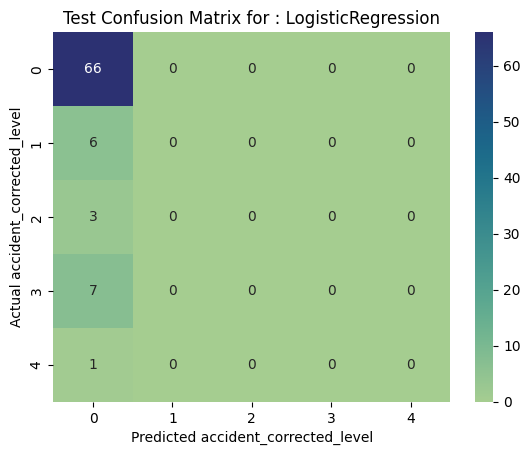

Accuracy Score with testing data - Naive Bayes: 8.43%
Accuracy Score with training data - Naive Bayes: 12.65%
Classification Metrics for Naive Bayes: 
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        66
           1       0.07      0.33      0.12         6
           2       0.11      0.33      0.17         3
           3       0.13      0.57      0.22         7
           4       0.00      0.00      0.00         1

   micro avg       0.08      0.08      0.08        83
   macro avg       0.06      0.25      0.10        83
weighted avg       0.02      0.08      0.03        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


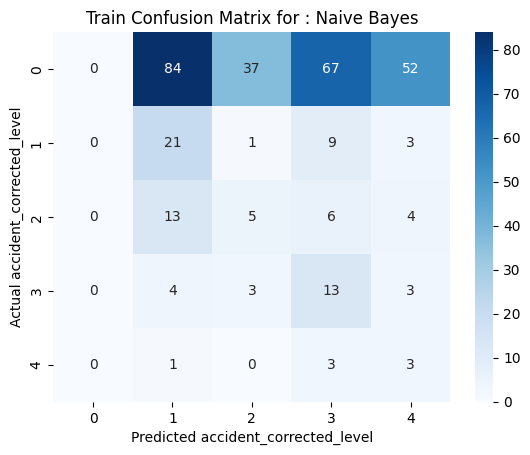

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


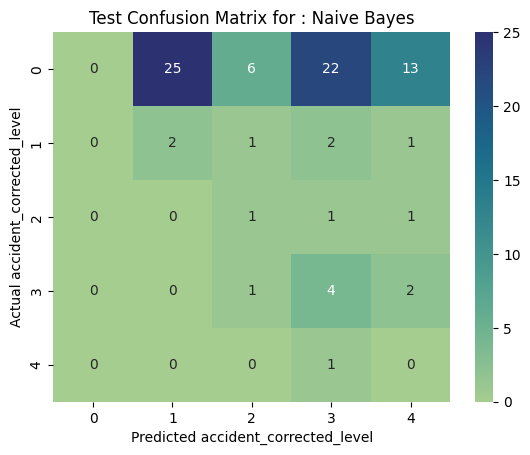

Accuracy Score with testing data - KNN: 71.08%
Accuracy Score with training data - KNN: 99.70%
Classification Metrics for KNN: 
              precision    recall  f1-score   support

           0       0.80      0.89      0.84        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.71      0.71      0.71        83
   macro avg       0.16      0.18      0.17        83
weighted avg       0.63      0.71      0.67        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


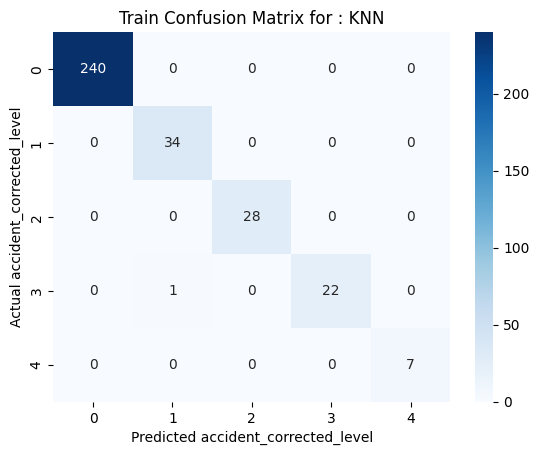

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


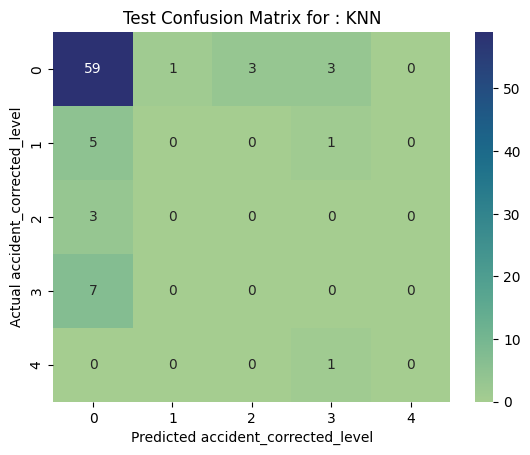

Accuracy Score with testing data - SVM: 79.52%
Accuracy Score with training data - SVM: 72.29%
Classification Metrics for SVM: 
              precision    recall  f1-score   support

           0       0.80      1.00      0.89        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.80      0.80      0.80        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.80      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


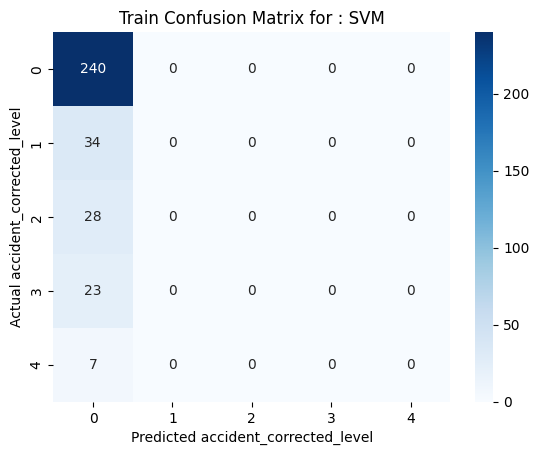

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


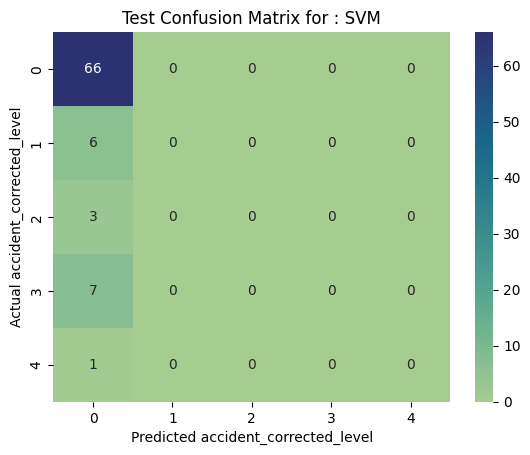

Accuracy Score with testing data - DecisionTree: 61.45%
Accuracy Score with training data - DecisionTree: 81.93%
Classification Metrics for DecisionTree: 
              precision    recall  f1-score   support

           0       0.77      0.77      0.77        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.61      0.61      0.61        83
   macro avg       0.15      0.15      0.15        83
weighted avg       0.61      0.61      0.61        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


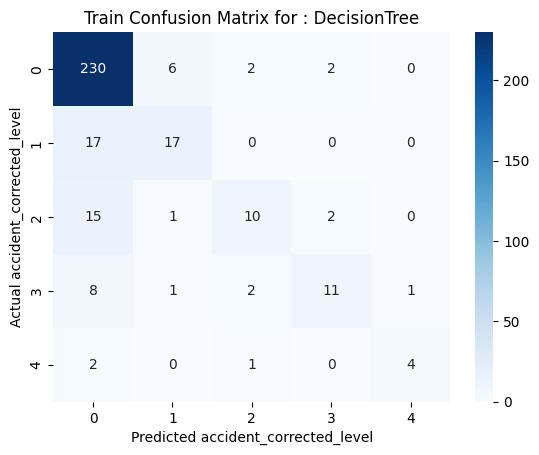

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


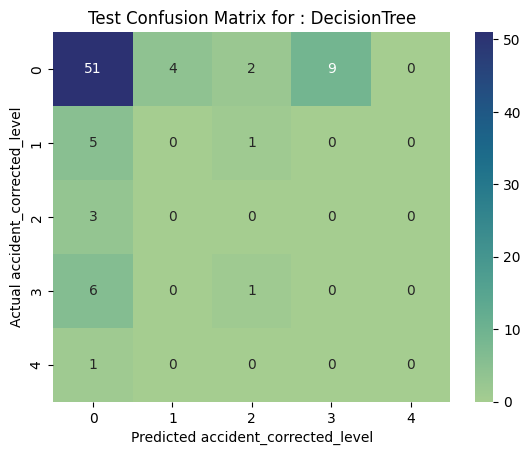

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Accuracy Score with testing data - RandomForest: 78.31%
Accuracy Score with training data - RandomForest: 73.49%
Classification Metrics for RandomForest: 
              precision    recall  f1-score   support

           0       0.79      0.98      0.88        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.78      0.78      0.78        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.78      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


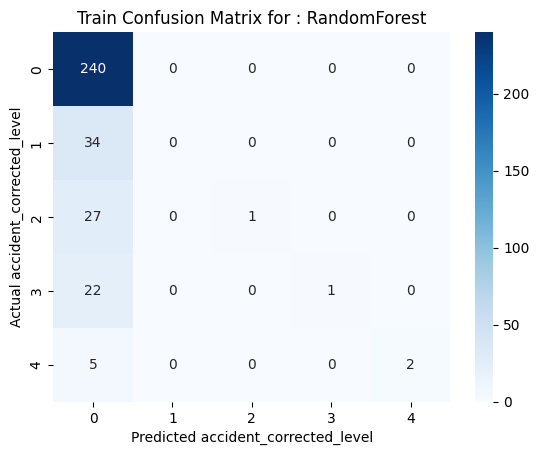

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


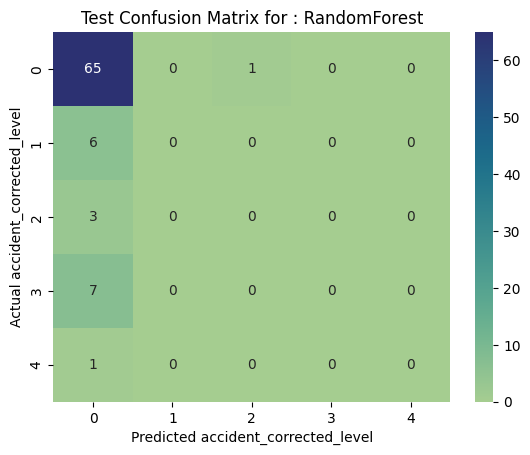

Accuracy Score with testing data - Bagging: 77.11%
Accuracy Score with training data - Bagging: 96.39%
Classification Metrics for Bagging: 
              precision    recall  f1-score   support

           0       0.79      0.97      0.87        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.77      0.77      0.77        83
   macro avg       0.16      0.19      0.17        83
weighted avg       0.63      0.77      0.69        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


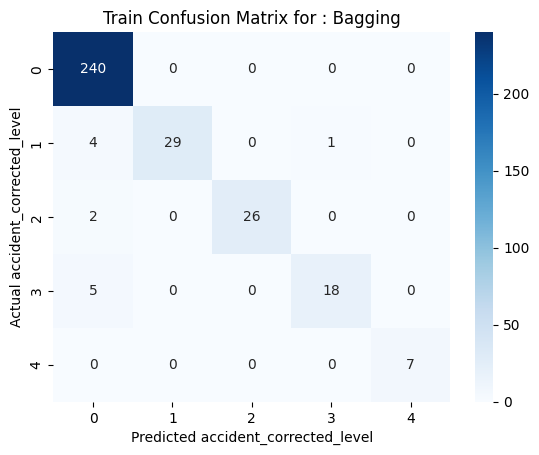

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


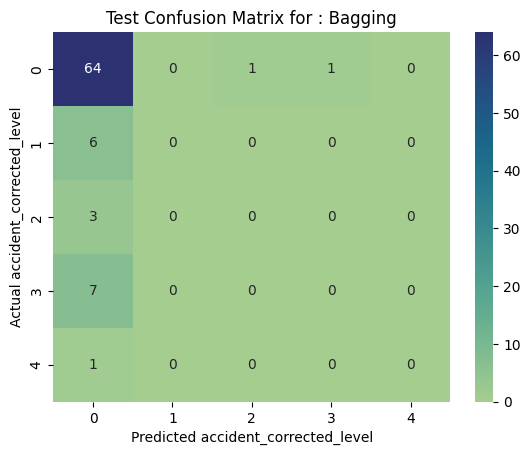

Accuracy Score with testing data - AdaBoost: 78.31%
Accuracy Score with training data - AdaBoost: 72.59%
Classification Metrics for AdaBoost: 
              precision    recall  f1-score   support

           0       0.79      0.98      0.88        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.78      0.78      0.78        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.78      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


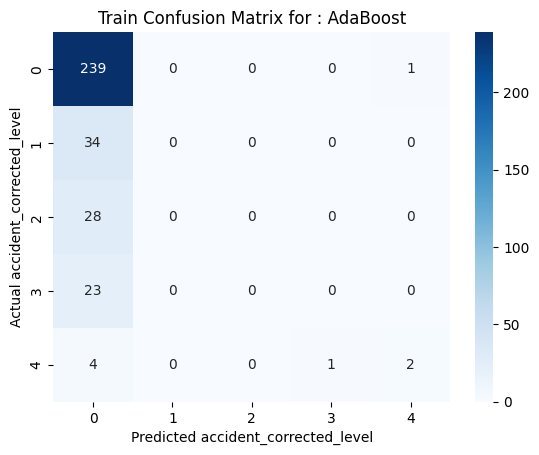

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


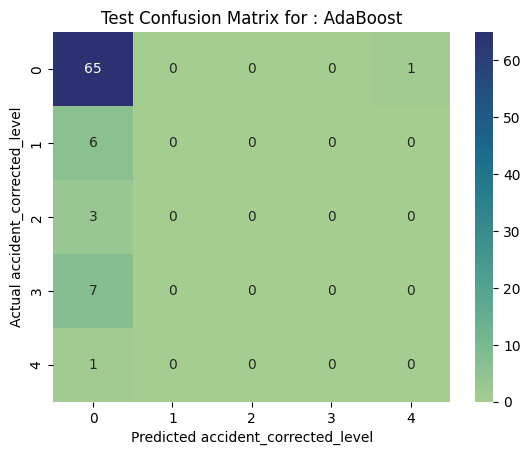

Accuracy Score with testing data - Gradient Boost: 71.08%
Accuracy Score with training data - Gradient Boost: 99.70%
Classification Metrics for Gradient Boost: 
              precision    recall  f1-score   support

           0       0.78      0.89      0.83        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.71      0.71      0.71        83
   macro avg       0.16      0.18      0.17        83
weighted avg       0.62      0.71      0.66        83



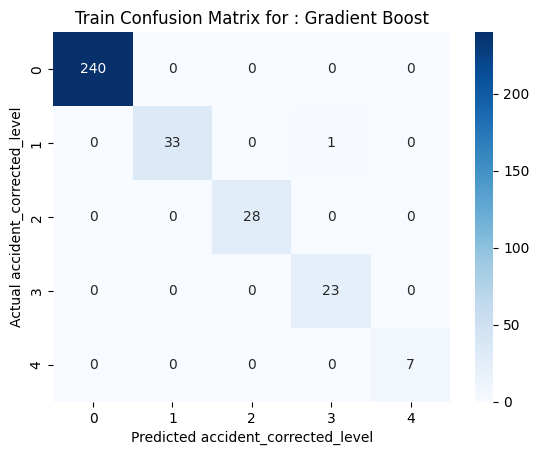

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


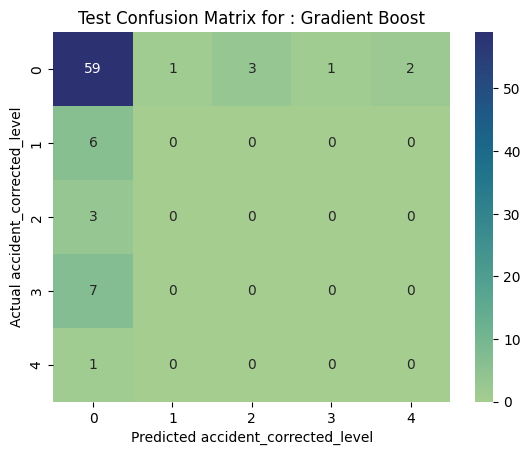

Accuracy Score with testing data - XGBoost: 78.31%
Accuracy Score with training data - XGBoost: 99.70%
Classification Metrics for XGBoost: 
              precision    recall  f1-score   support

           0       0.80      0.97      0.88        66
           1       1.00      0.17      0.29         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.78      0.78      0.78        83
   macro avg       0.36      0.23      0.23        83
weighted avg       0.71      0.78      0.72        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


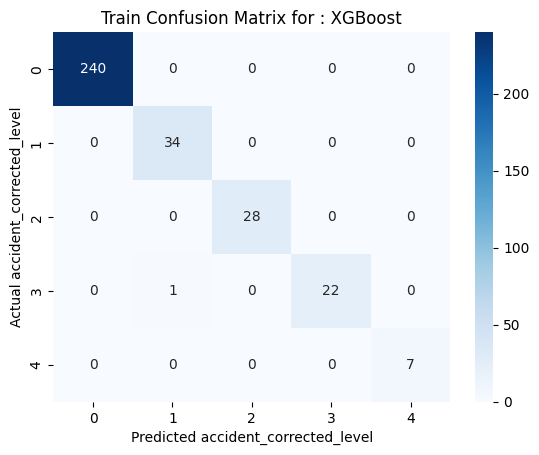

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


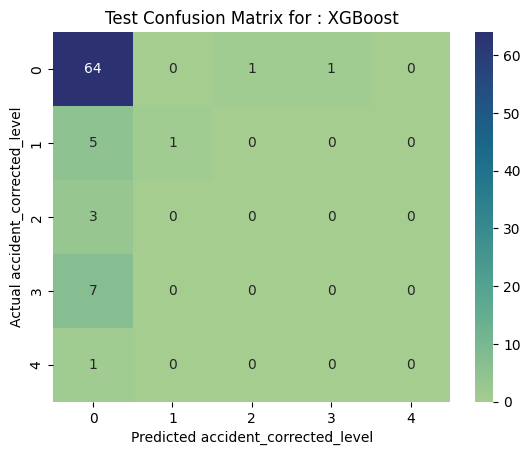

,Embedding,model,train_score,test_score
LogisticRegression,Word2Vec,LogisticRegression(),0.722892,0.795181
Naive Bayes,Word2Vec,GaussianNB(),0.126506,0.084337
KNN,Word2Vec,"KNeighborsClassifier(algorithm='kd_tree', weig...",0.996988,0.710843
SVM,Word2Vec,"SVC(C=10, gamma=0.1, kernel='linear', probabil...",0.722892,0.795181
DecisionTree,Word2Vec,"DecisionTreeClassifier(criterion='entropy', ma...",0.819277,0.614458
RandomForest,Word2Vec,"(DecisionTreeClassifier(max_depth=5, max_featu...",0.73494,0.783133
Bagging,Word2Vec,(DecisionTreeClassifier(random_state=118624298...,0.963855,0.771084
AdaBoost,Word2Vec,"(DecisionTreeClassifier(max_depth=1, random_st...",0.725904,0.783133
Gradient Boost,Word2Vec,([DecisionTreeRegressor(criterion='friedman_ms...,0.996988,0.710843
XGBoost,Word2Vec,"XGBClassifier(base_score=None, booster=None, c...",0.996988,0.783133


In [ ]:
# Fit the models using Word2Vec embeddings
print ("Fitting ML classifiers using Word2Vec embeddings:")
fitted_models_Word2Vec = fit_models('Word2Vec',models, X_Word2Vec, data['Accident Level'])

result_df = {}
result_df = pd.DataFrame(fitted_models_Word2Vec)
result_wv = result_df.transpose()

result_wv

Fitting ML classifiers using GloVe embeddings:
Accuracy Score with testing data - LogisticRegression: 79.52%
Accuracy Score with training data - LogisticRegression: 73.19%
Classification Metrics for LogisticRegression: 
              precision    recall  f1-score   support

           0       0.80      1.00      0.89        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.80      0.80      0.80        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.80      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels wit

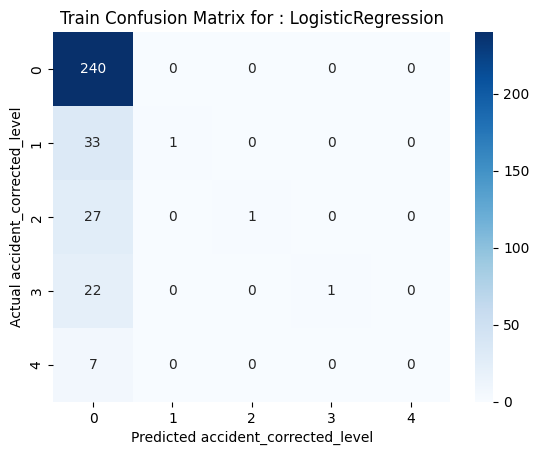

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


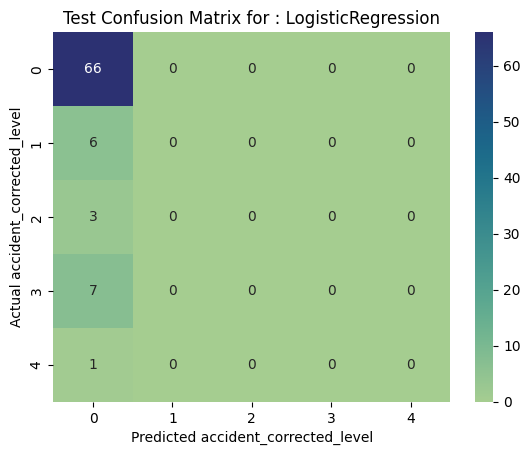

Accuracy Score with testing data - Naive Bayes: 50.60%
Accuracy Score with training data - Naive Bayes: 67.17%
Classification Metrics for Naive Bayes: 
              precision    recall  f1-score   support

           0       0.81      0.59      0.68        66
           1       0.11      0.17      0.13         6
           2       0.07      0.33      0.12         3
           3       0.10      0.14      0.12         7
           4       0.00      0.00      0.00         1

   micro avg       0.51      0.51      0.51        83
   macro avg       0.22      0.25      0.21        83
weighted avg       0.67      0.51      0.57        83



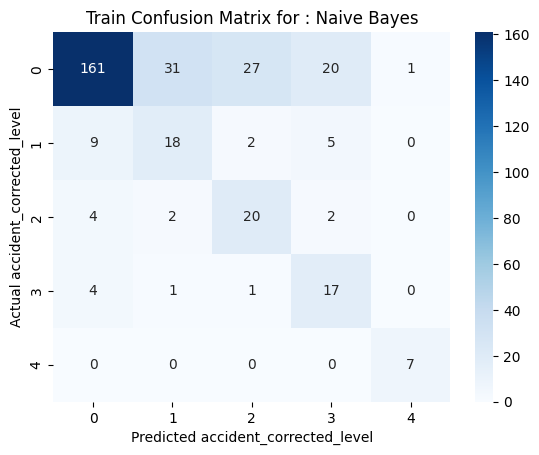

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


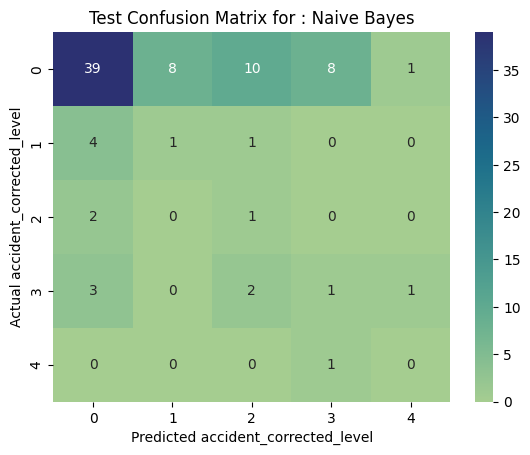

Accuracy Score with testing data - KNN: 73.49%
Accuracy Score with training data - KNN: 99.70%
Classification Metrics for KNN: 
              precision    recall  f1-score   support

           0       0.81      0.92      0.87        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.73      0.73      0.73        83
   macro avg       0.16      0.18      0.17        83
weighted avg       0.65      0.73      0.69        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


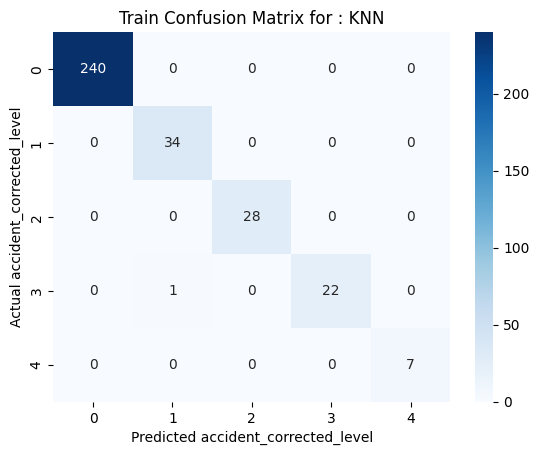

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


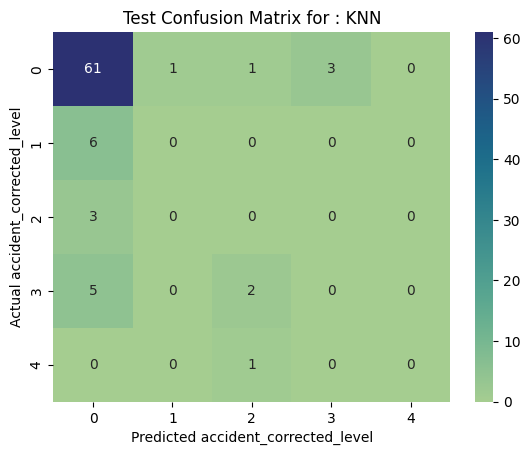

Accuracy Score with testing data - SVM: 78.31%
Accuracy Score with training data - SVM: 89.46%
Classification Metrics for SVM: 
              precision    recall  f1-score   support

           0       0.84      0.92      0.88        66
           1       0.50      0.17      0.25         6
           2       0.25      0.33      0.29         3
           3       0.50      0.29      0.36         7
           4       0.00      0.00      0.00         1

   micro avg       0.78      0.78      0.78        83
   macro avg       0.42      0.34      0.36        83
weighted avg       0.75      0.78      0.76        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


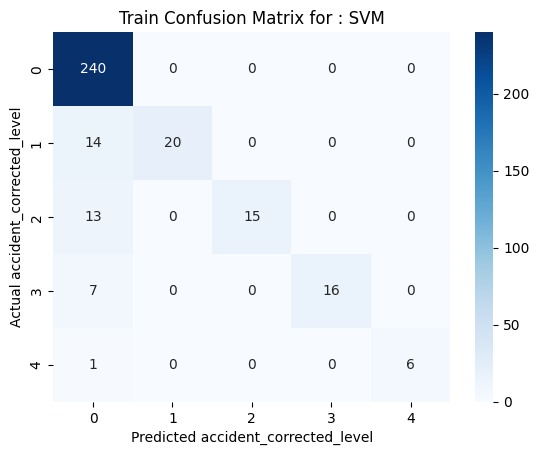

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


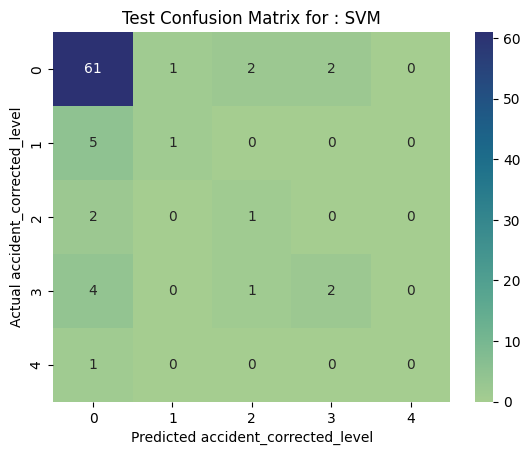

Accuracy Score with testing data - DecisionTree: 63.86%
Accuracy Score with training data - DecisionTree: 82.23%
Classification Metrics for DecisionTree: 
              precision    recall  f1-score   support

           0       0.79      0.79      0.79        66
           1       0.17      0.17      0.17         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.64      0.64      0.64        83
   macro avg       0.19      0.19      0.19        83
weighted avg       0.64      0.64      0.64        83



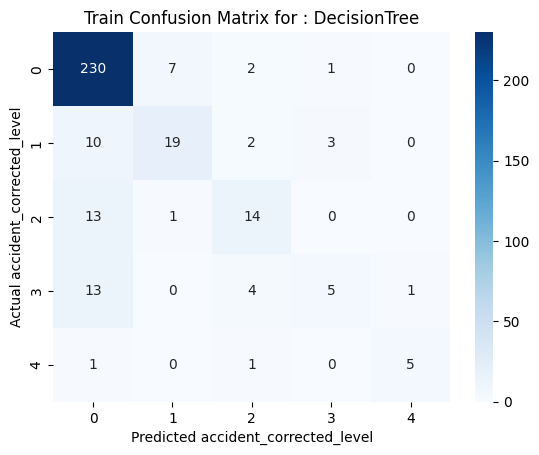

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


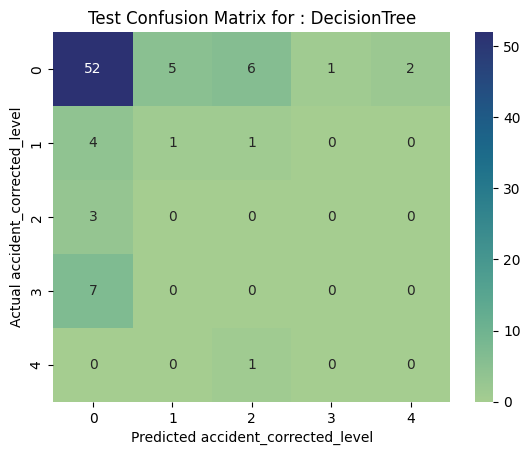

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Accuracy Score with testing data - RandomForest: 79.52%
Accuracy Score with training data - RandomForest: 75.60%
Classification Metrics for RandomForest: 
              precision    recall  f1-score   support

           0       0.80      1.00      0.89        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.80      0.80      0.80        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.63      0.80      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


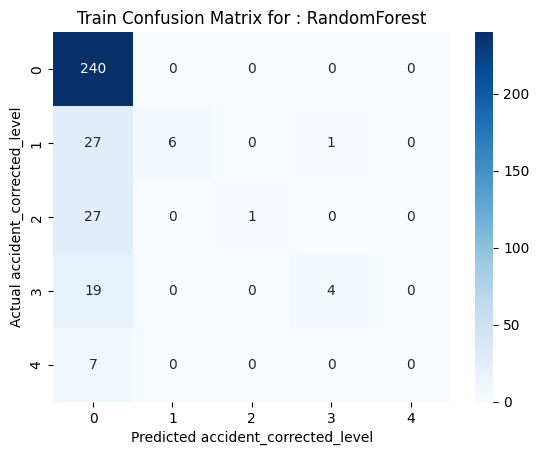

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


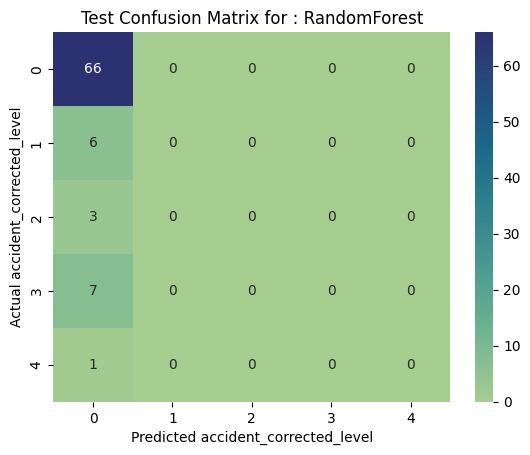

Accuracy Score with testing data - Bagging: 77.11%
Accuracy Score with training data - Bagging: 96.99%
Classification Metrics for Bagging: 
              precision    recall  f1-score   support

           0       0.80      0.97      0.88        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.77      0.77      0.77        83
   macro avg       0.16      0.19      0.18        83
weighted avg       0.64      0.77      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


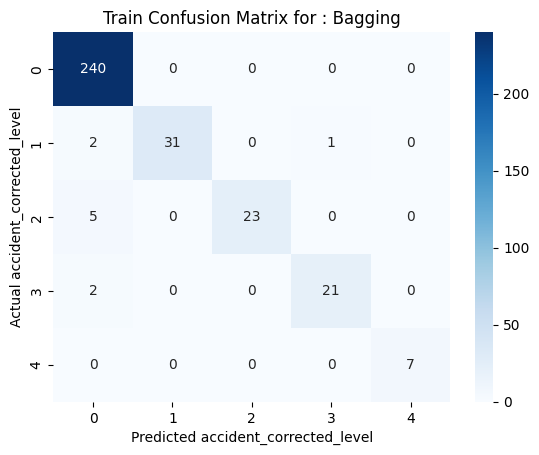

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


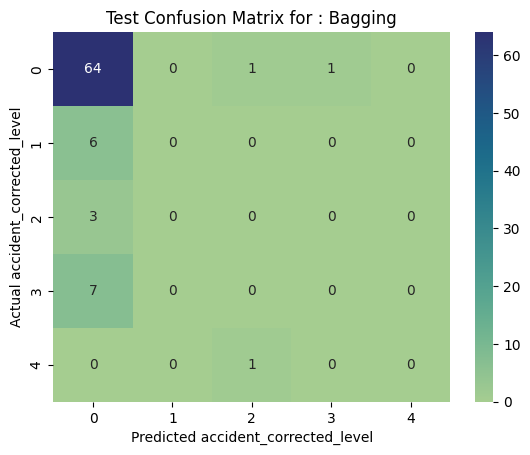

Accuracy Score with testing data - AdaBoost: 66.27%
Accuracy Score with training data - AdaBoost: 63.25%
Classification Metrics for AdaBoost: 
              precision    recall  f1-score   support

           0       0.80      0.79      0.79        66
           1       0.25      0.50      0.33         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.66      0.66      0.66        83
   macro avg       0.21      0.26      0.23        83
weighted avg       0.65      0.66      0.66        83



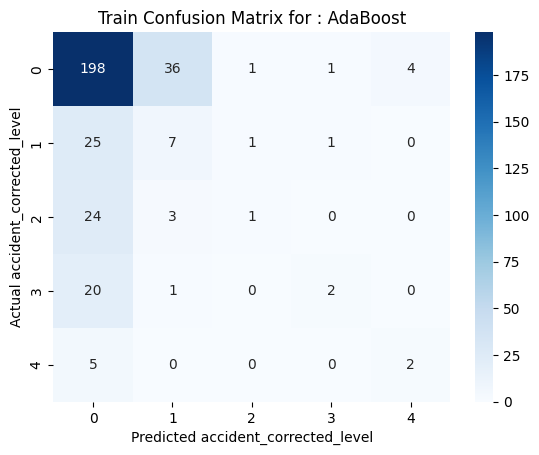

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


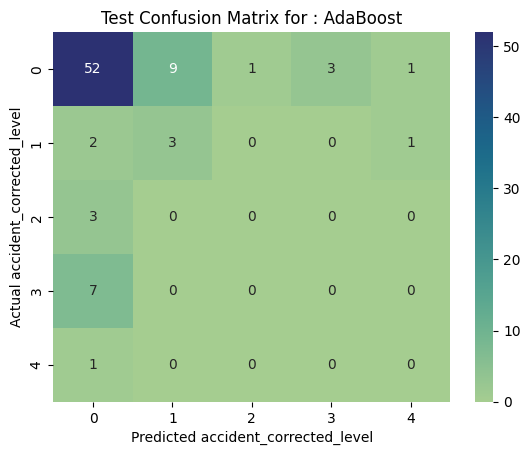

Accuracy Score with testing data - Gradient Boost: 74.70%
Accuracy Score with training data - Gradient Boost: 99.70%
Classification Metrics for Gradient Boost: 
              precision    recall  f1-score   support

           0       0.79      0.94      0.86        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.75      0.75      0.75        83
   macro avg       0.16      0.19      0.17        83
weighted avg       0.63      0.75      0.68        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


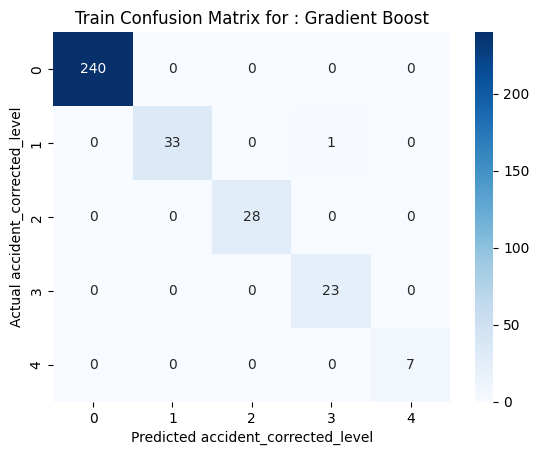

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


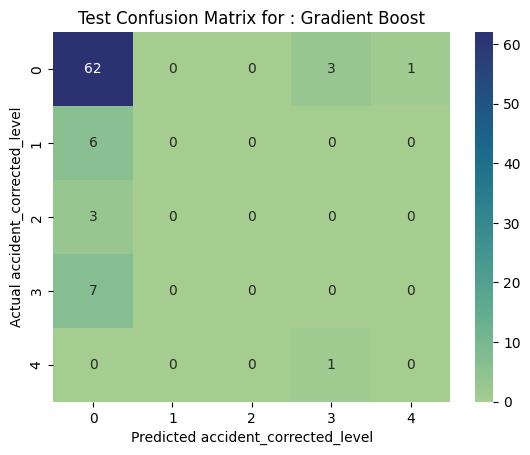

Accuracy Score with testing data - XGBoost: 77.11%
Accuracy Score with training data - XGBoost: 99.70%
Classification Metrics for XGBoost: 
              precision    recall  f1-score   support

           0       0.79      0.97      0.87        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.77      0.77      0.77        83
   macro avg       0.16      0.19      0.17        83
weighted avg       0.63      0.77      0.69        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


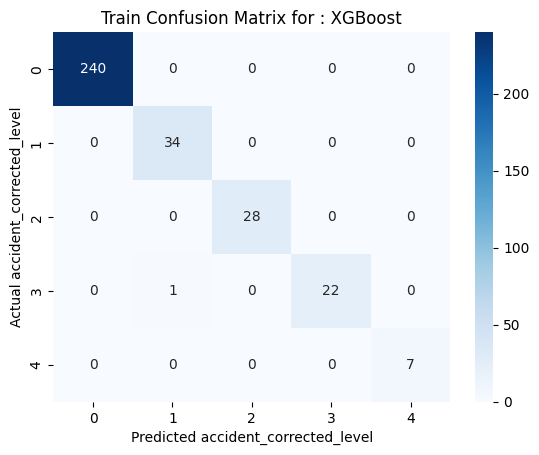

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


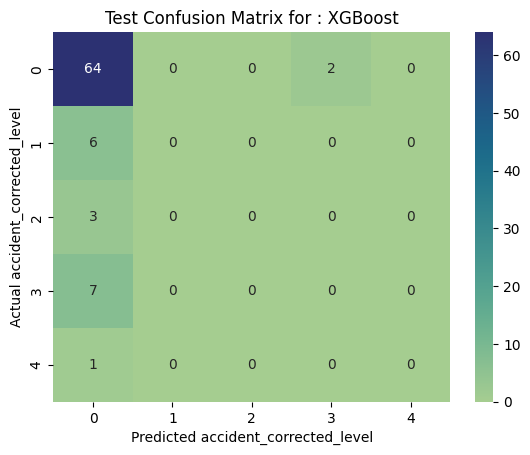

,Embedding,model,train_score,test_score
LogisticRegression,GloVe,LogisticRegression(),0.731928,0.795181
Naive Bayes,GloVe,GaussianNB(),0.671687,0.506024
KNN,GloVe,"KNeighborsClassifier(algorithm='kd_tree', weig...",0.996988,0.73494
SVM,GloVe,"SVC(C=10, gamma=0.1, kernel='linear', probabil...",0.894578,0.783133
DecisionTree,GloVe,"DecisionTreeClassifier(criterion='entropy', ma...",0.822289,0.638554
RandomForest,GloVe,"(DecisionTreeClassifier(max_depth=5, max_featu...",0.756024,0.795181
Bagging,GloVe,(DecisionTreeClassifier(random_state=822573037...,0.96988,0.771084
AdaBoost,GloVe,"(DecisionTreeClassifier(max_depth=1, random_st...",0.63253,0.662651
Gradient Boost,GloVe,([DecisionTreeRegressor(criterion='friedman_ms...,0.996988,0.746988
XGBoost,GloVe,"XGBClassifier(base_score=None, booster=None, c...",0.996988,0.771084


In [ ]:
# Fit the models using GloVe embeddings
print ("Fitting ML classifiers using GloVe embeddings:")
fitted_models_Glove = fit_models('GloVe',models, X_Glove, data['Accident Level'])

result_df = {}
result_df = pd.DataFrame(fitted_models_Glove)
result_GV = result_df.transpose()

result_GV

#Balancing the data set using SMOTE

In [ ]:
from imblearn.over_sampling import SMOTE

# Split the data into features and target variable
def apply_train_test_split(X, y):
    y = y - 1
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    return X_train, X_test, y_train, y_test

# Apply SMOTE to oversample the minority class
def apply_SMOTE(X, y):
    smote = SMOTE(random_state=42)
    X_resampled, y_resampled = smote.fit_resample(X, y)
    return X_resampled, y_resampled

def fit_models_balanced(embed,models, X_resampled, y_resampled, X_test, y_test):

    names=[]
    scores=[]
    train_scores=[]

    model_scores = {}
    for name, model in models.items():
        # Fit the model
        model.fit(X_resampled, y_resampled)
        # Make predictions on test data
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_resampled)
        # Calculate accuracy score
        score = accuracy_score(y_test, y_pred)
        train_score=accuracy_score(y_resampled, y_train_pred)
        print("Accuracy Score with testing data - "+name+": {0:0.2f}%".format(score*100))
        print("Accuracy Score with training data - "+name+": {0:0.2f}%".format(train_score*100))
        print("Classification Metrics for "+name+": ")
        print(metrics.classification_report(y_test,y_pred,labels=['0','1','2','3','4']));
        cm_train = confusion_matrix(y_resampled, y_train_pred)
        #print(cm_train)
        sns.heatmap(cm_train, annot=True, cmap="Blues", fmt="d")
        plt.title('Train Confusion Matrix for : '+name)
        plt.xlabel('Predicted accident_corrected_level')
        plt.ylabel('Actual accident_corrected_level')
        plt.show();
        print("------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------")
        cm = confusion_matrix(y_test, y_pred)
        #print(cm)
        sns.heatmap(cm, annot=True, cmap="crest", fmt="d")
        plt.title('Test Confusion Matrix for : '+name)
        plt.xlabel('Predicted accident_corrected_level')
        plt.ylabel('Actual accident_corrected_level')
        plt.show();

        # Store the fitted model and its test score
        names.append(name)
        scores.append(score)
        train_scores.append(train_score)
        model_scores[name] = {'Embedding':embed, 'model': model,'train_score': train_score, 'test_score': score}
    return model_scores

#Fitting various ML classifiers on balanced data set using available embeddings

Fitting ML classifiers using TFIDF embeddings: 
Accuracy Score with testing data - LogisticRegression: 68.67%
Accuracy Score with training data - LogisticRegression: 99.50%
Classification Metrics for LogisticRegression: 
              precision    recall  f1-score   support

           0       0.78      0.86      0.82        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.69      0.69      0.69        83
   macro avg       0.16      0.17      0.16        83
weighted avg       0.62      0.69      0.65        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


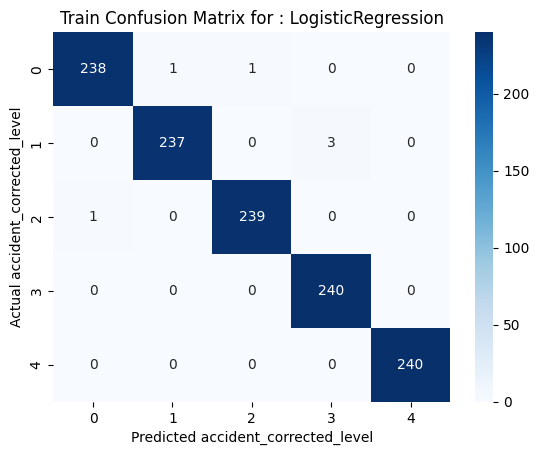

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


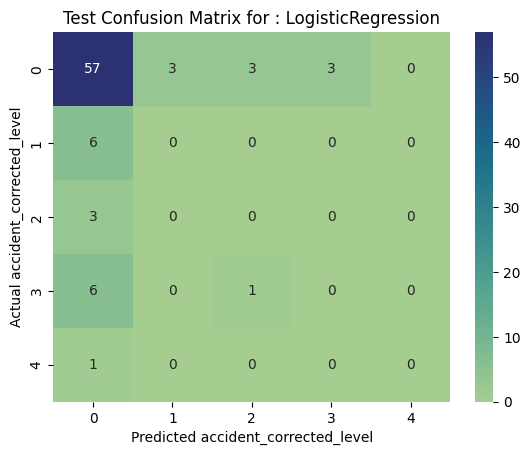

Accuracy Score with testing data - Naive Bayes: 77.11%
Accuracy Score with training data - Naive Bayes: 99.92%
Classification Metrics for Naive Bayes: 
              precision    recall  f1-score   support

           0       0.81      0.97      0.88        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.77      0.77      0.77        83
   macro avg       0.16      0.19      0.18        83
weighted avg       0.64      0.77      0.70        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


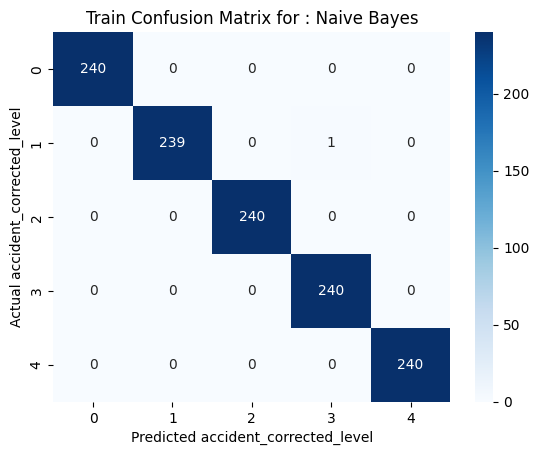

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


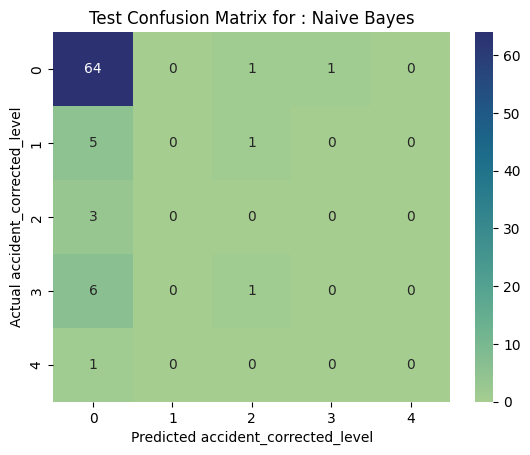

Accuracy Score with testing data - KNN: 7.23%
Accuracy Score with training data - KNN: 99.92%
Classification Metrics for KNN: 
              precision    recall  f1-score   support

           0       1.00      0.02      0.03        66
           1       0.04      0.17      0.07         6
           2       0.04      0.33      0.06         3
           3       0.12      0.29      0.17         7
           4       0.07      1.00      0.12         1

   micro avg       0.07      0.07      0.07        83
   macro avg       0.25      0.36      0.09        83
weighted avg       0.81      0.07      0.05        83



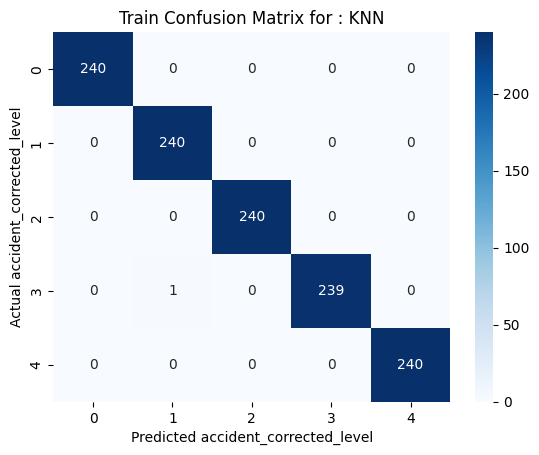

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


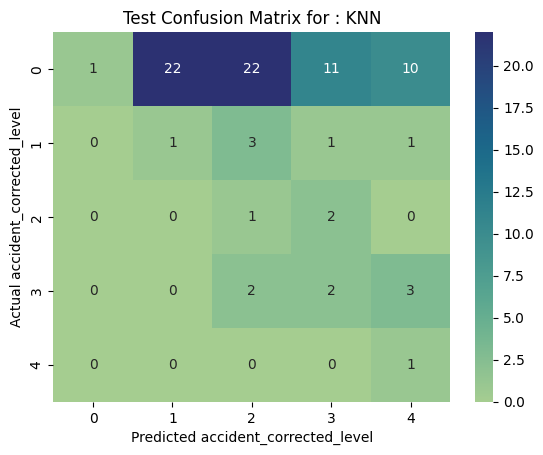

Accuracy Score with testing data - SVM: 74.70%
Accuracy Score with training data - SVM: 99.50%
Classification Metrics for SVM: 
              precision    recall  f1-score   support

           0       0.78      0.94      0.86        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.75      0.75      0.75        83
   macro avg       0.16      0.19      0.17        83
weighted avg       0.62      0.75      0.68        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


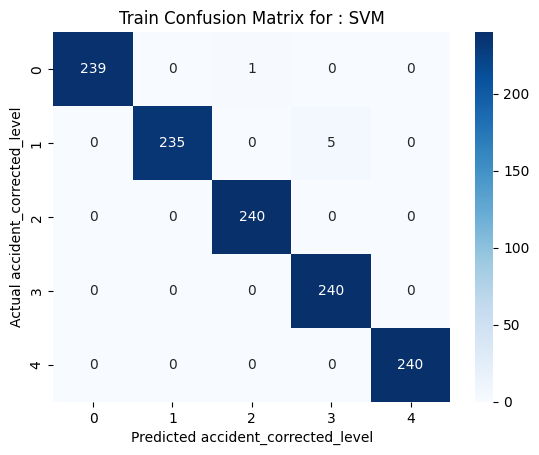

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


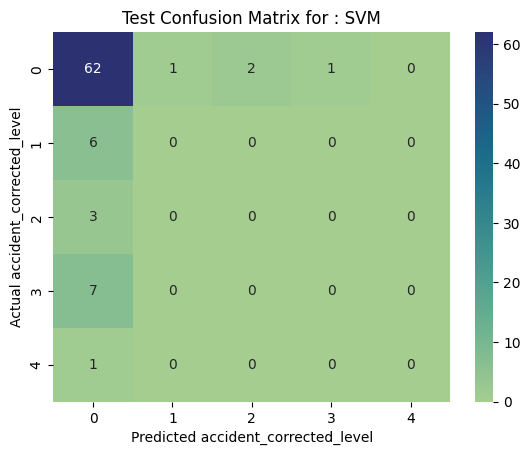

Accuracy Score with testing data - DecisionTree: 43.37%
Accuracy Score with training data - DecisionTree: 81.42%
Classification Metrics for DecisionTree: 
              precision    recall  f1-score   support

           0       0.86      0.45      0.59        66
           1       0.12      0.83      0.22         6
           2       0.00      0.00      0.00         3
           3       0.33      0.14      0.20         7
           4       0.00      0.00      0.00         1

   micro avg       0.43      0.43      0.43        83
   macro avg       0.26      0.29      0.20        83
weighted avg       0.72      0.43      0.50        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


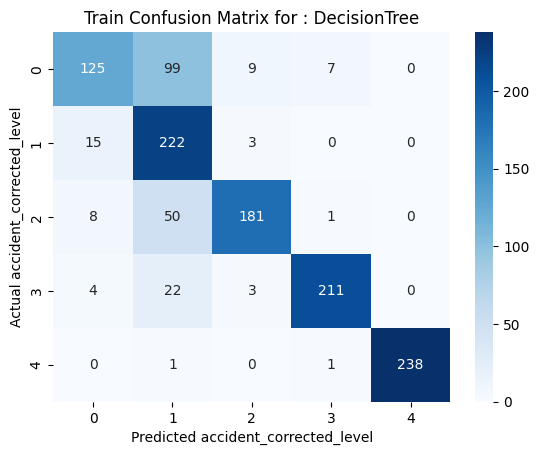

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


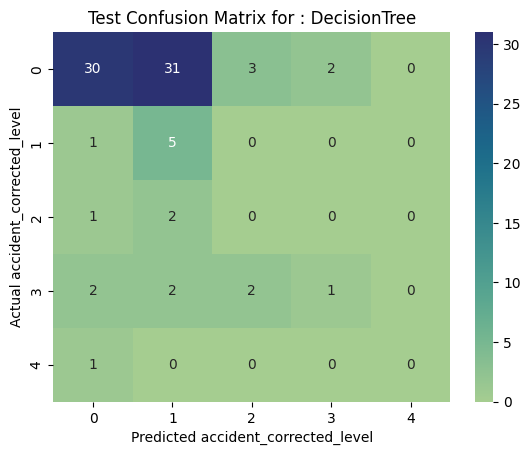

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Accuracy Score with testing data - RandomForest: 61.45%
Accuracy Score with training data - RandomForest: 93.17%
Classification Metrics for RandomForest: 
              precision    recall  f1-score   support

           0       0.77      0.76      0.76        66
           1       0.14      0.17      0.15         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.61      0.61      0.61        83
   macro avg       0.18      0.18      0.18        83
weighted avg       0.62      0.61      0.62        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


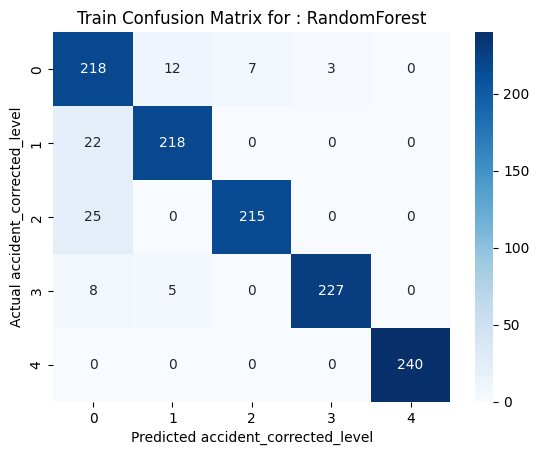

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


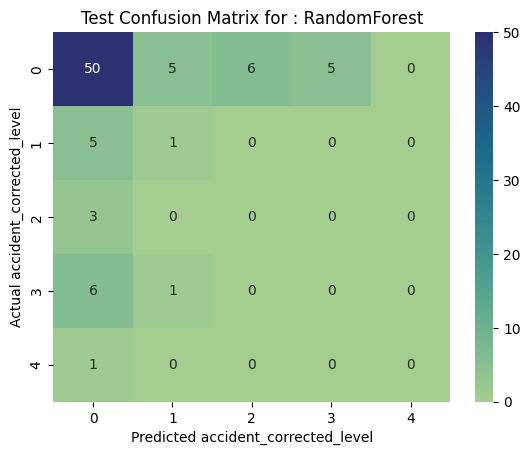

Accuracy Score with testing data - Bagging: 68.67%
Accuracy Score with training data - Bagging: 99.75%
Classification Metrics for Bagging: 
              precision    recall  f1-score   support

           0       0.79      0.86      0.83        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.69      0.69      0.69        83
   macro avg       0.16      0.17      0.17        83
weighted avg       0.63      0.69      0.66        83



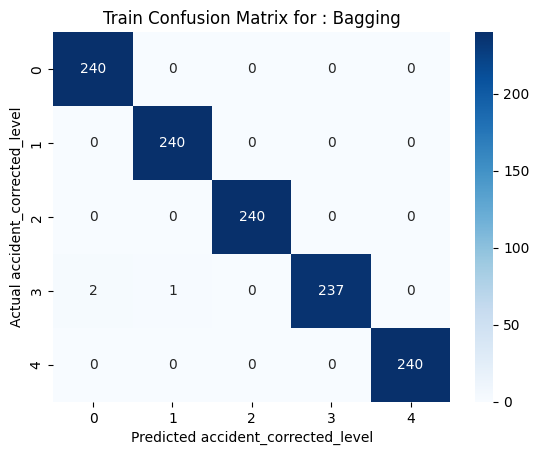

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


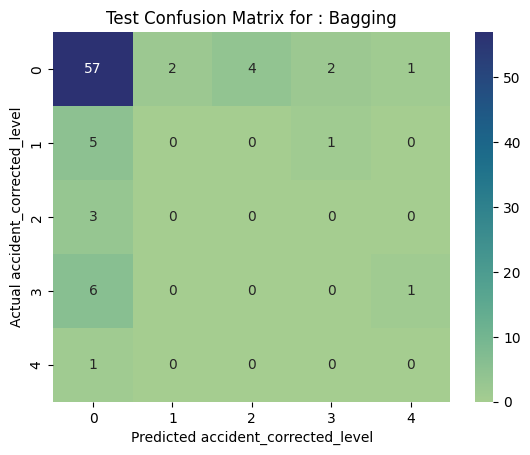

Accuracy Score with testing data - AdaBoost: 19.28%
Accuracy Score with training data - AdaBoost: 42.58%
Classification Metrics for AdaBoost: 
              precision    recall  f1-score   support

           0       0.83      0.15      0.26        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.09      0.86      0.17         7
           4       0.00      0.00      0.00         1

   micro avg       0.19      0.19      0.19        83
   macro avg       0.19      0.20      0.08        83
weighted avg       0.67      0.19      0.22        83



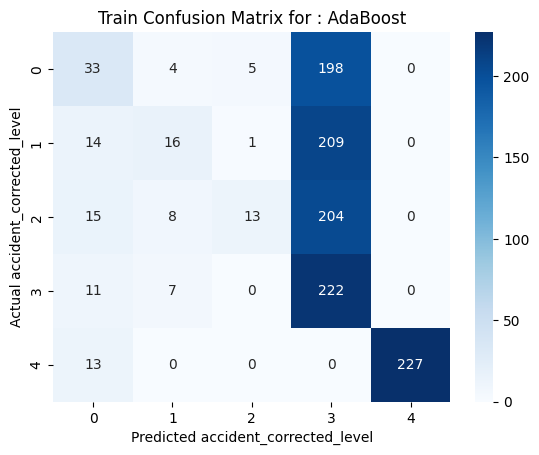

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


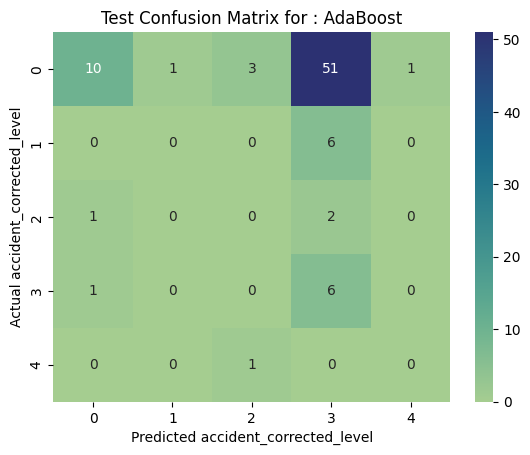

Accuracy Score with testing data - Gradient Boost: 72.29%
Accuracy Score with training data - Gradient Boost: 99.75%
Classification Metrics for Gradient Boost: 
              precision    recall  f1-score   support

           0       0.84      0.86      0.85        66
           1       0.14      0.17      0.15         6
           2       0.33      0.33      0.33         3
           3       0.33      0.14      0.20         7
           4       0.00      0.00      0.00         1

   micro avg       0.72      0.72      0.72        83
   macro avg       0.33      0.30      0.31        83
weighted avg       0.72      0.72      0.72        83



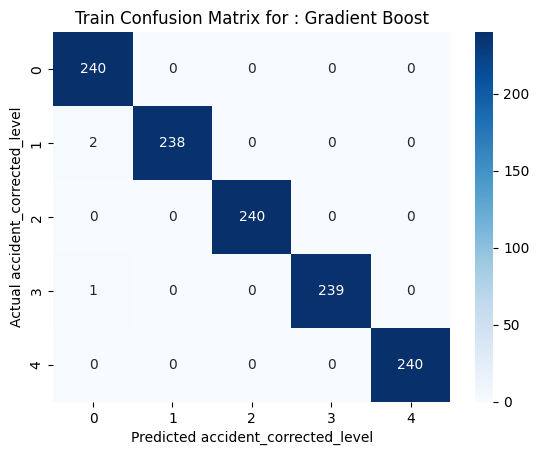

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


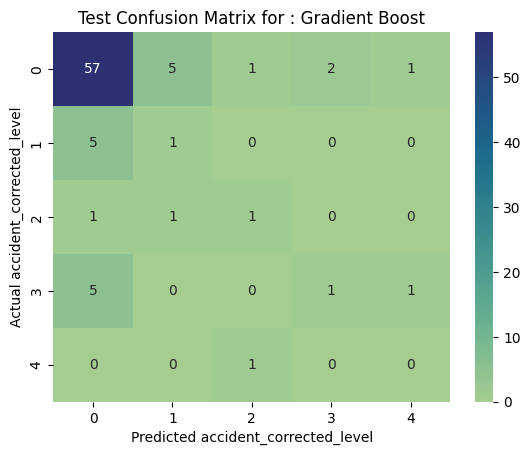

Accuracy Score with testing data - XGBoost: 72.29%
Accuracy Score with training data - XGBoost: 99.75%
Classification Metrics for XGBoost: 
              precision    recall  f1-score   support

           0       0.82      0.89      0.86        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.20      0.14      0.17         7
           4       0.00      0.00      0.00         1

   micro avg       0.72      0.72      0.72        83
   macro avg       0.20      0.21      0.20        83
weighted avg       0.67      0.72      0.69        83



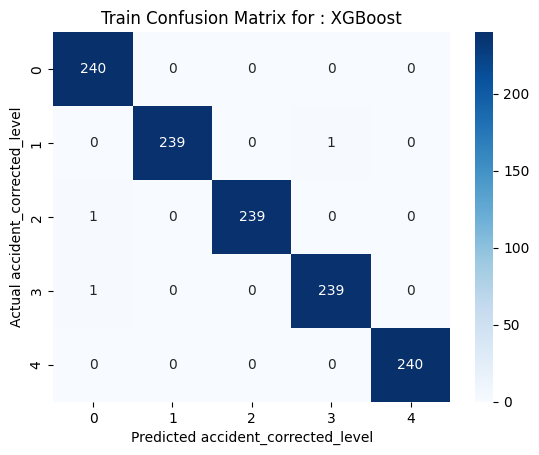

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


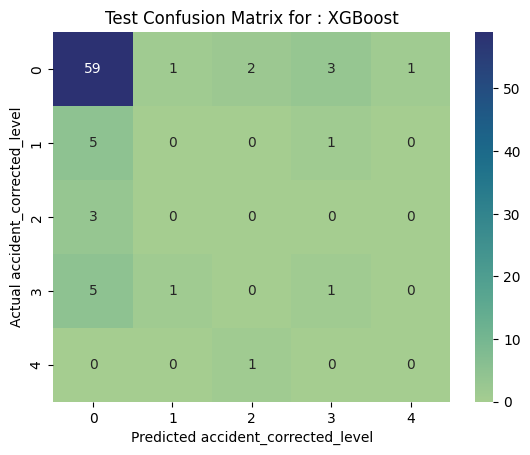

,Embedding,model,train_score,test_score
LogisticRegression,tfidf,LogisticRegression(),0.995,0.686747
Naive Bayes,tfidf,GaussianNB(),0.999167,0.771084
KNN,tfidf,"KNeighborsClassifier(algorithm='kd_tree', weig...",0.999167,0.072289
SVM,tfidf,"SVC(C=10, gamma=0.1, kernel='linear', probabil...",0.995,0.746988
DecisionTree,tfidf,"DecisionTreeClassifier(criterion='entropy', ma...",0.814167,0.433735
RandomForest,tfidf,"(DecisionTreeClassifier(max_depth=5, max_featu...",0.931667,0.614458
Bagging,tfidf,(DecisionTreeClassifier(random_state=632028014...,0.9975,0.686747
AdaBoost,tfidf,"(DecisionTreeClassifier(max_depth=1, random_st...",0.425833,0.192771
Gradient Boost,tfidf,([DecisionTreeRegressor(criterion='friedman_ms...,0.9975,0.722892
XGBoost,tfidf,"XGBClassifier(base_score=None, booster=None, c...",0.9975,0.722892


In [ ]:
# Fit the models using TFIDF embeddings on balanced data set
print ("Fitting ML classifiers using TFIDF embeddings: ")
X_train, X_test, y_train, y_test = apply_train_test_split(X_tfidf, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_tfidf = fit_models_balanced('tfidf',models,X_resampled, y_resampled, X_test, y_test)

result_df = {}
result_df = pd.DataFrame(fitted_models_tfidf)
result_tfidf_bal = result_df.transpose()

result_tfidf_bal

Fitting ML classifiers using CountVectorizer embeddings:
Accuracy Score with testing data - LogisticRegression: 60.24%
Accuracy Score with training data - LogisticRegression: 96.08%
Classification Metrics for LogisticRegression: 
              precision    recall  f1-score   support

           0       0.79      0.74      0.77        66
           1       0.00      0.00      0.00         6
           2       0.09      0.33      0.14         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.60      0.60      0.60        83
   macro avg       0.18      0.22      0.18        83
weighted avg       0.63      0.60      0.61        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


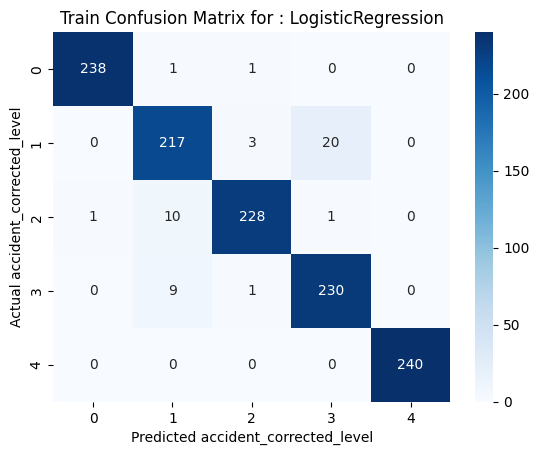

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


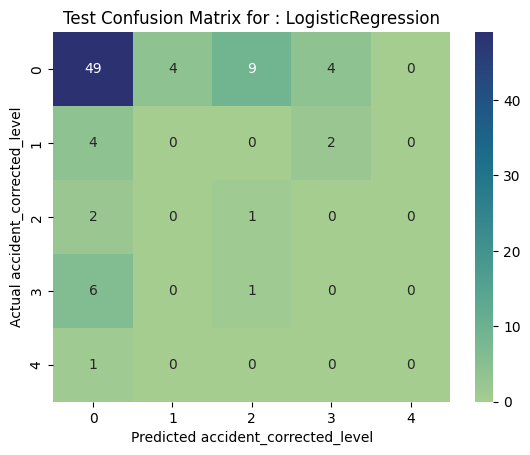

Accuracy Score with testing data - Naive Bayes: 78.31%
Accuracy Score with training data - Naive Bayes: 81.25%
Classification Metrics for Naive Bayes: 
              precision    recall  f1-score   support

           0       0.81      0.98      0.89        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.78      0.78      0.78        83
   macro avg       0.16      0.20      0.18        83
weighted avg       0.65      0.78      0.71        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


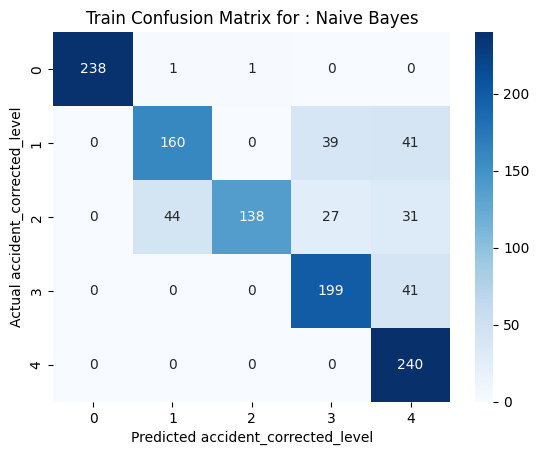

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


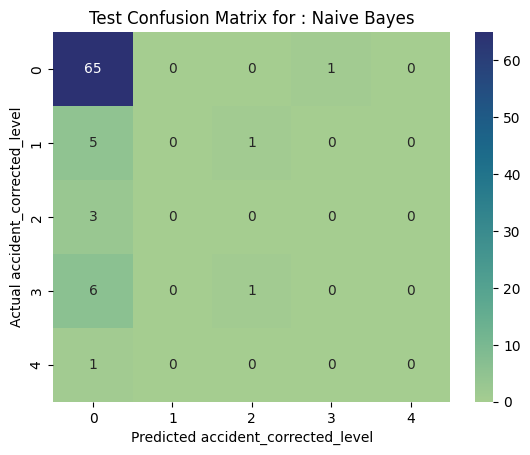

Accuracy Score with testing data - KNN: 6.02%
Accuracy Score with training data - KNN: 99.25%
Classification Metrics for KNN: 
              precision    recall  f1-score   support

           0       1.00      0.02      0.03        66
           1       0.04      0.33      0.08         6
           2       0.05      0.33      0.08         3
           3       0.08      0.14      0.11         7
           4       0.00      0.00      0.00         1

   micro avg       0.06      0.06      0.06        83
   macro avg       0.23      0.16      0.06        83
weighted avg       0.81      0.06      0.04        83



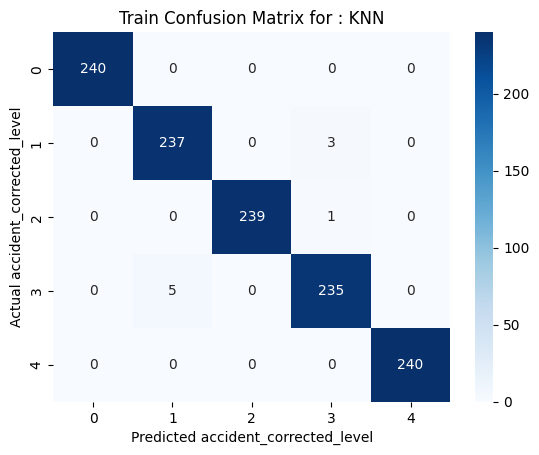

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


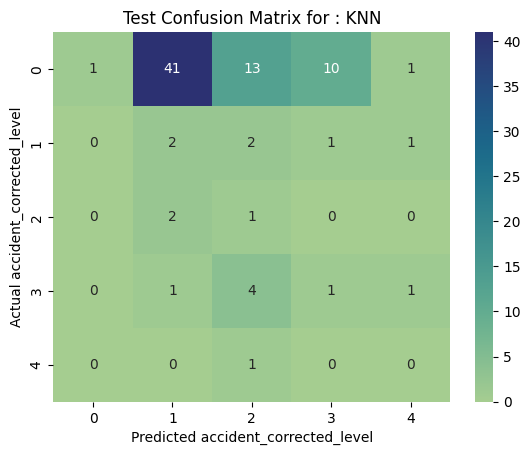

Accuracy Score with testing data - SVM: 56.63%
Accuracy Score with training data - SVM: 97.67%
Classification Metrics for SVM: 
              precision    recall  f1-score   support

           0       0.80      0.71      0.75        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.57      0.57      0.57        83
   macro avg       0.16      0.14      0.15        83
weighted avg       0.63      0.57      0.60        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


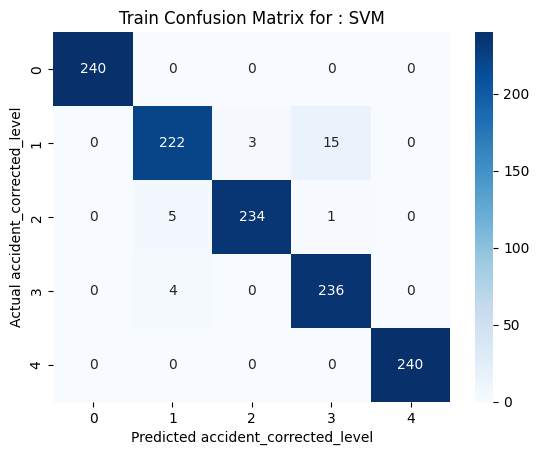

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


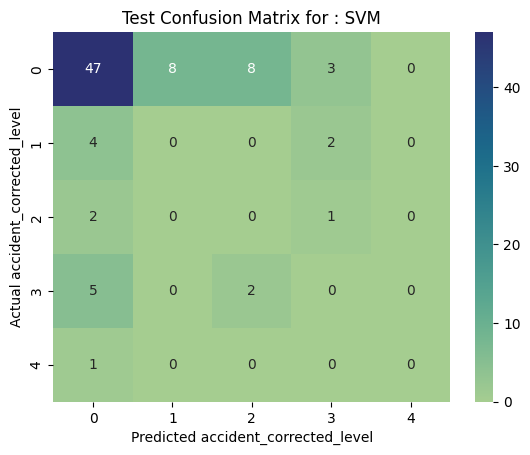

Accuracy Score with testing data - DecisionTree: 21.69%
Accuracy Score with training data - DecisionTree: 58.50%
Classification Metrics for DecisionTree: 
              precision    recall  f1-score   support

           0       0.92      0.18      0.30        66
           1       0.06      0.33      0.11         6
           2       0.07      0.67      0.12         3
           3       0.33      0.29      0.31         7
           4       0.00      0.00      0.00         1

   micro avg       0.22      0.22      0.22        83
   macro avg       0.28      0.29      0.17        83
weighted avg       0.77      0.22      0.28        83



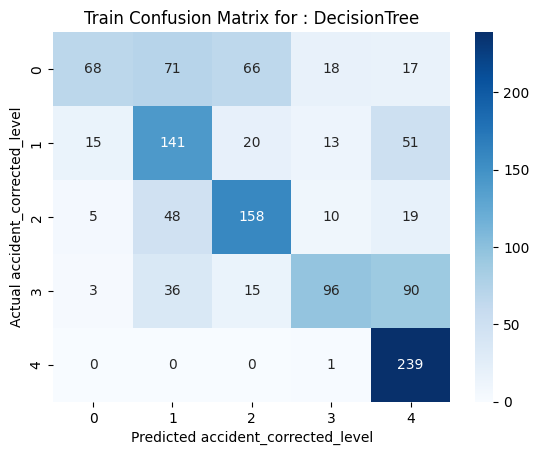

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


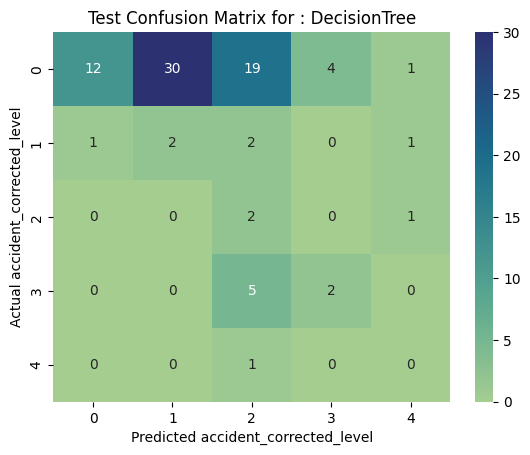

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Accuracy Score with testing data - RandomForest: 69.88%
Accuracy Score with training data - RandomForest: 82.92%
Classification Metrics for RandomForest: 
              precision    recall  f1-score   support

           0       0.81      0.85      0.83        66
           1       0.25      0.17      0.20         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.50      1.00      0.67         1

   micro avg       0.70      0.70      0.70        83
   macro avg       0.31      0.40      0.34        83
weighted avg       0.67      0.70      0.68        83



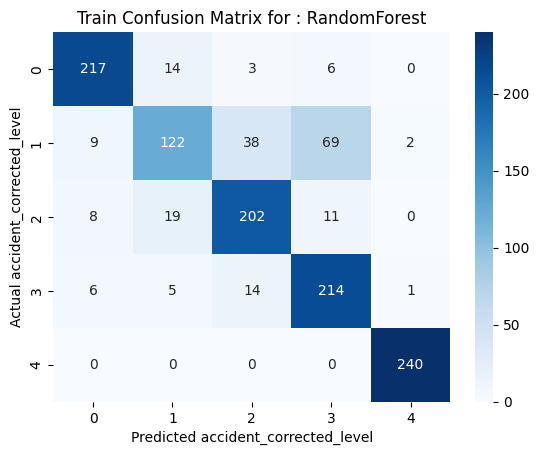

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


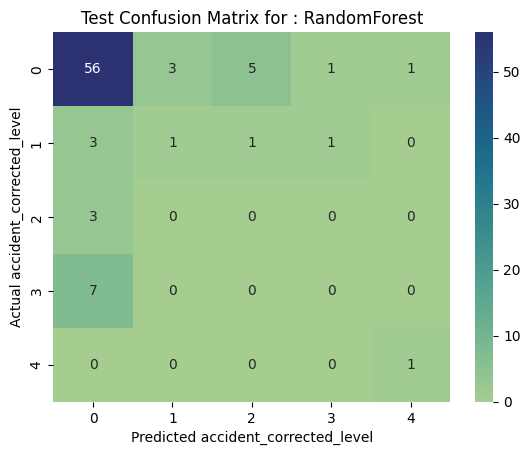

Accuracy Score with testing data - Bagging: 45.78%
Accuracy Score with training data - Bagging: 99.17%
Classification Metrics for Bagging: 
              precision    recall  f1-score   support

           0       0.75      0.58      0.65        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.46      0.46      0.46        83
   macro avg       0.15      0.12      0.13        83
weighted avg       0.59      0.46      0.52        83



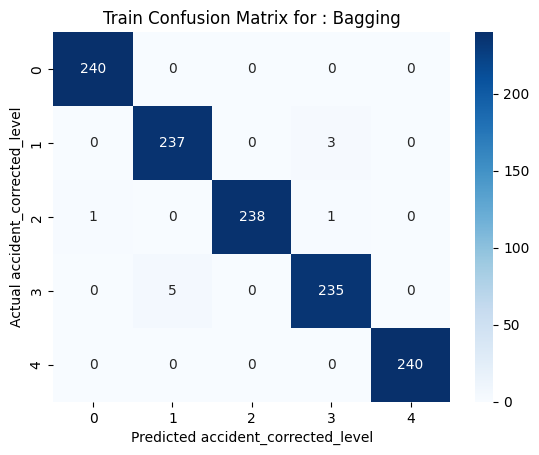

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


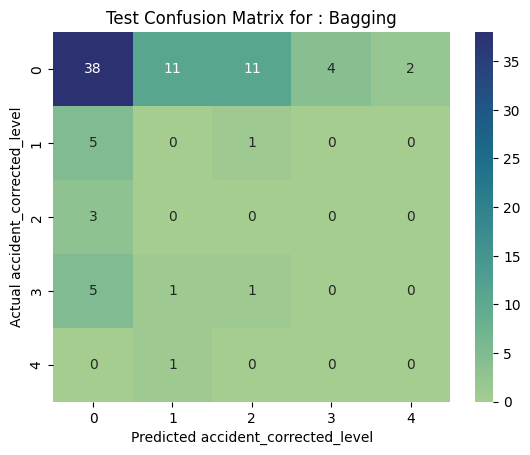

Accuracy Score with testing data - AdaBoost: 38.55%
Accuracy Score with training data - AdaBoost: 36.58%
Classification Metrics for AdaBoost: 
              precision    recall  f1-score   support

           0       0.74      0.44      0.55        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.12      0.43      0.19         7
           4       0.00      0.00      0.00         1

   micro avg       0.39      0.39      0.39        83
   macro avg       0.17      0.17      0.15        83
weighted avg       0.60      0.39      0.46        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


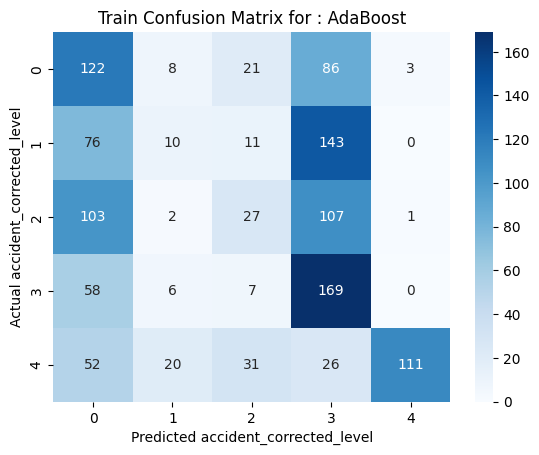

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


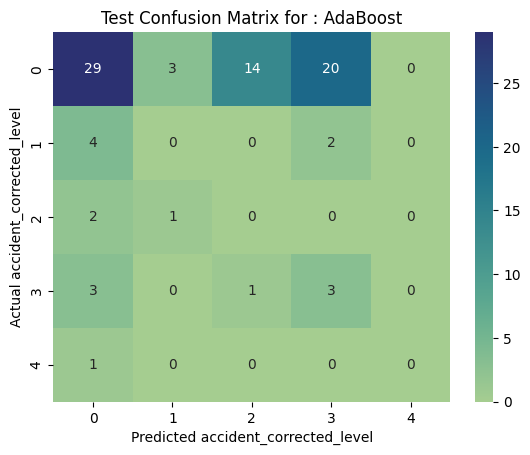

Accuracy Score with testing data - Gradient Boost: 53.01%
Accuracy Score with training data - Gradient Boost: 93.92%
Classification Metrics for Gradient Boost: 
              precision    recall  f1-score   support

           0       0.78      0.65      0.71        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       1.00      1.00      1.00         1

   micro avg       0.53      0.53      0.53        83
   macro avg       0.36      0.33      0.34        83
weighted avg       0.63      0.53      0.58        83



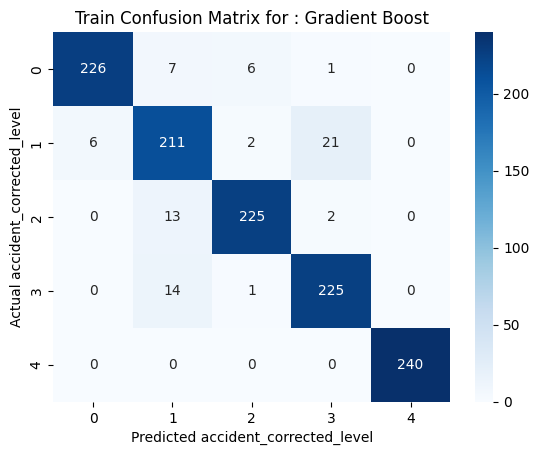

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


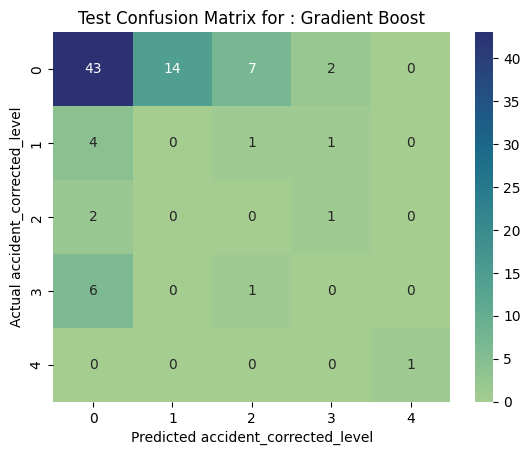

Accuracy Score with testing data - XGBoost: 57.83%
Accuracy Score with training data - XGBoost: 96.42%
Classification Metrics for XGBoost: 
              precision    recall  f1-score   support

           0       0.81      0.71      0.76        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.12      0.14      0.13         7
           4       0.00      0.00      0.00         1

   micro avg       0.58      0.58      0.58        83
   macro avg       0.19      0.17      0.18        83
weighted avg       0.65      0.58      0.61        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


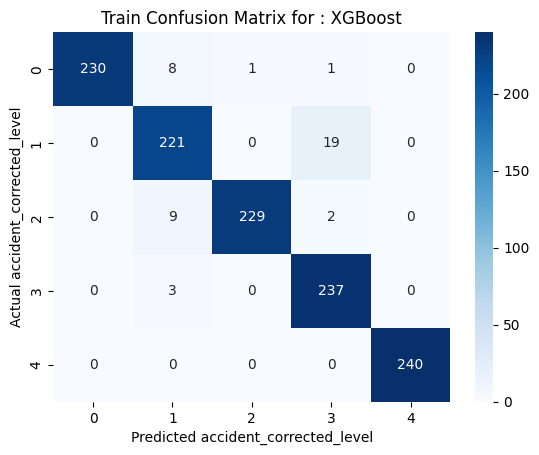

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


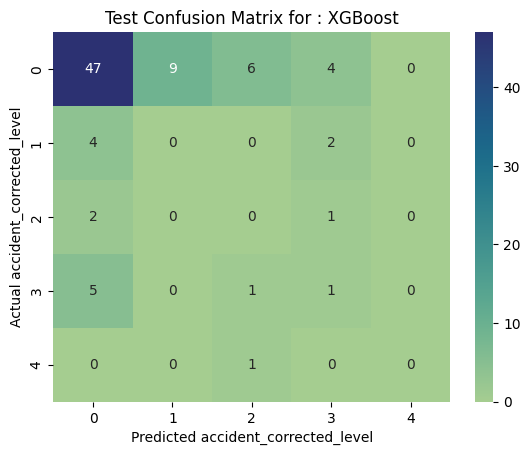

,Embedding,model,train_score,test_score
LogisticRegression,CountVectorizer,LogisticRegression(),0.960833,0.60241
Naive Bayes,CountVectorizer,GaussianNB(),0.8125,0.783133
KNN,CountVectorizer,"KNeighborsClassifier(algorithm='kd_tree', weig...",0.9925,0.060241
SVM,CountVectorizer,"SVC(C=10, gamma=0.1, kernel='linear', probabil...",0.976667,0.566265
DecisionTree,CountVectorizer,"DecisionTreeClassifier(criterion='entropy', ma...",0.585,0.216867
RandomForest,CountVectorizer,"(DecisionTreeClassifier(max_depth=5, max_featu...",0.829167,0.698795
Bagging,CountVectorizer,(DecisionTreeClassifier(random_state=153431959...,0.991667,0.457831
AdaBoost,CountVectorizer,"(DecisionTreeClassifier(max_depth=1, random_st...",0.365833,0.385542
Gradient Boost,CountVectorizer,([DecisionTreeRegressor(criterion='friedman_ms...,0.939167,0.53012
XGBoost,CountVectorizer,"XGBClassifier(base_score=None, booster=None, c...",0.964167,0.578313


In [ ]:
# Fit the models using CountVectorizer embeddings on balanced data set
print ("Fitting ML classifiers using CountVectorizer embeddings:")
X_train, X_test, y_train, y_test = apply_train_test_split(X_Cvect, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_Cvect = fit_models_balanced('CountVectorizer',models, X_resampled, y_resampled, X_test, y_test)

result_df = {}
result_df = pd.DataFrame(fitted_models_Cvect)
result_Cvect_bal = result_df.transpose()

result_Cvect_bal

Fitting ML classifiers using FastText embeddings:
Accuracy Score with testing data - LogisticRegression: 9.64%
Accuracy Score with training data - LogisticRegression: 28.08%
Classification Metrics for LogisticRegression: 
              precision    recall  f1-score   support

           0       1.00      0.08      0.14        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.11      0.43      0.17         7
           4       0.00      0.00      0.00         1

   micro avg       0.10      0.10      0.10        83
   macro avg       0.22      0.10      0.06        83
weighted avg       0.80      0.10      0.13        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


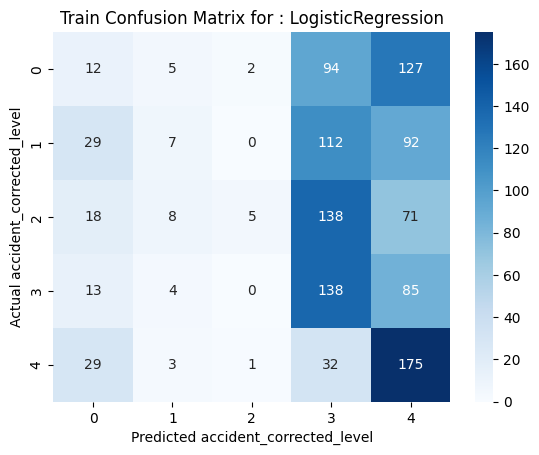

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


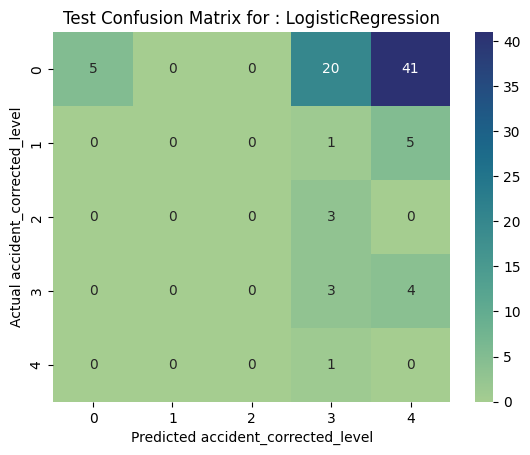

Accuracy Score with testing data - Naive Bayes: 16.87%
Accuracy Score with training data - Naive Bayes: 33.08%
Classification Metrics for Naive Bayes: 
              precision    recall  f1-score   support

           0       0.71      0.18      0.29        66
           1       0.00      0.00      0.00         6
           2       0.10      0.33      0.15         3
           3       0.06      0.14      0.08         7
           4       0.00      0.00      0.00         1

   micro avg       0.17      0.17      0.17        83
   macro avg       0.17      0.13      0.11        83
weighted avg       0.57      0.17      0.24        83



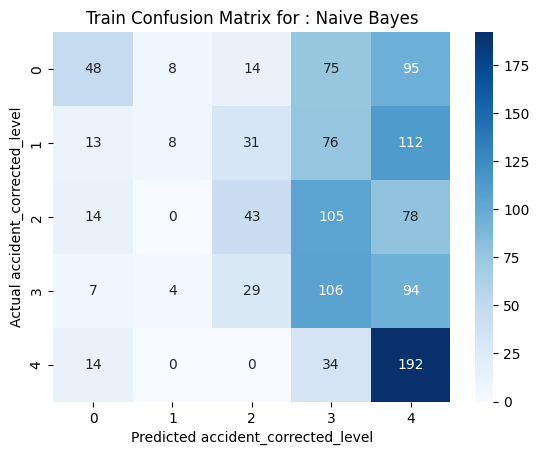

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


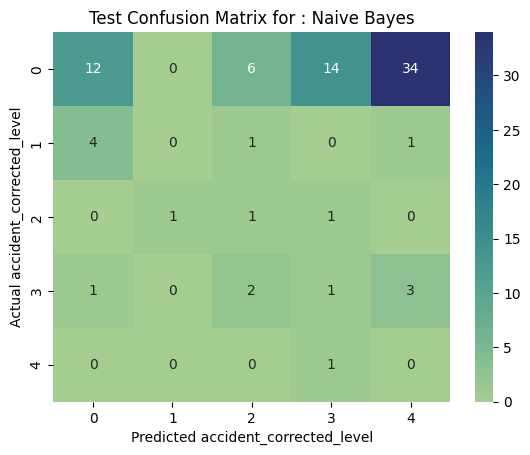

Accuracy Score with testing data - KNN: 18.07%
Accuracy Score with training data - KNN: 99.92%
Classification Metrics for KNN: 
              precision    recall  f1-score   support

           0       0.73      0.17      0.27        66
           1       0.14      0.33      0.20         6
           2       0.00      0.00      0.00         3
           3       0.05      0.14      0.07         7
           4       0.05      1.00      0.09         1

   micro avg       0.18      0.18      0.18        83
   macro avg       0.19      0.33      0.13        83
weighted avg       0.60      0.18      0.24        83



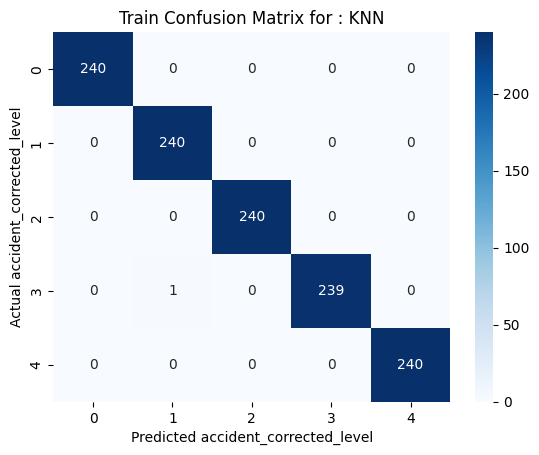

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


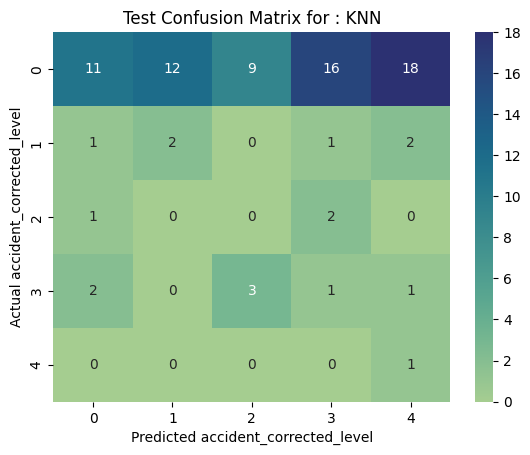

Accuracy Score with testing data - SVM: 3.61%
Accuracy Score with training data - SVM: 28.83%
Classification Metrics for SVM: 
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.11      0.43      0.17         7
           4       0.00      0.00      0.00         1

   micro avg       0.04      0.04      0.04        83
   macro avg       0.02      0.09      0.03        83
weighted avg       0.01      0.04      0.01        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


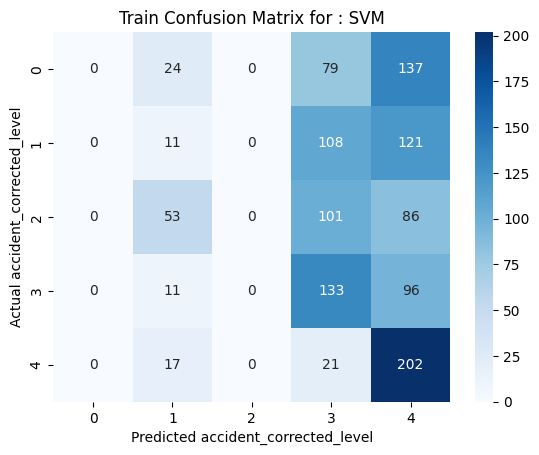

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


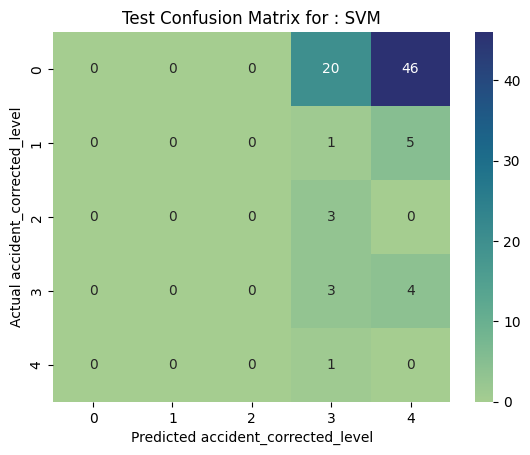

Accuracy Score with testing data - DecisionTree: 27.71%
Accuracy Score with training data - DecisionTree: 69.50%
Classification Metrics for DecisionTree: 
              precision    recall  f1-score   support

           0       0.83      0.29      0.43        66
           1       0.21      0.50      0.30         6
           2       0.05      0.33      0.08         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.28      0.28      0.28        83
   macro avg       0.22      0.22      0.16        83
weighted avg       0.67      0.28      0.36        83



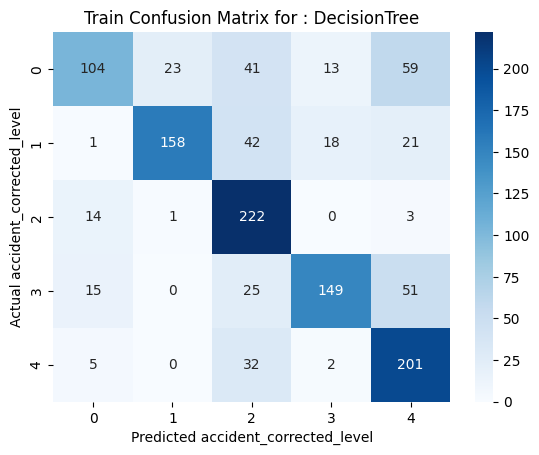

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


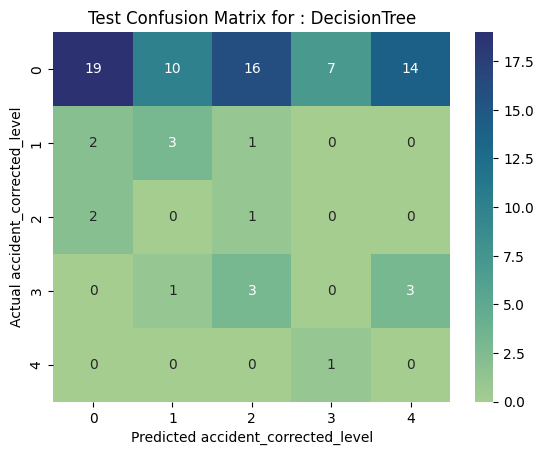

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Accuracy Score with testing data - RandomForest: 20.48%
Accuracy Score with training data - RandomForest: 65.08%
Classification Metrics for RandomForest: 
              precision    recall  f1-score   support

           0       0.74      0.21      0.33        66
           1       0.08      0.17      0.11         6
           2       0.08      0.33      0.13         3
           3       0.12      0.14      0.13         7
           4       0.00      0.00      0.00         1

   micro avg       0.20      0.20      0.20        83
   macro avg       0.20      0.17      0.14        83
weighted avg       0.61      0.20      0.29        83



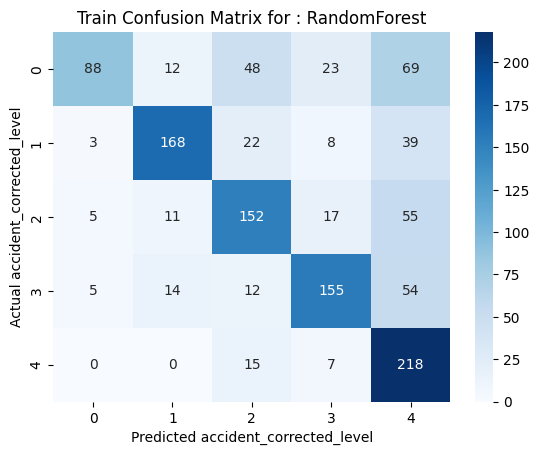

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


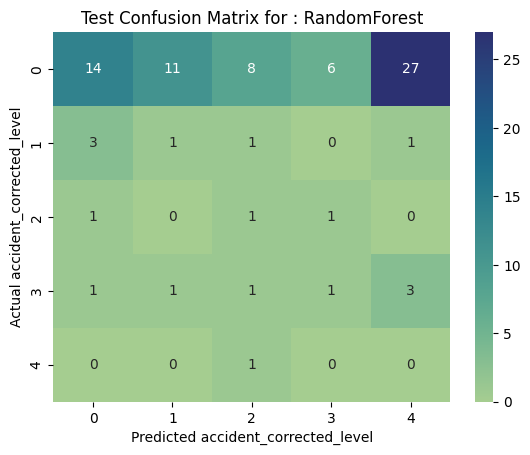

Accuracy Score with testing data - Bagging: 43.37%
Accuracy Score with training data - Bagging: 99.67%
Classification Metrics for Bagging: 
              precision    recall  f1-score   support

           0       0.82      0.48      0.61        66
           1       0.17      0.33      0.22         6
           2       0.08      0.33      0.12         3
           3       0.00      0.00      0.00         7
           4       0.09      1.00      0.17         1

   micro avg       0.43      0.43      0.43        83
   macro avg       0.23      0.43      0.22        83
weighted avg       0.67      0.43      0.51        83



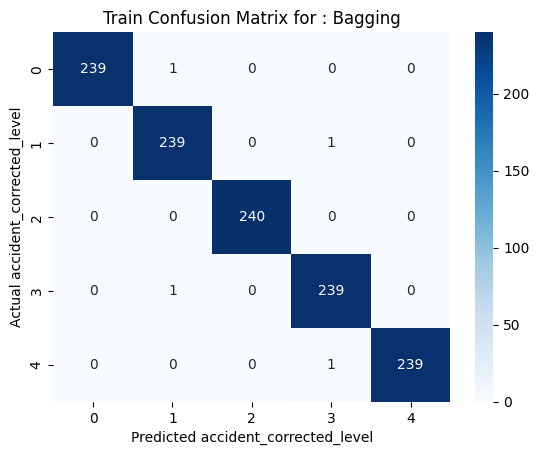

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


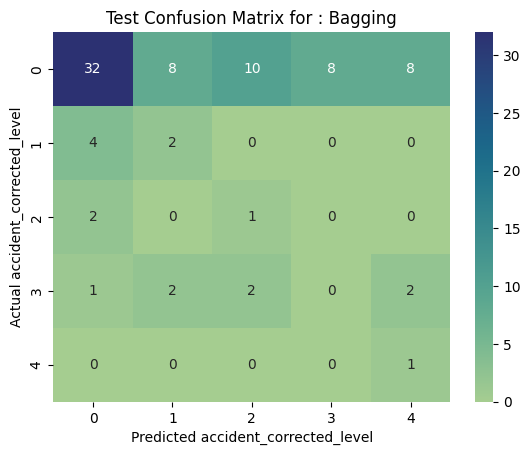

Accuracy Score with testing data - AdaBoost: 31.33%
Accuracy Score with training data - AdaBoost: 47.92%
Classification Metrics for AdaBoost: 
              precision    recall  f1-score   support

           0       0.77      0.35      0.48        66
           1       0.11      0.17      0.13         6
           2       0.08      0.67      0.14         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.31      0.31      0.31        83
   macro avg       0.19      0.24      0.15        83
weighted avg       0.62      0.31      0.40        83



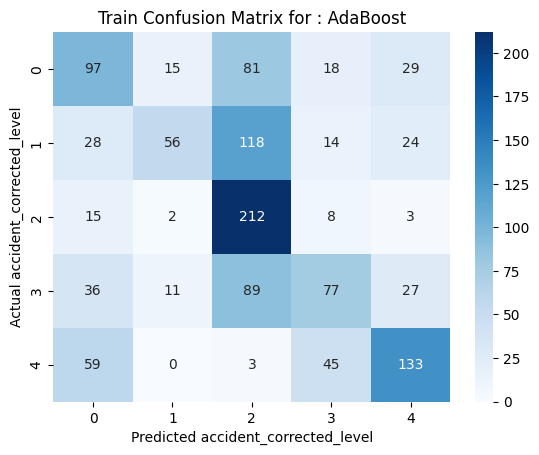

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


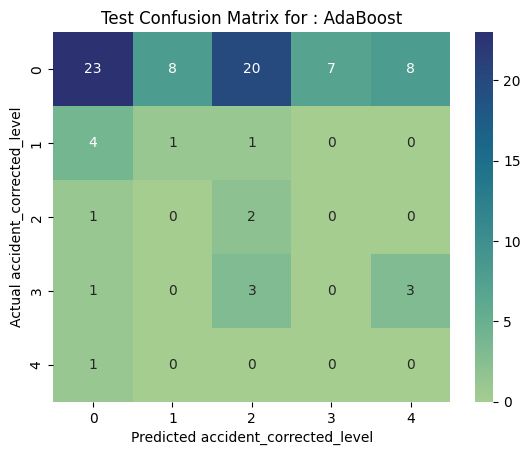

Accuracy Score with testing data - Gradient Boost: 38.55%
Accuracy Score with training data - Gradient Boost: 93.33%
Classification Metrics for Gradient Boost: 
              precision    recall  f1-score   support

           0       0.84      0.39      0.54        66
           1       0.20      0.67      0.31         6
           2       0.10      0.33      0.15         3
           3       0.00      0.00      0.00         7
           4       0.07      1.00      0.12         1

   micro avg       0.39      0.39      0.39        83
   macro avg       0.24      0.48      0.22        83
weighted avg       0.69      0.39      0.46        83



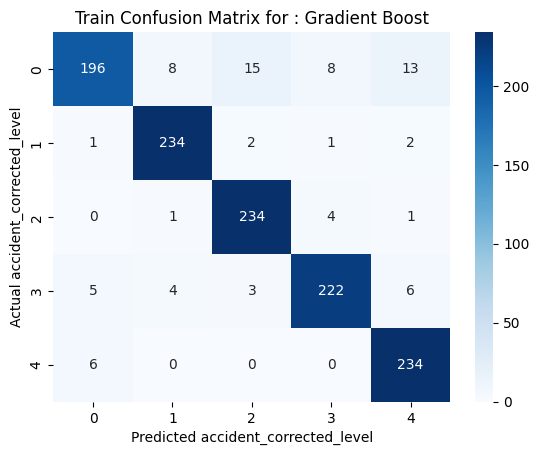

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


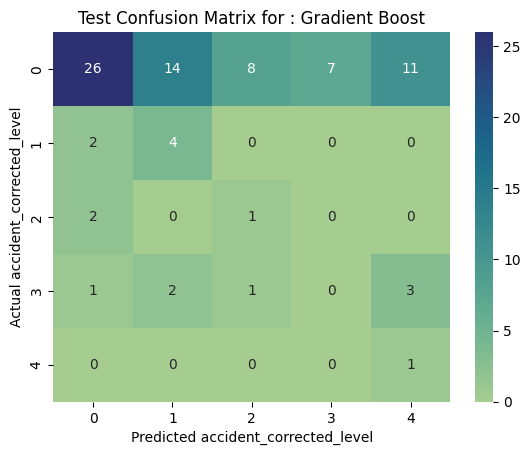

Accuracy Score with testing data - XGBoost: 40.96%
Accuracy Score with training data - XGBoost: 97.75%
Classification Metrics for XGBoost: 
              precision    recall  f1-score   support

           0       0.80      0.42      0.55        66
           1       0.29      0.67      0.40         6
           2       0.07      0.33      0.11         3
           3       0.00      0.00      0.00         7
           4       0.09      1.00      0.17         1

   micro avg       0.41      0.41      0.41        83
   macro avg       0.25      0.48      0.25        83
weighted avg       0.66      0.41      0.48        83



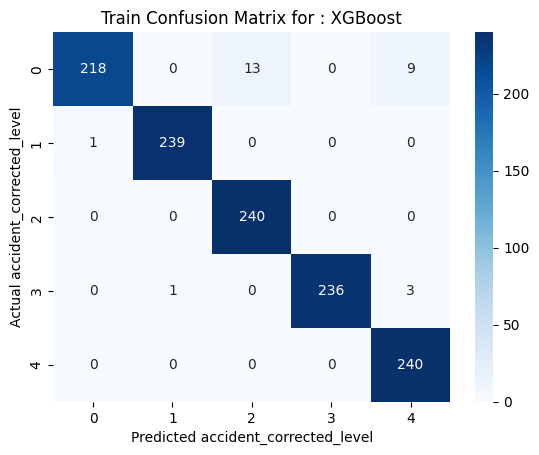

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


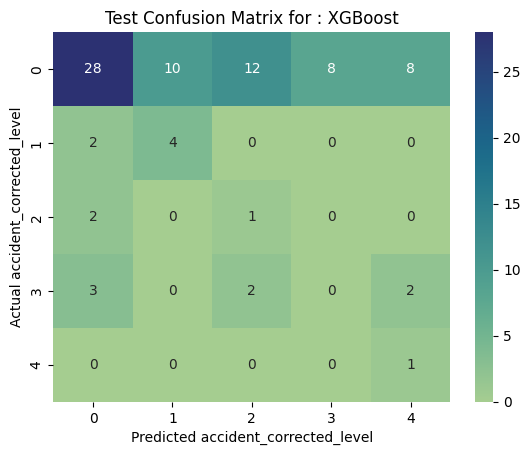

,Embedding,model,train_score,test_score
LogisticRegression,FastText,LogisticRegression(),0.280833,0.096386
Naive Bayes,FastText,GaussianNB(),0.330833,0.168675
KNN,FastText,"KNeighborsClassifier(algorithm='kd_tree', weig...",0.999167,0.180723
SVM,FastText,"SVC(C=10, gamma=0.1, kernel='linear', probabil...",0.288333,0.036145
DecisionTree,FastText,"DecisionTreeClassifier(criterion='entropy', ma...",0.695,0.277108
RandomForest,FastText,"(DecisionTreeClassifier(max_depth=5, max_featu...",0.650833,0.204819
Bagging,FastText,(DecisionTreeClassifier(random_state=268755104...,0.996667,0.433735
AdaBoost,FastText,"(DecisionTreeClassifier(max_depth=1, random_st...",0.479167,0.313253
Gradient Boost,FastText,([DecisionTreeRegressor(criterion='friedman_ms...,0.933333,0.385542
XGBoost,FastText,"XGBClassifier(base_score=None, booster=None, c...",0.9775,0.409639


In [ ]:
# Fit the models using FastText embeddings on balanced dataset
print ("Fitting ML classifiers using FastText embeddings:")
X_train, X_test, y_train, y_test = apply_train_test_split(X_fasttext, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_fasttext = fit_models_balanced('FastText',models, X_resampled, y_resampled, X_test, y_test)

result_df = {}
result_df = pd.DataFrame(fitted_models_fasttext)
result_ft_bal = result_df.transpose()

result_ft_bal

Fitting ML classifiers using Word2Vec embeddings:
Accuracy Score with testing data - LogisticRegression: 8.43%
Accuracy Score with training data - LogisticRegression: 31.08%
Classification Metrics for LogisticRegression: 
              precision    recall  f1-score   support

           0       1.00      0.03      0.06        66
           1       0.08      0.50      0.14         6
           2       0.00      0.00      0.00         3
           3       0.33      0.14      0.20         7
           4       0.03      1.00      0.05         1

   micro avg       0.08      0.08      0.08        83
   macro avg       0.29      0.33      0.09        83
weighted avg       0.83      0.08      0.07        83



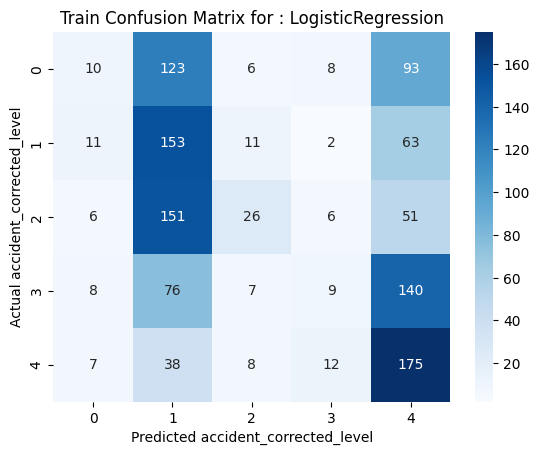

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


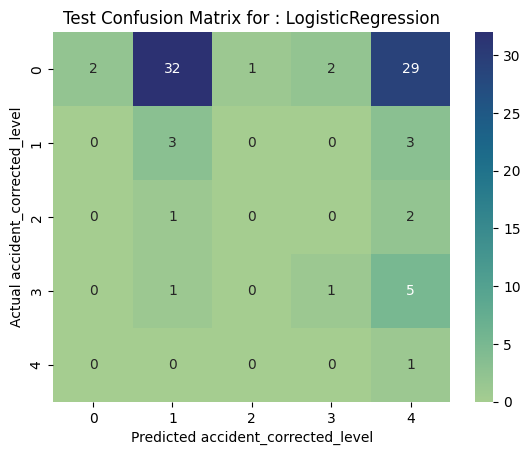

Accuracy Score with testing data - Naive Bayes: 6.02%
Accuracy Score with training data - Naive Bayes: 32.58%
Classification Metrics for Naive Bayes: 
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        66
           1       0.04      0.17      0.06         6
           2       0.08      0.33      0.12         3
           3       0.11      0.29      0.16         7
           4       0.04      1.00      0.07         1

   micro avg       0.06      0.06      0.06        83
   macro avg       0.05      0.36      0.08        83
weighted avg       0.02      0.06      0.02        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


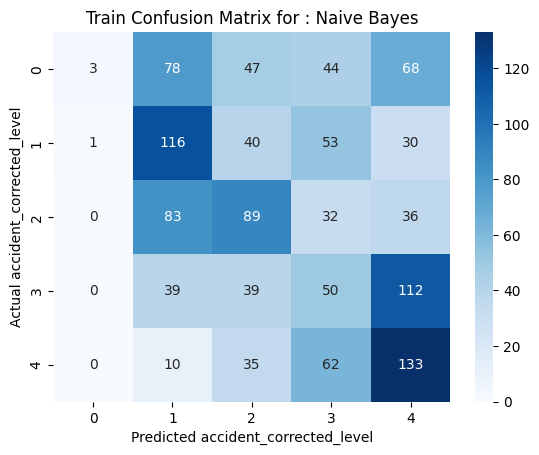

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


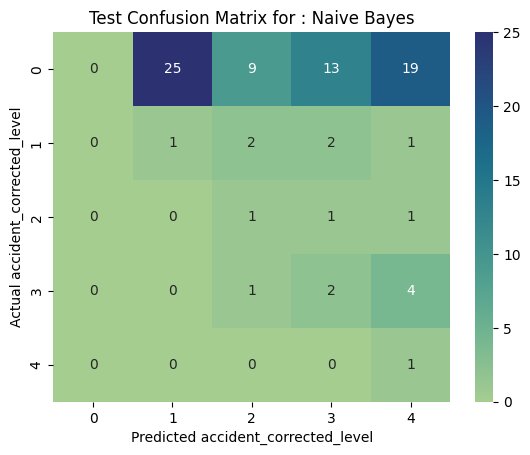

Accuracy Score with testing data - KNN: 6.02%
Accuracy Score with training data - KNN: 99.92%
Classification Metrics for KNN: 
              precision    recall  f1-score   support

           0       1.00      0.03      0.06        66
           1       0.07      0.17      0.10         6
           2       0.04      0.33      0.07         3
           3       0.00      0.00      0.00         7
           4       0.03      1.00      0.06         1

   micro avg       0.06      0.06      0.06        83
   macro avg       0.23      0.31      0.06        83
weighted avg       0.80      0.06      0.06        83



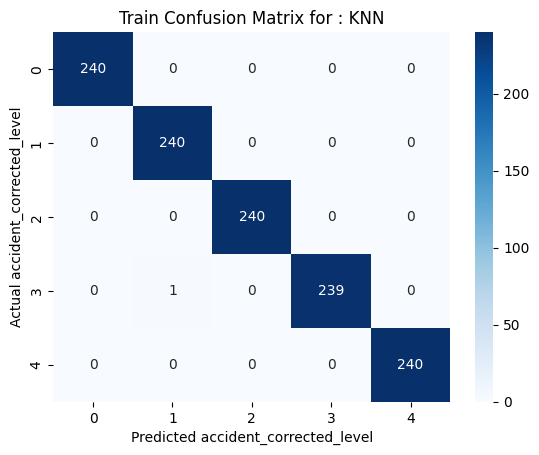

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


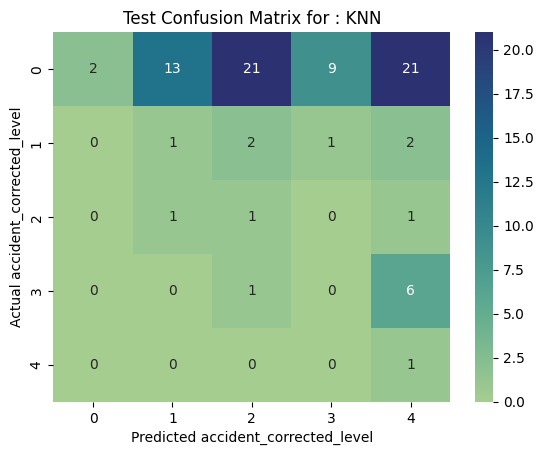

Accuracy Score with testing data - SVM: 7.23%
Accuracy Score with training data - SVM: 27.83%
Classification Metrics for SVM: 
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        66
           1       0.08      0.50      0.14         6
           2       0.00      0.00      0.00         3
           3       0.20      0.29      0.24         7
           4       0.03      1.00      0.06         1

   micro avg       0.07      0.07      0.07        83
   macro avg       0.06      0.36      0.09        83
weighted avg       0.02      0.07      0.03        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


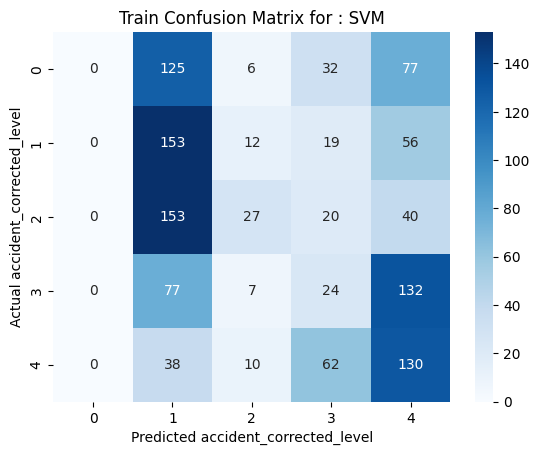

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


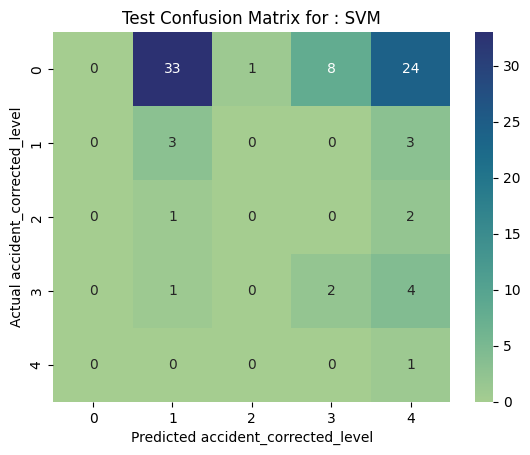

Accuracy Score with testing data - DecisionTree: 33.73%
Accuracy Score with training data - DecisionTree: 82.67%
Classification Metrics for DecisionTree: 
              precision    recall  f1-score   support

           0       0.82      0.35      0.49        66
           1       0.12      0.33      0.18         6
           2       0.00      0.00      0.00         3
           3       0.15      0.29      0.20         7
           4       0.17      1.00      0.29         1

   micro avg       0.34      0.34      0.34        83
   macro avg       0.25      0.39      0.23        83
weighted avg       0.68      0.34      0.42        83



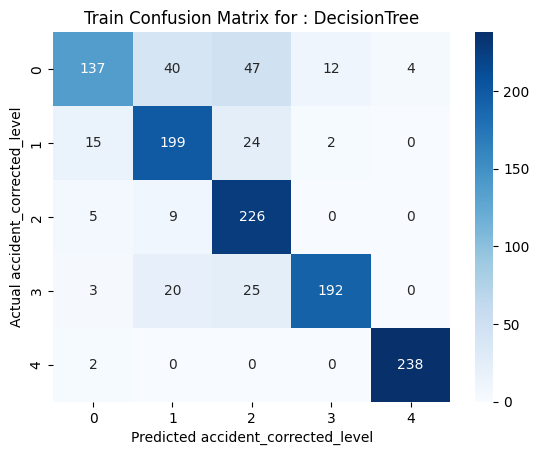

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


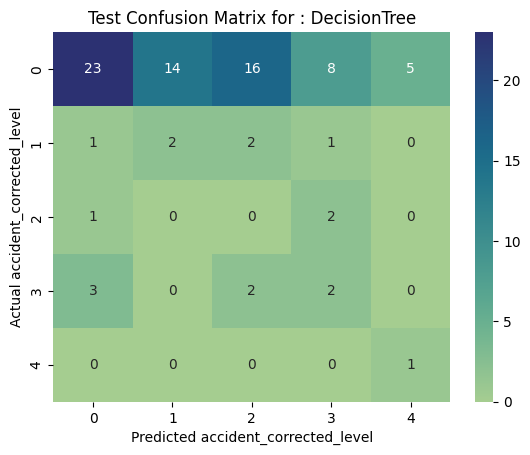

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Accuracy Score with testing data - RandomForest: 44.58%
Accuracy Score with training data - RandomForest: 95.33%
Classification Metrics for RandomForest: 
              precision    recall  f1-score   support

           0       0.79      0.52      0.62        66
           1       0.07      0.17      0.10         6
           2       0.00      0.00      0.00         3
           3       0.17      0.29      0.21         7
           4       0.00      0.00      0.00         1

   micro avg       0.45      0.45      0.45        83
   macro avg       0.21      0.19      0.19        83
weighted avg       0.65      0.45      0.52        83



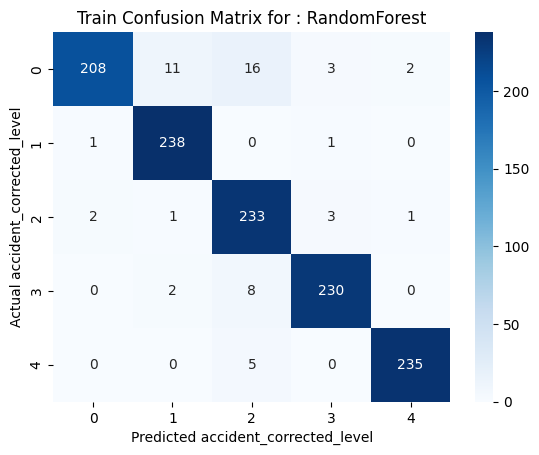

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


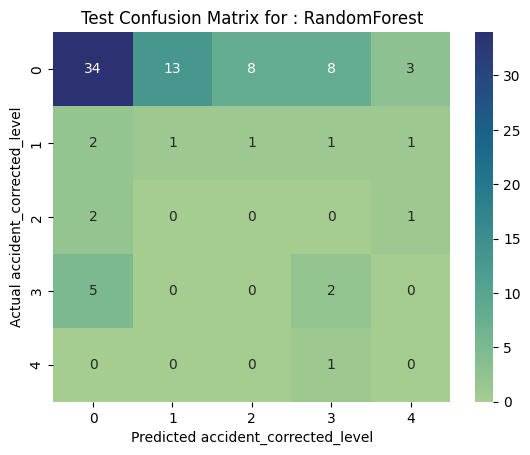

Accuracy Score with testing data - Bagging: 59.04%
Accuracy Score with training data - Bagging: 99.92%
Classification Metrics for Bagging: 
              precision    recall  f1-score   support

           0       0.80      0.68      0.74        66
           1       0.22      0.33      0.27         6
           2       0.00      0.00      0.00         3
           3       0.14      0.14      0.14         7
           4       0.25      1.00      0.40         1

   micro avg       0.59      0.59      0.59        83
   macro avg       0.28      0.43      0.31        83
weighted avg       0.67      0.59      0.62        83



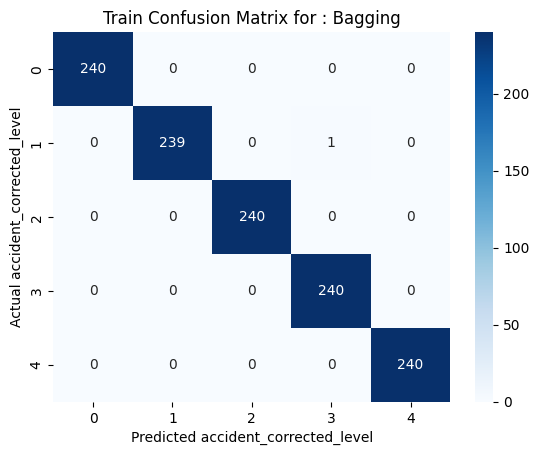

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


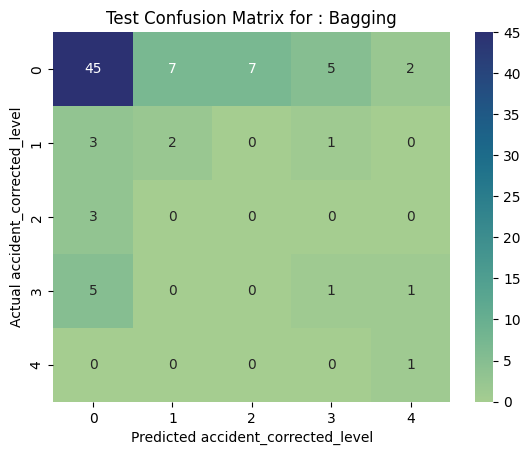

Accuracy Score with testing data - AdaBoost: 48.19%
Accuracy Score with training data - AdaBoost: 52.25%
Classification Metrics for AdaBoost: 
              precision    recall  f1-score   support

           0       0.80      0.55      0.65        66
           1       0.12      0.33      0.17         6
           2       0.08      0.33      0.13         3
           3       0.11      0.14      0.12         7
           4       0.00      0.00      0.00         1

   micro avg       0.48      0.48      0.48        83
   macro avg       0.22      0.27      0.22        83
weighted avg       0.66      0.48      0.54        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


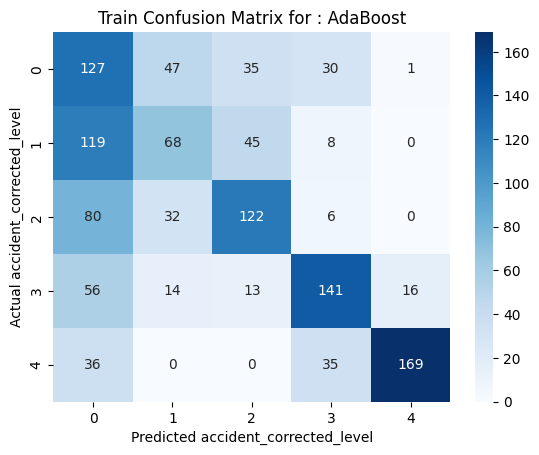

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


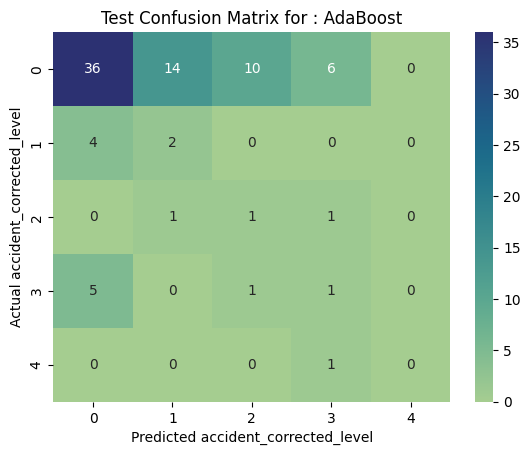

Accuracy Score with testing data - Gradient Boost: 63.86%
Accuracy Score with training data - Gradient Boost: 99.83%
Classification Metrics for Gradient Boost: 
              precision    recall  f1-score   support

           0       0.84      0.74      0.79        66
           1       0.25      0.17      0.20         6
           2       0.09      0.33      0.14         3
           3       0.25      0.14      0.18         7
           4       0.17      1.00      0.29         1

   micro avg       0.64      0.64      0.64        83
   macro avg       0.32      0.48      0.32        83
weighted avg       0.72      0.64      0.67        83



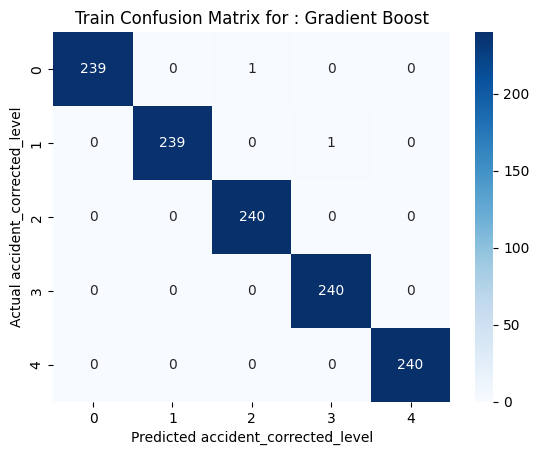

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


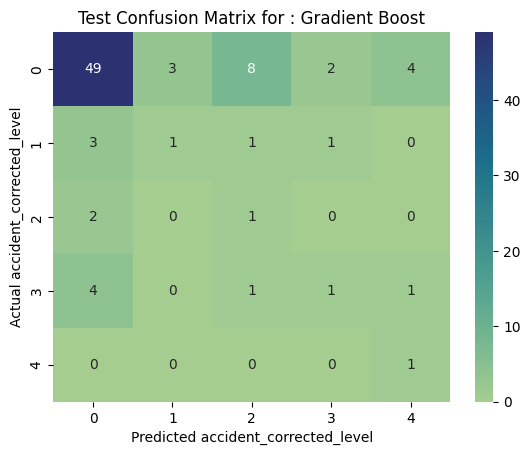

Accuracy Score with testing data - XGBoost: 67.47%
Accuracy Score with training data - XGBoost: 99.92%
Classification Metrics for XGBoost: 
              precision    recall  f1-score   support

           0       0.83      0.79      0.81        66
           1       0.12      0.17      0.14         6
           2       0.00      0.00      0.00         3
           3       0.50      0.29      0.36         7
           4       0.33      1.00      0.50         1

   micro avg       0.67      0.67      0.67        83
   macro avg       0.36      0.45      0.36        83
weighted avg       0.71      0.67      0.69        83



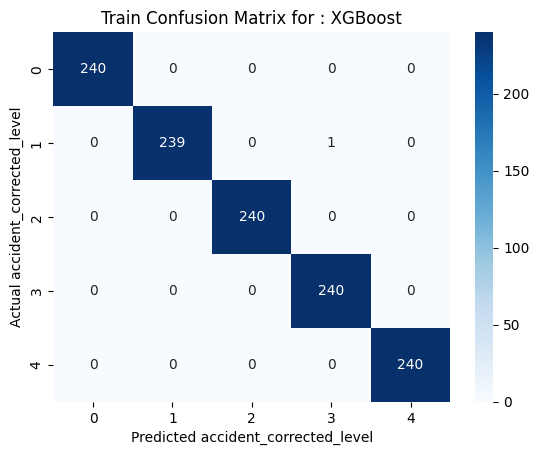

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


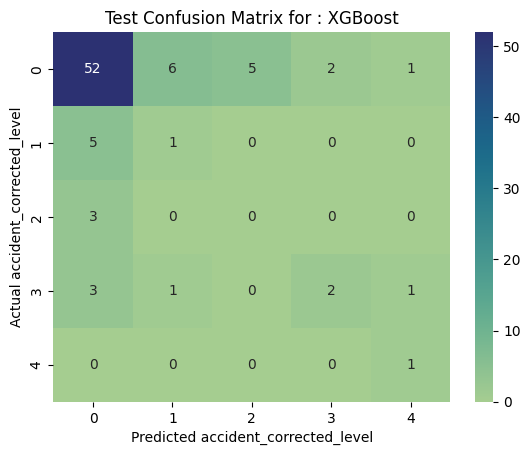

,Embedding,model,train_score,test_score
LogisticRegression,Word2Vec,LogisticRegression(),0.310833,0.084337
Naive Bayes,Word2Vec,GaussianNB(),0.325833,0.060241
KNN,Word2Vec,"KNeighborsClassifier(algorithm='kd_tree', weig...",0.999167,0.060241
SVM,Word2Vec,"SVC(C=10, gamma=0.1, kernel='linear', probabil...",0.278333,0.072289
DecisionTree,Word2Vec,"DecisionTreeClassifier(criterion='entropy', ma...",0.826667,0.337349
RandomForest,Word2Vec,"(DecisionTreeClassifier(max_depth=5, max_featu...",0.953333,0.445783
Bagging,Word2Vec,(DecisionTreeClassifier(random_state=123095043...,0.999167,0.590361
AdaBoost,Word2Vec,"(DecisionTreeClassifier(max_depth=1, random_st...",0.5225,0.481928
Gradient Boost,Word2Vec,([DecisionTreeRegressor(criterion='friedman_ms...,0.998333,0.638554
XGBoost,Word2Vec,"XGBClassifier(base_score=None, booster=None, c...",0.999167,0.674699


In [ ]:
# Fit the models using Word2Vec embeddings on balanced dataset
print ("Fitting ML classifiers using Word2Vec embeddings:")
X_train, X_test, y_train, y_test = apply_train_test_split(X_Word2Vec, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_Word2Vec = fit_models_balanced('Word2Vec',models, X_resampled, y_resampled, X_test, y_test)

result_df = {}
result_df = pd.DataFrame(fitted_models_Word2Vec)
result_wv_bal = result_df.transpose()

result_wv_bal

Fitting ML classifiers using GloVe embeddings:
Accuracy Score with testing data - LogisticRegression: 48.19%
Accuracy Score with training data - LogisticRegression: 89.08%
Classification Metrics for LogisticRegression: 
              precision    recall  f1-score   support

           0       0.81      0.53      0.64        66
           1       0.25      0.17      0.20         6
           2       0.07      0.33      0.12         3
           3       0.18      0.43      0.25         7
           4       0.00      0.00      0.00         1

   micro avg       0.48      0.48      0.48        83
   macro avg       0.26      0.29      0.24        83
weighted avg       0.68      0.48      0.55        83



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


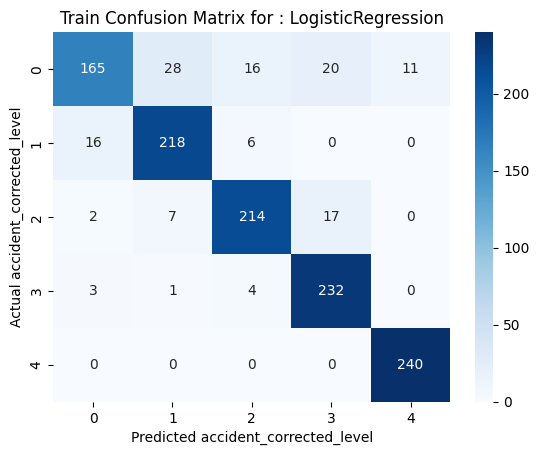

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


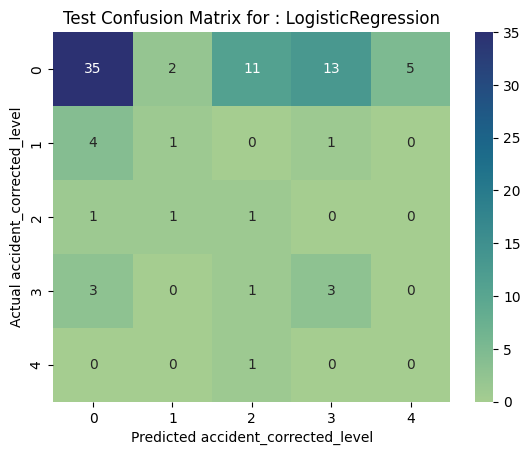

Accuracy Score with testing data - Naive Bayes: 59.04%
Accuracy Score with training data - Naive Bayes: 79.17%
Classification Metrics for Naive Bayes: 
              precision    recall  f1-score   support

           0       0.79      0.70      0.74        66
           1       0.11      0.17      0.13         6
           2       0.12      0.33      0.18         3
           3       0.14      0.14      0.14         7
           4       0.00      0.00      0.00         1

   micro avg       0.59      0.59      0.59        83
   macro avg       0.23      0.27      0.24        83
weighted avg       0.66      0.59      0.62        83



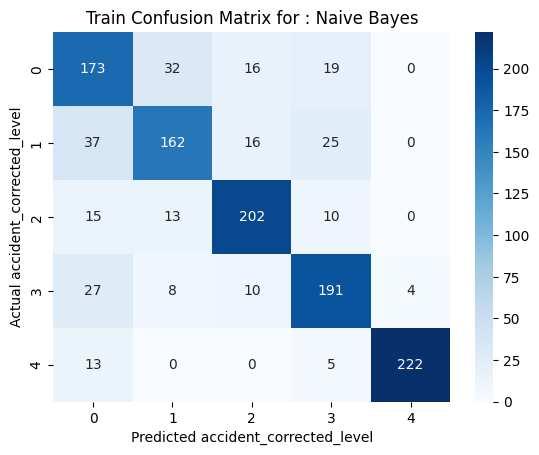

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


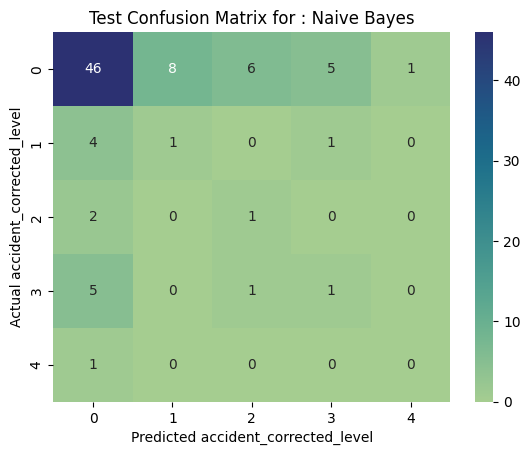

Accuracy Score with testing data - KNN: 18.07%
Accuracy Score with training data - KNN: 99.92%
Classification Metrics for KNN: 
              precision    recall  f1-score   support

           0       1.00      0.15      0.26        66
           1       0.11      0.33      0.16         6
           2       0.08      0.33      0.12         3
           3       0.04      0.14      0.06         7
           4       0.06      1.00      0.12         1

   micro avg       0.18      0.18      0.18        83
   macro avg       0.26      0.39      0.15        83
weighted avg       0.81      0.18      0.23        83



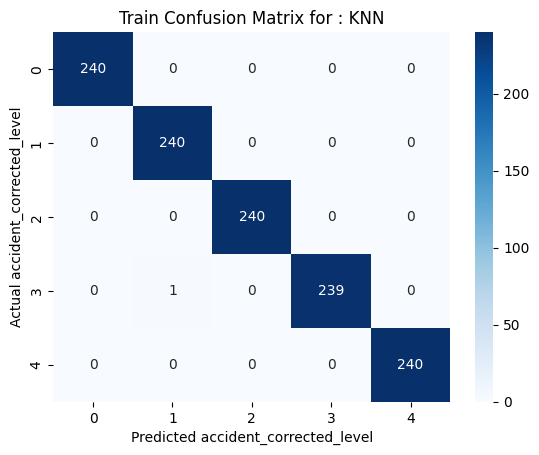

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


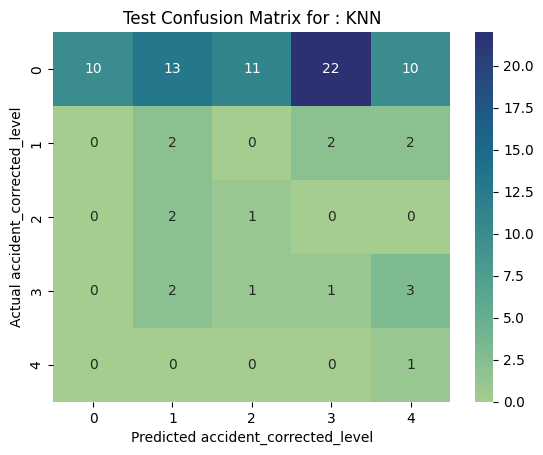

Accuracy Score with testing data - SVM: 54.22%
Accuracy Score with training data - SVM: 97.58%
Classification Metrics for SVM: 
              precision    recall  f1-score   support

           0       0.84      0.62      0.71        66
           1       0.10      0.17      0.12         6
           2       0.00      0.00      0.00         3
           3       0.25      0.43      0.32         7
           4       0.00      0.00      0.00         1

   micro avg       0.54      0.54      0.54        83
   macro avg       0.24      0.24      0.23        83
weighted avg       0.69      0.54      0.60        83



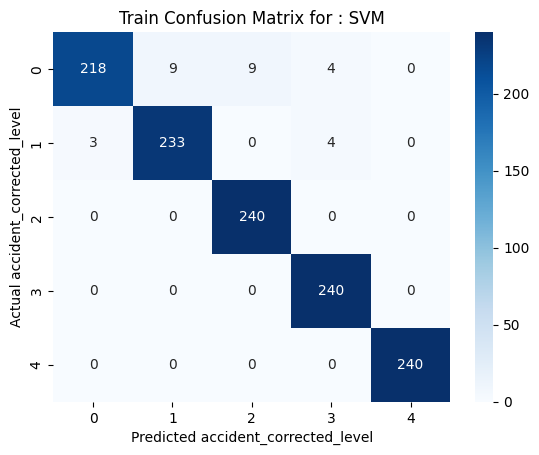

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


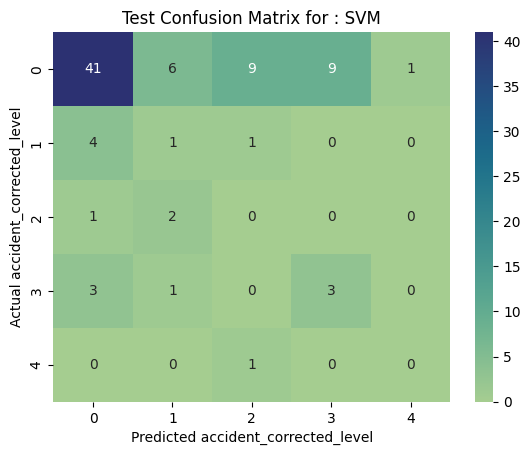

Accuracy Score with testing data - DecisionTree: 40.96%
Accuracy Score with training data - DecisionTree: 89.33%
Classification Metrics for DecisionTree: 
              precision    recall  f1-score   support

           0       0.82      0.47      0.60        66
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3
           3       0.18      0.43      0.25         7
           4       0.00      0.00      0.00         1

   micro avg       0.41      0.41      0.41        83
   macro avg       0.20      0.18      0.17        83
weighted avg       0.66      0.41      0.50        83



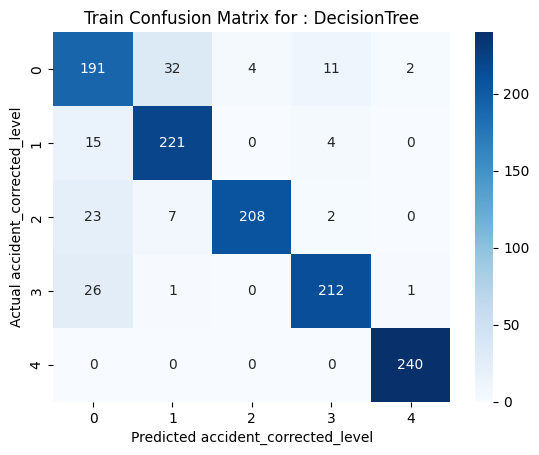

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


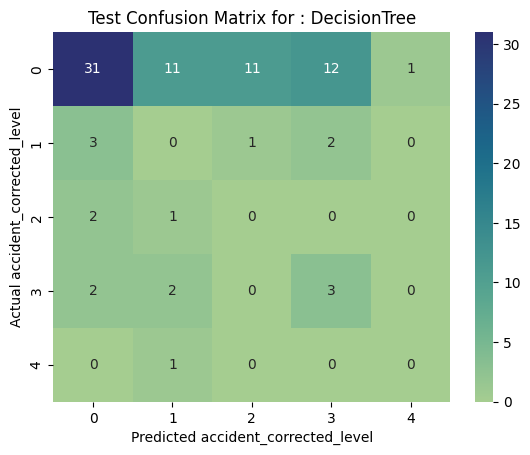

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Accuracy Score with testing data - RandomForest: 60.24%
Accuracy Score with training data - RandomForest: 98.58%
Classification Metrics for RandomForest: 
              precision    recall  f1-score   support

           0       0.84      0.71      0.77        66
           1       0.12      0.17      0.14         6
           2       0.00      0.00      0.00         3
           3       0.20      0.29      0.24         7
           4       0.00      0.00      0.00         1

   micro avg       0.60      0.60      0.60        83
   macro avg       0.23      0.23      0.23        83
weighted avg       0.69      0.60      0.64        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


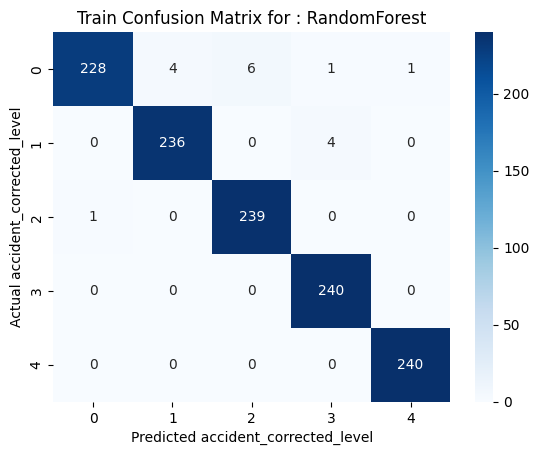

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


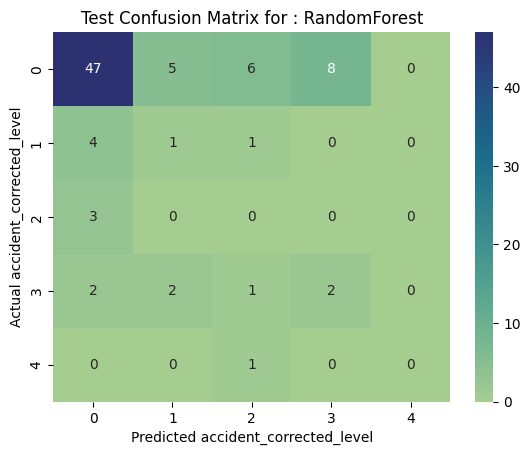

Accuracy Score with testing data - Bagging: 68.67%
Accuracy Score with training data - Bagging: 99.92%
Classification Metrics for Bagging: 
              precision    recall  f1-score   support

           0       0.80      0.85      0.82        66
           1       0.00      0.00      0.00         6
           2       0.20      0.33      0.25         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         1

   micro avg       0.69      0.69      0.69        83
   macro avg       0.20      0.24      0.21        83
weighted avg       0.64      0.69      0.66        83



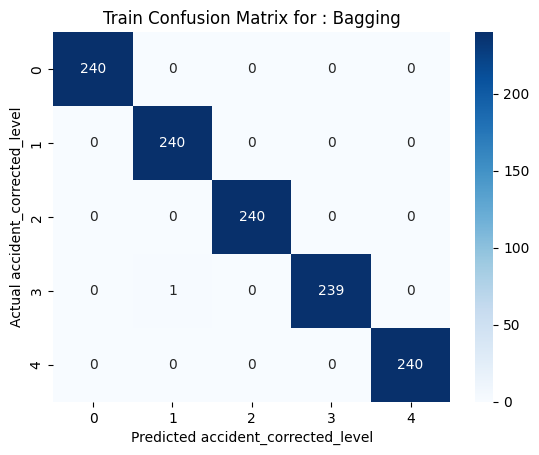

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


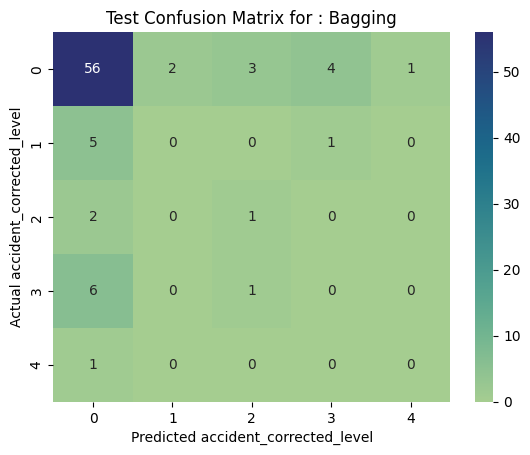

Accuracy Score with testing data - AdaBoost: 20.48%
Accuracy Score with training data - AdaBoost: 48.17%
Classification Metrics for AdaBoost: 
              precision    recall  f1-score   support

           0       0.80      0.18      0.30        66
           1       0.07      0.33      0.12         6
           2       0.00      0.00      0.00         3
           3       0.11      0.43      0.18         7
           4       0.00      0.00      0.00         1

   micro avg       0.20      0.20      0.20        83
   macro avg       0.20      0.19      0.12        83
weighted avg       0.65      0.20      0.26        83



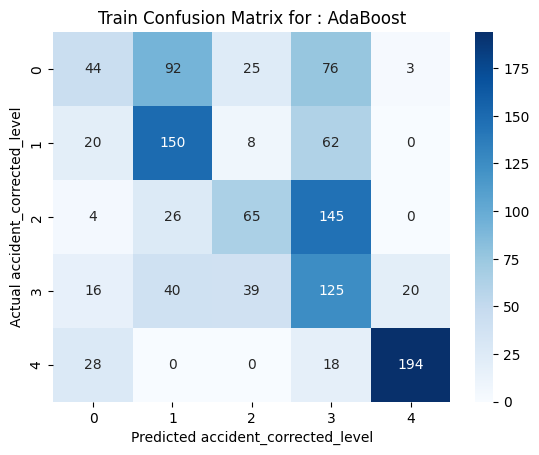

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


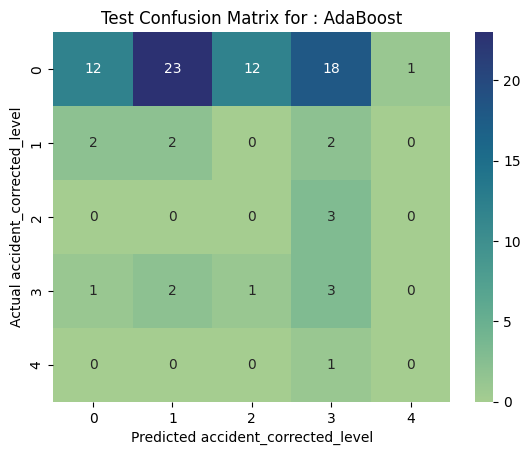

Accuracy Score with testing data - Gradient Boost: 68.67%
Accuracy Score with training data - Gradient Boost: 99.92%
Classification Metrics for Gradient Boost: 
              precision    recall  f1-score   support

           0       0.83      0.82      0.82        66
           1       0.00      0.00      0.00         6
           2       0.11      0.33      0.17         3
           3       0.33      0.29      0.31         7
           4       0.00      0.00      0.00         1

   micro avg       0.69      0.69      0.69        83
   macro avg       0.26      0.29      0.26        83
weighted avg       0.69      0.69      0.69        83



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


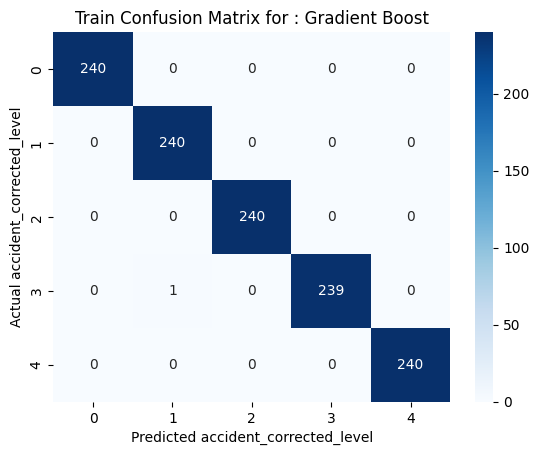

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


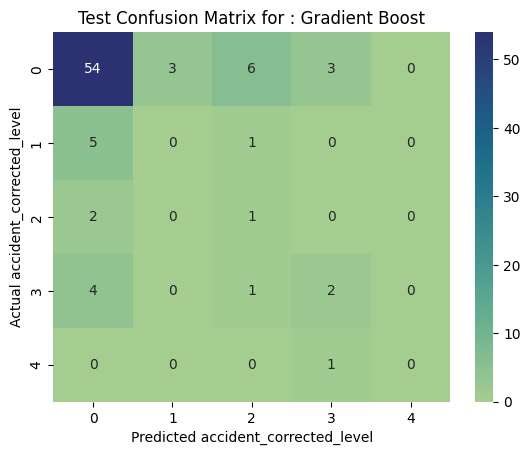

Accuracy Score with testing data - XGBoost: 71.08%
Accuracy Score with training data - XGBoost: 99.92%
Classification Metrics for XGBoost: 
              precision    recall  f1-score   support

           0       0.81      0.86      0.84        66
           1       0.00      0.00      0.00         6
           2       0.25      0.33      0.29         3
           3       0.20      0.14      0.17         7
           4       0.00      0.00      0.00         1

   micro avg       0.71      0.71      0.71        83
   macro avg       0.25      0.27      0.26        83
weighted avg       0.67      0.71      0.69        83



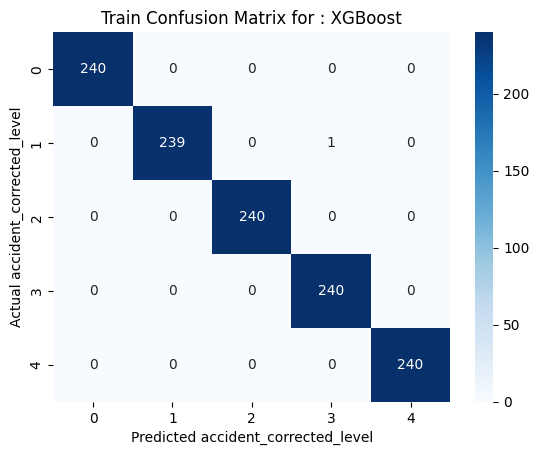

------------------------**************************&&&&&&&&&&&&&&&&&%%%%%%%%%%%%%$$$$$$$$$$-------------------


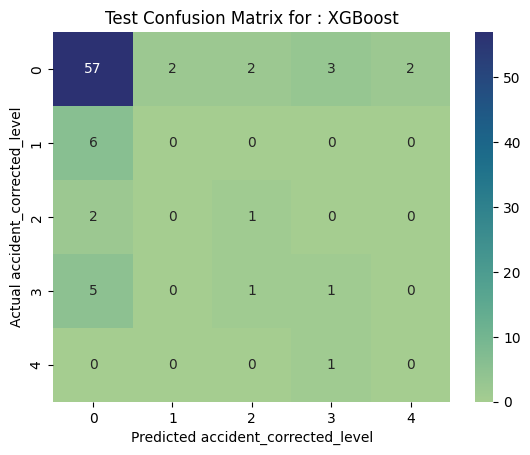

,Embedding,model,train_score,test_score
LogisticRegression,GloVe,LogisticRegression(),0.890833,0.481928
Naive Bayes,GloVe,GaussianNB(),0.791667,0.590361
KNN,GloVe,"KNeighborsClassifier(algorithm='kd_tree', weig...",0.999167,0.180723
SVM,GloVe,"SVC(C=10, gamma=0.1, kernel='linear', probabil...",0.975833,0.542169
DecisionTree,GloVe,"DecisionTreeClassifier(criterion='entropy', ma...",0.893333,0.409639
RandomForest,GloVe,"(DecisionTreeClassifier(max_depth=5, max_featu...",0.985833,0.60241
Bagging,GloVe,(DecisionTreeClassifier(random_state=542474257...,0.999167,0.686747
AdaBoost,GloVe,"(DecisionTreeClassifier(max_depth=1, random_st...",0.481667,0.204819
Gradient Boost,GloVe,([DecisionTreeRegressor(criterion='friedman_ms...,0.999167,0.686747
XGBoost,GloVe,"XGBClassifier(base_score=None, booster=None, c...",0.999167,0.710843


In [ ]:
# Fit the models using GloVe embeddings on balanced dataset
print ("Fitting ML classifiers using GloVe embeddings:")
X_train, X_test, y_train, y_test = apply_train_test_split(X_Glove, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_Glove = fit_models_balanced('GloVe',models, X_resampled, y_resampled, X_test, y_test)

result_df = {}
result_df = pd.DataFrame(fitted_models_Glove)
result_GV_bal = result_df.transpose()

result_GV_bal

#**Milestone 2:**

**Step 1: Design, train and test Neural networks classifiers [ 5 points ]**

In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical
import pickle

# Building neural network model
model_nn=tf.keras.models.Sequential()
def nn_model(embed, X_resampled, y_resampled, X_test, y_test):
  name = embed
  epochs = 20
  batch_size = 10
  loss = "categorical_crossentropy"
  optimizer = "adam"
  metrics = ["accuracy"]

  callbacks = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=3)

  # Build neural network
  model_nn =tf.keras.models.Sequential()
  model_nn.add(tf.keras.layers.Input(shape=(X_resampled.shape[1],)))
  model_nn.add(tf.keras.layers.Dense(512, activation='relu'))
  model_nn.add(tf.keras.layers.Dense(128, activation='relu'))
  model_nn.add(tf.keras.layers.Dense(64, activation='relu'))
  model_nn.add(tf.keras.layers.Dense(32, activation='relu'))
  model_nn.add(tf.keras.layers.Dense(5, activation='softmax'))
  #model compile
  model_nn.compile(optimizer=optimizer, loss=loss, metrics=metrics)
  if isinstance(X_resampled, pd.DataFrame):
    X_resampled = X_resampled.to_numpy()
  if isinstance(X_test, pd.DataFrame):
    X_test = X_test.to_numpy()
  y_train_encoded = to_categorical(y_resampled, num_classes=5)
  y_test_encoded = to_categorical(y_test, num_classes=5)
  model_nn.fit(X_resampled, y_train_encoded, validation_data=(X_test, y_test_encoded), epochs=epochs, batch_size=batch_size)

  # Make predictions on test data
  y_pred = model_nn.predict(X_test)
  y_train_pred = model_nn.predict(X_resampled)

  y_pred_classes = np.argmax(y_pred, axis=1)
  y_train_pred = np.argmax(y_train_pred, axis=1)

  # Calculate accuracy score
  score = accuracy_score(y_test, y_pred_classes)
  train_score=accuracy_score(y_resampled, y_train_pred)
  print("Accuracy Score with testing data - "+name+": {0:0.2f}%".format(score*100))
  print("Accuracy Score with training data - "+name+": {0:0.2f}%".format(train_score*100))
  model_scores = {'Embedding':embed, 'train_score': train_score, 'test_score': score}
  if(embed == 'GloVe'):
    with open(filename, 'wb') as file:
      pickle.dump('/content/drive/MyDrive/Colab Notebooks/model_nn.pkl', file)
    #Saving only glove embedding model as this is considered as best in Nerual Network Models
      #Its suggested this Neural network had to pickled in .h5 extension as its posing issue while unpickling in chatbot application
      model_nn.save('/content/drive/MyDrive/Colab Notebooks/model_nn.h5')
      print("Model saved successfully.")
      file.close()


  return model_scores

In [ ]:
#GloVe Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_Glove, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_Glove_NN = nn_model('GloVe', X_resampled, y_resampled, X_test, y_test)

Epoch 1/20
120/120 [==============================] - 4s 9ms/step - loss: 1.3936 - accuracy: 0.3775 - val_loss: 1.9482 - val_accuracy: 0.1325
Epoch 2/20
120/120 [==============================] - 1s 7ms/step - loss: 0.9455 - accuracy: 0.6033 - val_loss: 1.4029 - val_accuracy: 0.4337
Epoch 3/20
120/120 [==============================] - 2s 14ms/step - loss: 0.6668 - accuracy: 0.7433 - val_loss: 1.3947 - val_accuracy: 0.3614
Epoch 4/20
120/120 [==============================] - 1s 7ms/step - loss: 0.4526 - accuracy: 0.8433 - val_loss: 1.4319 - val_accuracy: 0.6506
Epoch 5/20
120/120 [==============================] - 1s 4ms/step - loss: 0.2983 - accuracy: 0.9042 - val_loss: 2.2204 - val_accuracy: 0.4699
Epoch 6/20
120/120 [==============================] - 1s 6ms/step - loss: 0.2458 - accuracy: 0.9275 - val_loss: 1.3367 - val_accuracy: 0.6506
Epoch 7/20
120/120 [==============================] - 1s 11ms/step - loss: 0.1671 - accuracy: 0.9542 - val_loss: 1.6669 - val_accuracy: 0.5904
Epoc

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model saved successfully.


In [ ]:
# Fitting the neural network model using different embeddings

#TFIDF Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_tfidf, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_tfidf = nn_model('tfidf', X_resampled, y_resampled, X_test, y_test)


#CountVectorizer Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_Cvect, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_Cvect = nn_model('CountVectorizer', X_resampled, y_resampled, X_test, y_test)

#FastText Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_fasttext, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_fasttext = nn_model('FastText', X_resampled, y_resampled, X_test, y_test)

#Word2Vec Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_Word2Vec, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_Word2Vec = nn_model('Word2Vec', X_resampled, y_resampled, X_test, y_test)

#GloVe Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_Glove, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_Glove_NN = nn_model('GloVe', X_resampled, y_resampled, X_test, y_test)

Epoch 1/20
120/120 [==============================] - 5s 28ms/step - loss: 0.5261 - accuracy: 0.8550 - val_loss: 1.3979 - val_accuracy: 0.7470
Epoch 2/20
120/120 [==============================] - 3s 28ms/step - loss: 0.0243 - accuracy: 0.9950 - val_loss: 1.5868 - val_accuracy: 0.7711
Epoch 3/20
120/120 [==============================] - 2s 20ms/step - loss: 0.0227 - accuracy: 0.9950 - val_loss: 1.6833 - val_accuracy: 0.7590
Epoch 4/20
120/120 [==============================] - 2s 18ms/step - loss: 0.0152 - accuracy: 0.9958 - val_loss: 1.6591 - val_accuracy: 0.7470
Epoch 5/20
120/120 [==============================] - 2s 16ms/step - loss: 0.0064 - accuracy: 0.9983 - val_loss: 1.9056 - val_accuracy: 0.6747
Epoch 6/20
120/120 [==============================] - 3s 21ms/step - loss: 0.0129 - accuracy: 0.9950 - val_loss: 1.8865 - val_accuracy: 0.6867
Epoch 7/20
120/120 [==============================] - 3s 23ms/step - loss: 0.0144 - accuracy: 0.9958 - val_loss: 1.7753 - val_accuracy: 0.7229

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model saved successfully.


In [ ]:
print ("Results for Neural Network Model with different embeddings:")
result_df = {}
result_df= pd.DataFrame(fitted_models_tfidf, index=[0])
result_df.loc[len(result_df.index)] = fitted_models_Cvect
result_df.loc[len(result_df.index)] = fitted_models_fasttext
result_df.loc[len(result_df.index)] = fitted_models_Word2Vec
result_df.loc[len(result_df.index)] = fitted_models_Glove_NN
result_df

Results for Neural Network Model with different embeddings:


,Embedding,train_score,test_score
0,tfidf,0.995000,0.686747
1,CountVectorizer,0.991667,0.626506
2,FastText,0.200000,0.072289
3,Word2Vec,0.315833,0.048193
4,GloVe,0.995833,0.746988


#Step 2: Design, train and test RNN or LSTM classifiers [ 10 points ]

In [ ]:
#Building RNN Model

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense
from tensorflow.keras.callbacks import EarlyStopping

def rnn_model(embed, X_resampled, y_resampled, X_test, y_test):
  name = embed
  epochs = 20
  batch_size = 10
  loss = "categorical_crossentropy"
  optimizer = "adam"
  metrics = ["accuracy"]

  callbacks = EarlyStopping(monitor='val_loss', mode='auto', verbose=0, patience=2)

  # Convert Pandas DataFrames to NumPy arrays if necessary
  if isinstance(X_resampled, pd.DataFrame):
    X_resampled = X_resampled.to_numpy()
  if isinstance(X_test, pd.DataFrame):
    X_test = X_test.to_numpy()

  # Reshape X_train and X_test to include the timesteps dimension
  X_resampled = X_resampled.reshape(X_resampled.shape[0], X_resampled.shape[1],1)
  X_test = X_test.reshape(X_test.shape[0], X_test.shape[1],1)

  # Define the input shape with timesteps
  input_shape = (X_resampled.shape[1],1)  # (timesteps, features)

  # Define the model
  model_rr = Sequential()
  model_rr.add(SimpleRNN(32, input_shape=input_shape, return_sequences=True))  # RNN layer with 32 units
  model_rr.add(SimpleRNN(16))  # RNN layer with 16 units
  model_rr.add(Dense(5, activation='softmax'))  # Output layer with 5 nodes and softmax activation

  # Compile the model
  model_rr.compile(optimizer=optimizer, loss=loss, metrics=metrics)

  # Ensure that labels correspond to the resampled data
  y_train_encoded = to_categorical(y_resampled, num_classes=5)
  y_test_encoded = to_categorical(y_test, num_classes=5)


  # Train the model
  model_rr.fit(X_resampled, y_train_encoded,  # Use encoded labels
            validation_data=(X_test, y_test_encoded),  # Use encoded labels
            epochs=epochs, batch_size=batch_size,
            callbacks=callbacks)

  # Make predictions on test data
  y_pred = model_rr.predict(X_test)
  y_train_pred = model_rr.predict(X_resampled)

  y_pred_classes = np.argmax(y_pred, axis=1)
  y_train_pred = np.argmax(y_train_pred, axis=1)

  # Calculate accuracy score
  score = accuracy_score(y_test, y_pred_classes)
  train_score=accuracy_score(y_resampled, y_train_pred)
  print("Accuracy Score with testing data - "+name+": {0:0.2f}%".format(score*100))
  print("Accuracy Score with training data - "+name+": {0:0.2f}%".format(train_score*100))
  model_scores = {'Embedding':embed, 'train_score': train_score, 'test_score': score}
  return model_scores

In [ ]:
# Fitting the RNN model using different embeddings

#TFIDF Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_tfidf, data['Accident Level'])
X_resampled_tfidf, y_resampled_tfidf = apply_SMOTE(X_train,y_train)
fitted_models_tfidf = rnn_model('tfidf', X_resampled_tfidf, y_resampled_tfidf, X_test, y_test)


#CountVectorizer Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_Cvect, data['Accident Level'])
X_resampled_cvect, y_resampled_cvect = apply_SMOTE(X_train,y_train)
fitted_models_Cvect = rnn_model('CountVectorizer', X_resampled_cvect, y_resampled_cvect, X_test, y_test)

#FastText Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_fasttext, data['Accident Level'])
X_resampled_fasttext, y_resampled_fasttext = apply_SMOTE(X_train,y_train)
fitted_models_fasttext = rnn_model('FastText', X_resampled_fasttext, y_resampled_fasttext, X_test, y_test)

#Word2Vec Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_Word2Vec, data['Accident Level'])
X_resampled_word2vec, y_resampled_word2vec = apply_SMOTE(X_train,y_train) #Uncomment this line
fitted_models_Word2Vec = rnn_model('Word2Vec', X_resampled_word2vec, y_resampled_word2vec, X_test, y_test)

#GloVe Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_Glove, data['Accident Level'])
X_resampled_glove, y_resampled_glove = apply_SMOTE(X_train,y_train) #Uncomment this line
fitted_models_Glove_NN = rnn_model('GloVe', X_resampled_glove, y_resampled_glove, X_test, y_test)

Epoch 1/20
120/120 [==============================] - 185s 2s/step - loss: 1.6267 - accuracy: 0.1733 - val_loss: 1.6693 - val_accuracy: 0.0723
Epoch 2/20
120/120 [==============================] - 182s 2s/step - loss: 1.6174 - accuracy: 0.1950 - val_loss: 1.6326 - val_accuracy: 0.0361
Epoch 3/20
120/120 [==============================] - 181s 2s/step - loss: 1.6136 - accuracy: 0.2000 - val_loss: 1.7442 - val_accuracy: 0.0723
Epoch 4/20
120/120 [==============================] - 187s 2s/step - loss: 1.6108 - accuracy: 0.2208 - val_loss: 1.6044 - val_accuracy: 0.0120
Epoch 5/20
120/120 [==============================] - 180s 2s/step - loss: 1.6076 - accuracy: 0.2300 - val_loss: 1.7984 - val_accuracy: 0.0723
Epoch 6/20
120/120 [==============================] - 181s 2s/step - loss: 1.6088 - accuracy: 0.2217 - val_loss: 1.4595 - val_accuracy: 0.7952
Epoch 7/20
120/120 [==============================] - 183s 2s/step - loss: 1.6080 - accuracy: 0.2175 - val_loss: 1.6158 - val_accuracy: 0.0361

In [ ]:
print ("Results for RNN Model with different embeddings:")
result_df = {}
result_df= pd.DataFrame(fitted_models_tfidf, index=[0])
result_df.loc[len(result_df.index)] = fitted_models_Cvect
result_df.loc[len(result_df.index)] = fitted_models_fasttext
result_df.loc[len(result_df.index)] = fitted_models_Word2Vec
result_df.loc[len(result_df.index)] = fitted_models_Glove_NN
result_df

Results for RNN Model with different embeddings:


,Embedding,train_score,test_score
0,tfidf,0.302500,0.084337
1,CountVectorizer,0.145833,0.072289
2,FastText,0.200000,0.060241
3,Word2Vec,0.183333,0.036145
4,GloVe,0.580000,0.168675


In [ ]:
#Building LSTM Model

import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import accuracy_score

def lstm_model(embed, X_resampled, y_resampled, X_test, y_test):
  name = embed
  epochs = 20
  batch_size = 10
  loss = "categorical_crossentropy"
  optimizer = "adam"
  metrics = ["accuracy"]

  callbacks = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=3)

  # Convert Pandas DataFrames to NumPy arrays if necessary
  if isinstance(X_resampled, pd.DataFrame):
    X_resampled = X_resampled.to_numpy()
  if isinstance(X_test, pd.DataFrame):
    X_test = X_test.to_numpy()

  # Reshape X_train to include a feature dimension if it's currently 2D
  if len(X_resampled.shape) == 2:
    X_resampled = X_resampled.reshape(X_resampled.shape[0], X_resampled.shape[1], 1)

  # Determine the number of classes
  num_classes = len(np.unique(y_resampled)) # y_train should correspond to X_resampled

  # Build LSTM network
  model_lstm = tf.keras.models.Sequential()
  model_lstm.add(tf.keras.layers.LSTM(units=128, input_shape=(X_resampled.shape[1], X_resampled.shape[2]), return_sequences=True))
  model_lstm.add(tf.keras.layers.LSTM(units=64, return_sequences=True))
  model_lstm.add(tf.keras.layers.LSTM(units=32))
  model_lstm.add(tf.keras.layers.Dense(units=num_classes, activation='softmax'))  # Output layer with num_classes units

  # Compile the model
  model_lstm.compile(optimizer=optimizer, loss=loss, metrics=metrics)

  # Print model summary
  model_lstm.summary()

  # Reshape X_train and X_test to include the timesteps dimension
  X_train_reshaped = X_resampled.reshape(X_resampled.shape[0], X_resampled.shape[1],1)
  X_test_reshaped = X_test.reshape(X_test.shape[0], X_test.shape[1],1)
  y_train_encoded = to_categorical(y_resampled, num_classes=5)
  y_test_encoded = to_categorical(y_test, num_classes=5)

  # Fit the model with reshaped data
  model_lstm.fit(X_train_reshaped, y_train_encoded, validation_data=(X_test_reshaped, y_test_encoded), epochs=epochs, batch_size=batch_size, callbacks=[callbacks]) # Use callbacks

  # Make predictions on test data
  y_pred = model_lstm.predict(X_test_reshaped)
  y_train_pred = model_lstm.predict(X_train_reshaped)

  y_pred_classes = np.argmax(y_pred, axis=1)
  y_train_pred = np.argmax(y_train_pred, axis=1)

  # Calculate accuracy score
  score = accuracy_score(y_test, y_pred_classes)
  train_score=accuracy_score(y_resampled, y_train_pred)
  print("Accuracy Score with testing data - "+name+": {0:0.2f}%".format(score*100))
  print("Accuracy Score with training data - "+name+": {0:0.2f}%".format(train_score*100))
  model_scores = {'Embedding':embed, 'train_score': train_score, 'test_score': score}
  return model_scores

In [ ]:
# Fitting the LSTM model using different embeddings

#TFIDF Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_tfidf, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_tfidf = lstm_model('tfidf', X_resampled, y_resampled, X_test, y_test)


#CountVectorizer Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_Cvect, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_Cvect = lstm_model('CountVectorizer', X_resampled, y_resampled, X_test, y_test)

#FastText Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_fasttext, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_fasttext = lstm_model('FastText', X_resampled, y_resampled, X_test, y_test)

#Word2Vec Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_Word2Vec, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_Word2Vec = lstm_model('Word2Vec', X_resampled, y_resampled, X_test, y_test)

#GloVe Embedding
X_train, X_test, y_train, y_test = apply_train_test_split(X_Glove, data['Accident Level'])
X_resampled, y_resampled = apply_SMOTE(X_train,y_train)
fitted_models_Glove_NN = lstm_model('GloVe', X_resampled, y_resampled, X_test, y_test)

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 2568, 128)         66560     
                                                                 
 lstm_4 (LSTM)               (None, 2568, 64)          49408     
                                                                 
 lstm_5 (LSTM)               (None, 32)                12416     
                                                                 
 dense_36 (Dense)            (None, 5)                 165       
                                                                 
Total params: 128549 (502.14 KB)
Trainable params: 128549 (502.14 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
120/120 [==============================] - 604s 5s/step - loss: 1.6102 - accuracy: 0.1992 - val_loss: 1.5536 - val_accuracy: 0.7952
Ep

In [ ]:
print ("Results for LSTM Model with different embeddings:")
result_df = {}
result_df= pd.DataFrame(fitted_models_tfidf, index=[0])
result_df.loc[len(result_df.index)] = fitted_models_Cvect
result_df.loc[len(result_df.index)] = fitted_models_fasttext
result_df.loc[len(result_df.index)] = fitted_models_Word2Vec
result_df.loc[len(result_df.index)] = fitted_models_Glove_NN
result_df

Results for LSTM Model with different embeddings:


,Embedding,train_score,test_score
0,tfidf,0.228333,0.072289
1,CountVectorizer,0.200000,0.084337
2,FastText,0.200000,0.036145
3,Word2Vec,0.200000,0.795181
4,GloVe,0.260000,0.120482


#Step 3: Choose the best performing classifier and pickle it. [ 5 points ]

# **Scores of MachineLearning and Neural Network Algorithms on SMOTE**

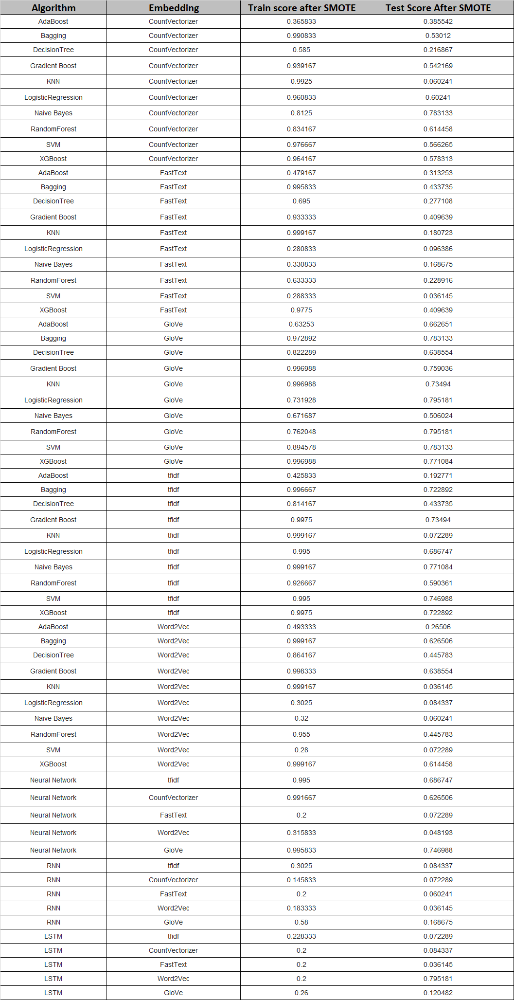

In [ ]:
#Taking neural Network Model as the best model
#Saved the model for Glove embedding
#model_nn.save('/content/drive/MyDrive/Colab Notebooks/model_nn_all.h5')


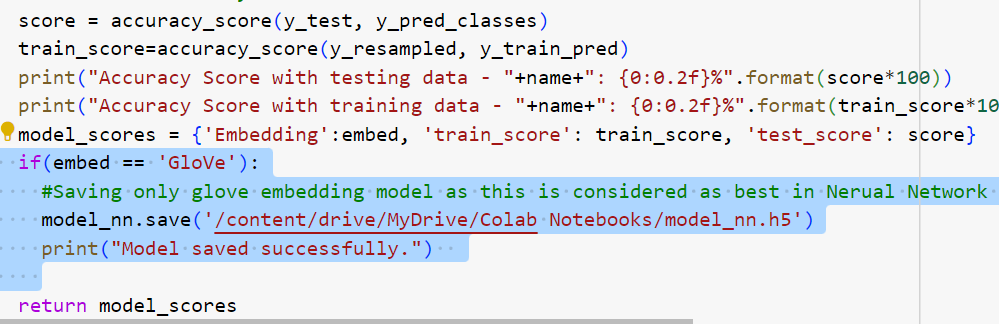

# **Sample Code for Chatbot (Pickling and unpickling)**

In [ ]:
glove_input_file = '/content/drive/MyDrive/glove.6B.100d.txt'
word2vec_output_file = 'glove.6B.100d.txt.word2vec'
glove2word2vec(glove_input_file, word2vec_output_file)

# load the Stanford GloVe model
filename = 'glove.6B.100d.txt.word2vec'
glove_model = KeyedVectors.load_word2vec_format(filename, binary=False)

# Retrieving the words present in the GloVe model's vocabulary
glove_words = glove_model.index_to_key

# Creating a dictionary of words and their corresponding vectors
glove_word_vector_dict = dict(zip(glove_model.index_to_key,list(glove_model.vectors)))

vec_size=100
def average_vectorizer_GloVe(doc):
    # Initializing a feature vector for the sentence
    feature_vector = np.zeros((vec_size,), dtype="float64")

    # Creating a list of words in the sentence that are present in the model vocabulary
    words_in_vocab = [word for word in doc.split() if word in glove_words]

    # adding the vector representations of the words
    for word in words_in_vocab:
        feature_vector += np.array(glove_word_vector_dict[word])

    # Dividing by the number of words to get the average vector
    if len(words_in_vocab) != 0:
        feature_vector /= len(words_in_vocab)

    return feature_vector

<ipython-input-68-ad4bb4fe915b>:3: DeprecationWarning: Call to deprecated `glove2word2vec` (KeyedVectors.load_word2vec_format(.., binary=False, no_header=True) loads GLoVE text vectors.).
  glove2word2vec(glove_input_file, word2vec_output_file)


#Steps involved in creating Chatbot:
1. Loaded NTLK packages <br>
2. Unpickled the model<br>
3. Passed GloVE embedding to the unpickled model


In [ ]:
import pickle
import re
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import gensim
import numpy as np
import pandas as pd

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from gensim.scripts.glove2word2vec import glove2word2vec
from gensim.models import KeyedVectors
from gensim.models import Word2Vec

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
def processData(text):
  # Load the model from the file
  with open("/content/drive/MyDrive/Colab Notebooks/models_nn.pkl", 'rb') as file:
      glove = pickle.load(file)


  testinput =text
  testinput=clean_text(testinput)
  outtest=average_vectorizer_GloVe(testinput)
  df_new = pd.DataFrame(columns=range(len(outtest))) # Create DataFrame with columns
  df_new.loc[len(df_new.index)] = outtest # Add the row
  glove.predict(df_new)
  y_test_pred=glove.predict(df_new)
  y_test_res=np.argmax(y_test_pred, axis=1)
  print("Response from BOT (Accident_level)Prediction  :   ",y_test_res[0]+1)


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:
import tensorflow
print(tensorflow.__version__)

2.15.0


# **Using Jupiter widget to test the code**

In [ ]:
!pip install ipywidgets
import ipywidgets as widgets

# Create a text input widget
text_input = widgets.Text(
    value='',
    placeholder='Type your message here',
    description='You:',
    disabled=False
)

# Create an output widget to display messages
output = widgets.Output()

# Define a function to handle user input
def handle_input(sender):
    user_input = sender.value
    with output:
        print(f"You: {user_input}")
        # Process user input and generate chatbot response here
        chatbot_response = processData(user_input)
        print(f"{chatbot_response}")

# Attach the event handler to the text input widget
text_input.on_submit(handle_input)

# Display the widgets
display(text_input, output)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.6 MB/s eta 0:00:00


Text(value='', description='You:', placeholder='Type your message here')

Output()